FIP200 LD and inclusion quantification  
- Exclude cells with faint inclusions that don’t segment.  
- %SA overlap between LDs and synuclein inclusions.  
- number of inclusions  
- surface area of inclusions  
- SA and number of LDs in inclusions and outside inclusions  
- analyze LDs only in green cells (Cellpose)  
- We imaged only cells that contain inclusions.  

Import Libraries

In [21]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.filters import gaussian, threshold_otsu, threshold_multiotsu
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects, binary_dilation, disk
import czifile
import skimage.io as io
from skimage import exposure
from cellpose import models
model = models.Cellpose(model_type='cyto')
model = models.Cellpose(model_type='nuclei')

Define Sub Functions

In [22]:
def show_image(image):
    io.imshow(image, cmap='gray')
    plt.show()

def preprocess_green_channel(green_channel):
    """Preprocess the green channel for cell segmentation and inclusion quantification."""
    confocal_img = gaussian(green_channel, sigma=2)
    confocal_img = exposure.adjust_sigmoid(green_channel, cutoff=0.25)
    confocal_img = (confocal_img - confocal_img.min()) / (confocal_img.max() - confocal_img.min())
    
    return confocal_img

def preprocess_dapi_channel(dapi_channel):
    """Preprocess the DAPI channel for nuclei quantification."""
    blurred_dapi = gaussian(dapi_channel, sigma=2)
    threshold_value = threshold_otsu(blurred_dapi)
    binary_image = blurred_dapi > threshold_value
    # show_image(binary_image)
    cleaned_image = remove_small_objects(binary_image, min_size=400)
    merged_image = binary_dilation(cleaned_image, footprint=disk(5))
    labeled_image = label(merged_image)
    return labeled_image

def count_nuclei(labeled_image):
    """Count the number of nuclei in the labeled image."""
    return len(np.unique(labeled_image)) - 1



In [23]:
def analyze_image(image_path, basename):
    """
    Analyze an image by its individual cells
    Args:
        image_path: Path to the .czi image file.
        basename: Base name for the file, used in the output DataFrame.

    Returns:
        A DataFrame containing details about each image 
        A second DataFrame containing details about each detected cell
    """
    
    # Load the image and squeeze dimensions
    image = czifile.imread(image_path)
    image_squeezed = np.squeeze(image)

    # Separate the channels
    red_channel = image_squeezed[0, :, :]
    green_channel = image_squeezed[1, :, :]

    threshold_red = threshold_otsu(gaussian(red_channel)) + 0.1
    red_channel_thresholded = gaussian(red_channel) > threshold_red

    # TODO: use cellpose for red channel

    print("Red Channel")
    show_image(red_channel_thresholded)

    green_channel = preprocess_green_channel(green_channel)
    print("Green Channel")
    show_image(green_channel)


    green_channel_remove_inclusions = np.where(green_channel < 0.8, green_channel, 0) # remove inclusions
    green_channel_remove_inclusions = gaussian(green_channel_remove_inclusions, sigma=10) # blur

    # Detect cells in the green channel
    masks, flows, styles, diams = model.eval(green_channel_remove_inclusions, diameter=300, channels=[0, 0])
    labeled_cells = label(masks)
    
    print("Segmented Cells")
    show_image(labeled_cells)


    # Initialize lists to store results
    num_inclusions = []
    total_inclusion_areas = []


    number_of_ld_in_inclusions_list = []
    area_of_ld_in_inclusions_list = []
    number_of_ld_outside_inclusions_list = []
    area_of_ld_outside_inclusions_list = []

    # Analyze each detected cell
    for i, cell in enumerate(regionprops(labeled_cells)):
        if cell.area < 100:
            continue
        
        
        mask = labeled_cells == cell.label
        
        applied_mask_blurred = gaussian(green_channel, sigma=5) * mask
        applied_mask_eliminate_background = applied_mask_blurred[applied_mask_blurred > 0] # filter out 0
        
        # normalize 
        applied_mask_eliminate_background = (applied_mask_eliminate_background - np.min(applied_mask_eliminate_background)) / ((np.max(applied_mask_eliminate_background) - np.min(applied_mask_eliminate_background)))

        # calculate statistics
        mean_intensity = np.mean(applied_mask_eliminate_background)
        median_intensity = np.median(applied_mask_eliminate_background)
        q1 = np.percentile(applied_mask_eliminate_background, 25)
        q3 = np.percentile(applied_mask_eliminate_background, 75)
        
        hist, bin_edges = np.histogram(applied_mask_eliminate_background, bins='fd')
        
        applied_mask = green_channel * mask
        # 0.4 is an empirical value that seems to work well
        if q3 < 0.4 and len(bin_edges) > 20:
            # the population is skewed to the left, indicating that there are inclusions
            threshold = max(threshold_otsu(applied_mask),0.5) # use otsu thresholding to find the threshold
        elif q3 >= 0.9:
            # definitely no inclusions
            threshold = 1
        else:
            # probably no inclusions, but not sure, so we set a very high threshold in case there are inclusions
            threshold = 0.99
        
        inclusions = applied_mask > threshold # apply the threshold
        inclusions_labeled = label(inclusions)

        
        ld_cell = red_channel_thresholded*mask # find the lipid droplets in the cell
        ld_cell_labeled = label(ld_cell) # label the lipid droplets in the cell
        number_of_ld_in_inclusions = 0
        area_of_ld_in_inclusions = 0
        number_of_ld_outside_inclusions = 0
        area_of_ld_outside_inclusions = 0
        for ld in regionprops(ld_cell_labeled):
            if ld.area < 10:
                continue
            ld_image = ld_cell_labeled == ld.label
            # show_image(ld_image)
            overlap = inclusions_labeled * ld_image
            if np.sum(overlap) > 0:
                number_of_ld_in_inclusions += 1
                area_of_ld_in_inclusions += ld.area
            else:
                number_of_ld_outside_inclusions += 1
                area_of_ld_outside_inclusions += ld.area
        number_of_ld_in_inclusions_list.append(number_of_ld_in_inclusions)
        area_of_ld_in_inclusions_list.append(area_of_ld_in_inclusions)
        number_of_ld_outside_inclusions_list.append(number_of_ld_outside_inclusions)
        area_of_ld_outside_inclusions_list.append(area_of_ld_outside_inclusions)
                

        inclusion_areas = [inclusion.area for inclusion in regionprops(inclusions_labeled) if inclusion.area > 10] # filter out small inclusions
        inclusion_areas = np.array(inclusion_areas)
        total_inclusion_area = np.sum(inclusion_areas)
        
        if len(inclusion_areas) > 0:
            print("Threshold: ", threshold)
            print("Bin count", len(bin_edges))

            plt.hist(applied_mask_eliminate_background, bins='fd')  
            plt.axvline(mean_intensity, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_intensity:.2f}')
            plt.axvline(median_intensity, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median_intensity:.2f}')
            plt.axvline(q1, color='blue', linestyle='dashed', linewidth=2, label=f'Q1: {q1:.2f}')
            plt.axvline(q3, color='purple', linestyle='dashed', linewidth=2, label=f'Q3: {q3:.2f}')
            plt.legend()
            plt.title("Intensity histogram")
            plt.show()

            print("Inclusion Areas: ", inclusion_areas)
            show_image(inclusions)
            
        
        # store results
        total_inclusion_areas.append(total_inclusion_area)
        num_inclusions.append(len(inclusion_areas))
    
    # analysis by image
    df1 = pd.DataFrame({
        "File_Name:": [basename],
        "Number_of_Inclusions": [np.sum(num_inclusions)],
        "Area_of_Inclusions": [np.sum(total_inclusion_areas)],
        "Number_of_LD_in_Inclusions": [np.sum(number_of_ld_in_inclusions_list)],
        "Area_of_LD_in_Inclusions": [np.sum(area_of_ld_in_inclusions_list)],
        "Number_of_LD_outside_Inclusions": [np.sum(number_of_ld_outside_inclusions_list)],
        "Area_of_LD_outside_Inclusions": [np.sum(area_of_ld_outside_inclusions_list)],
    })
    
   
    return df1

In [24]:
def analyze_all_images(image_folder):
    all_data_1 = []
    for well_image in os.listdir(image_folder):
        
        if well_image.lower().endswith(".czi"):  # Filter for CZI files
            
            print(well_image)

            well_image_path = os.path.join(image_folder, well_image)
            well_image_base_name = os.path.basename(well_image)[:-4]
            
            df1 = analyze_image(well_image_path, well_image_base_name)
            all_data_1.append(df1)
            
            print("-" * 200)

    combined_df_1 = pd.concat(all_data_1, ignore_index=True)
    combined_df_1.to_excel(f"{image_folder[:6]}_analysis_by_image.xlsx", index=False)


Define Main Function

In [27]:
# folders = ['11725_lipidDroplets_FIP200','12425_LipidDroplets_FIP200']
folders = ['12425_LipidDroplets_FIP200']

1K_FIP200_LT_noOA_01.czi
Red Channel


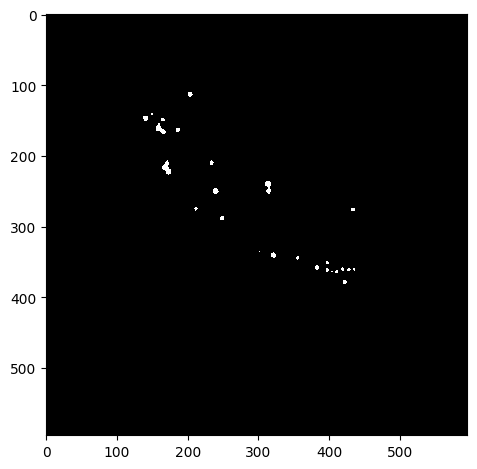

Green Channel


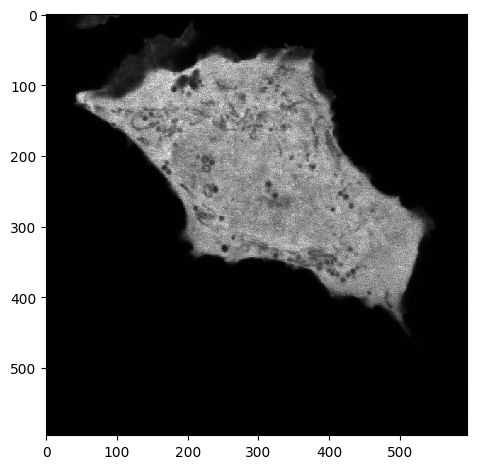

Segmented Cells


c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:158: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


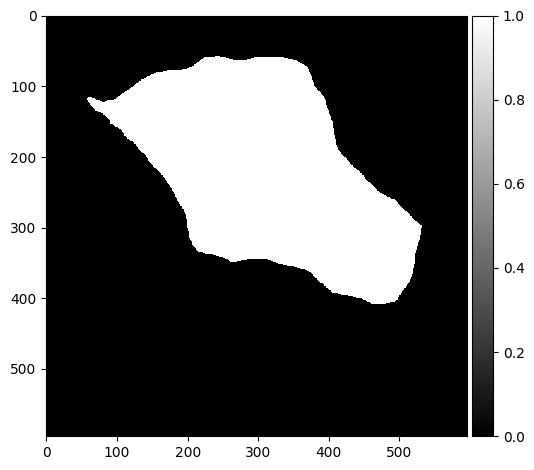

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_02.czi
Red Channel


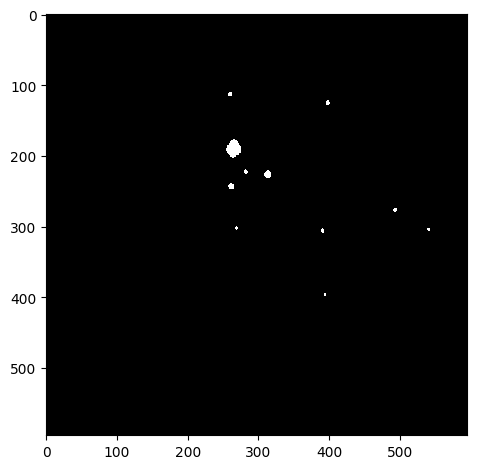

Green Channel


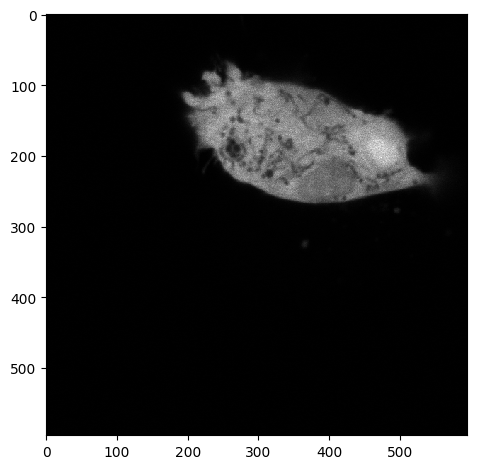

Segmented Cells


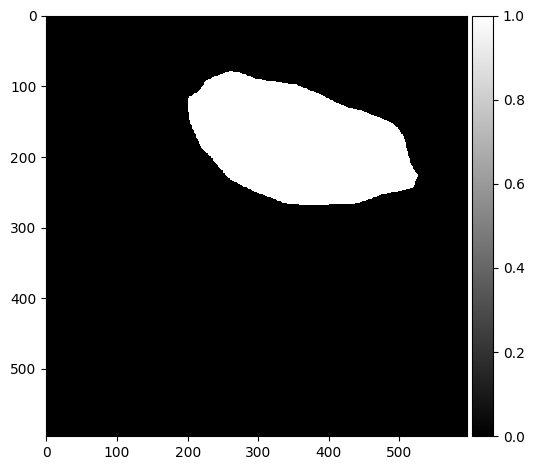

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_03.czi
Red Channel


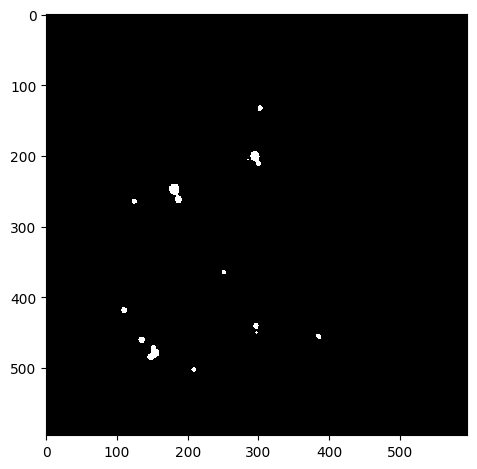

Green Channel


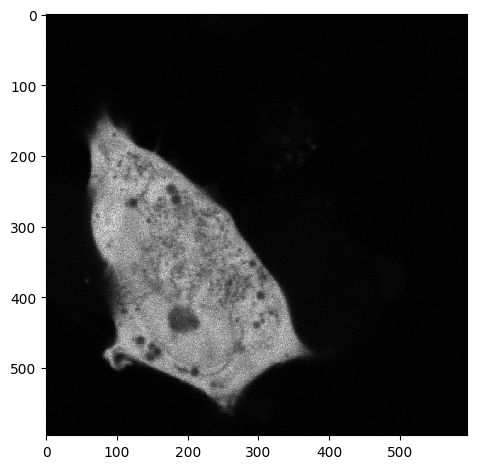

Segmented Cells


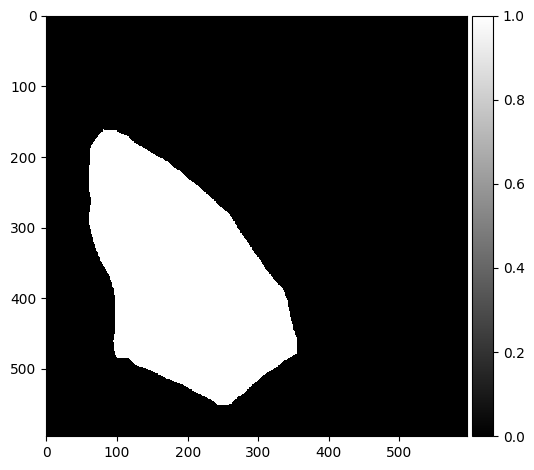

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_04.czi
Red Channel


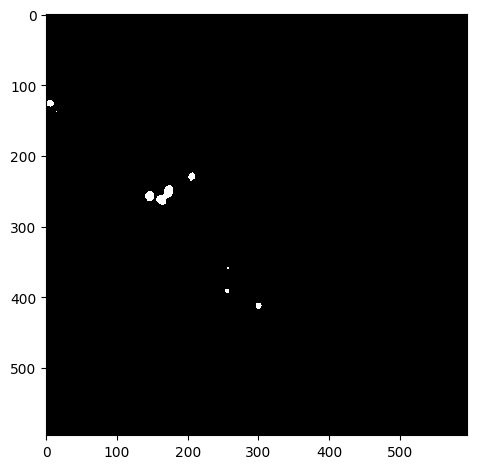

Green Channel


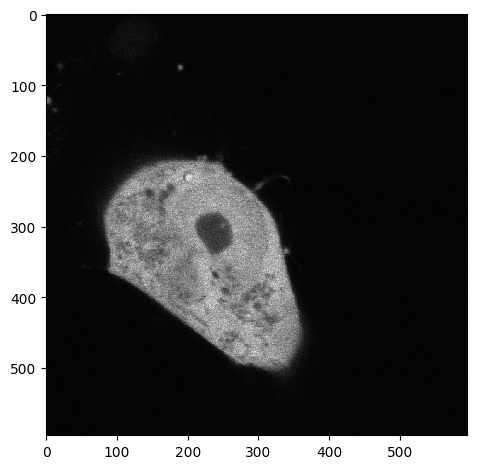

Segmented Cells


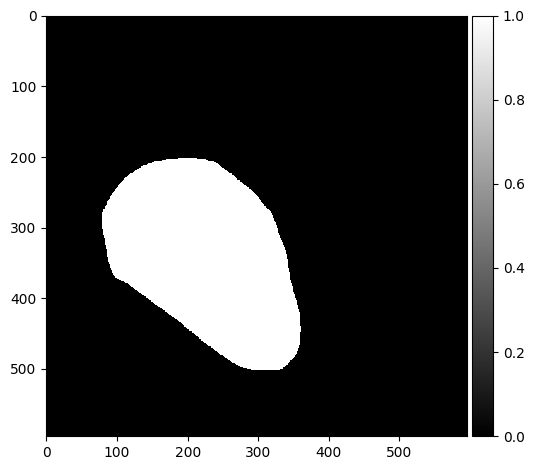

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_05.czi
Red Channel


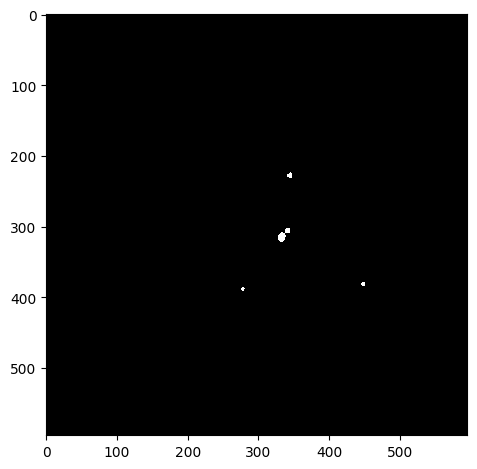

Green Channel


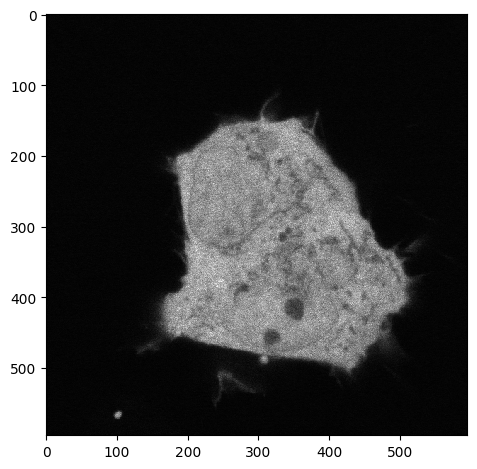

Segmented Cells


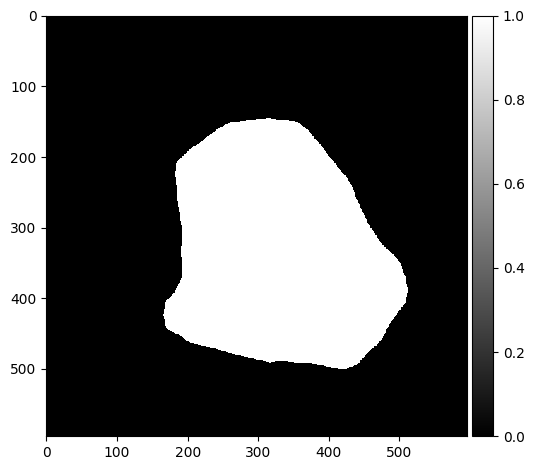

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_06.czi
Red Channel


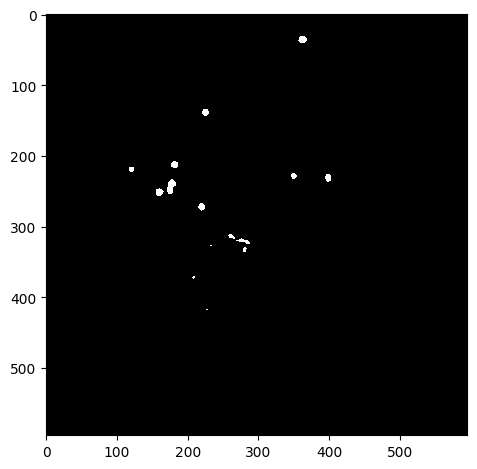

Green Channel


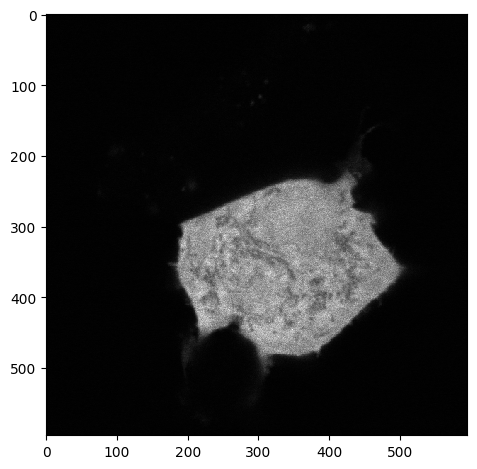

Segmented Cells


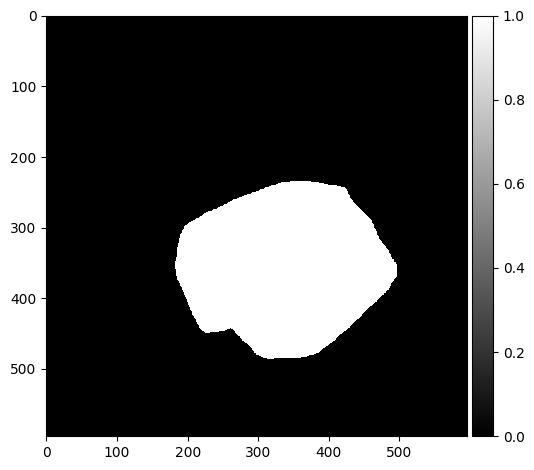

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_01.czi
Red Channel


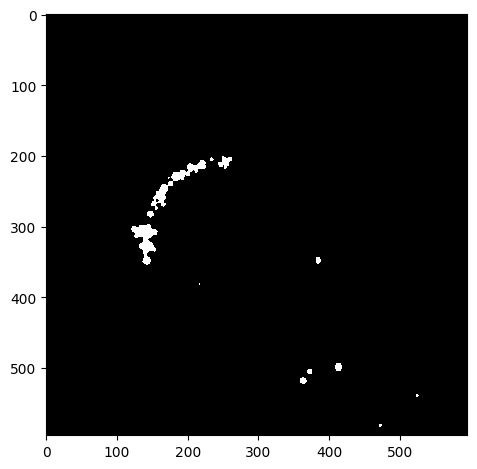

Green Channel


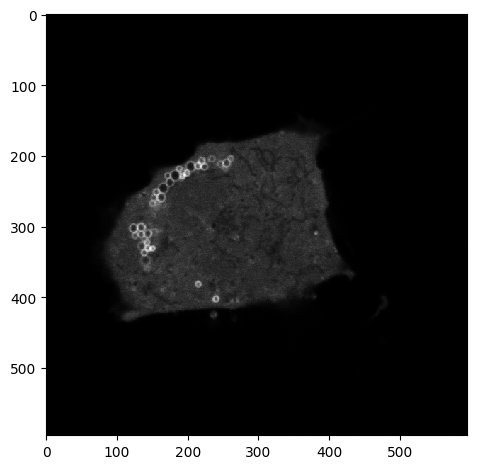

Segmented Cells


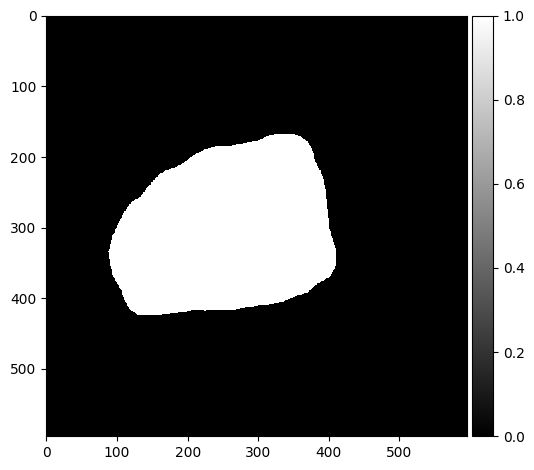

Threshold:  0.5
Bin count 332


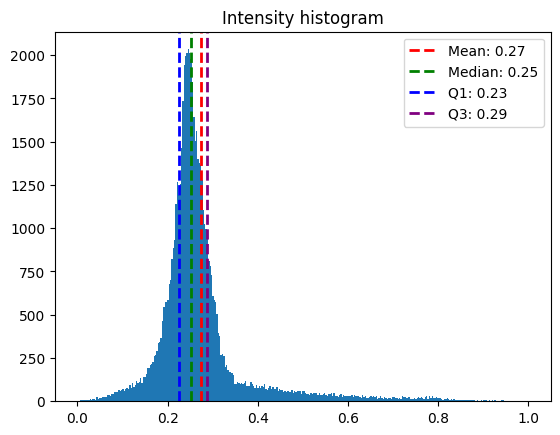

Inclusion Areas:  [127.  14.  34. 172.  14. 164. 389.  41.  52.]


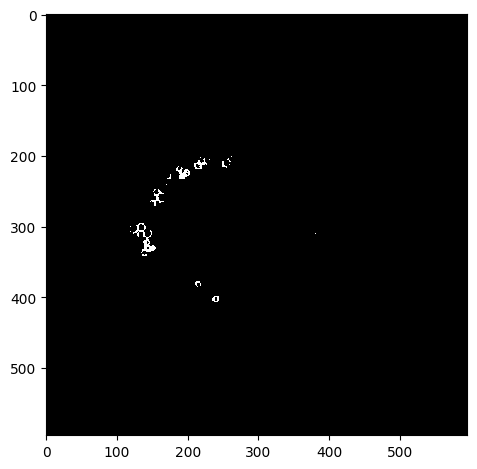

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_02.czi
Red Channel


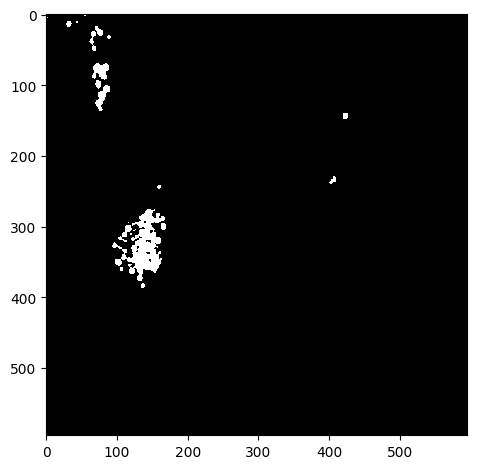

Green Channel


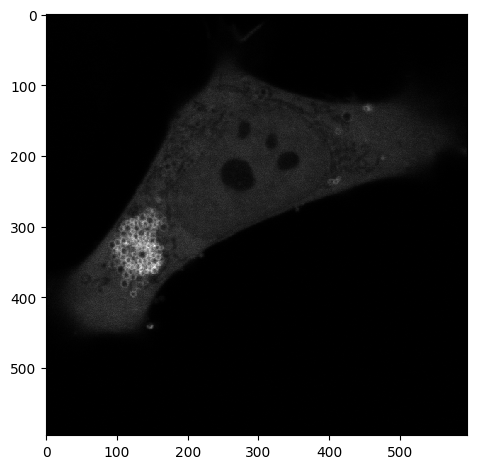

Segmented Cells


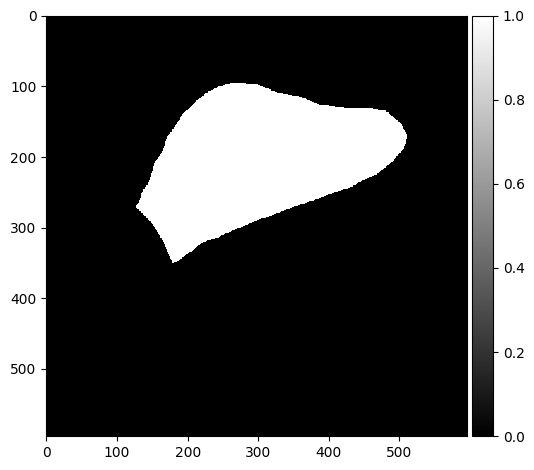

Threshold:  0.5
Bin count 242


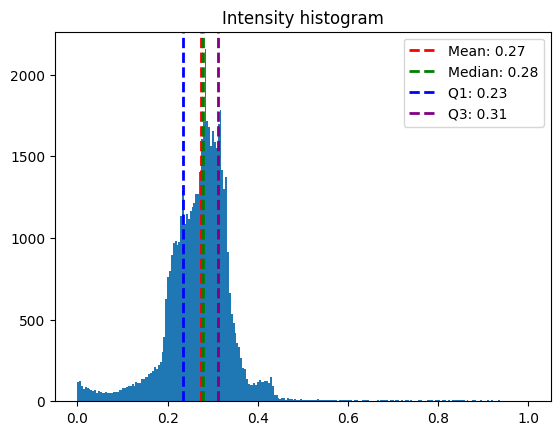

Inclusion Areas:  [12.]


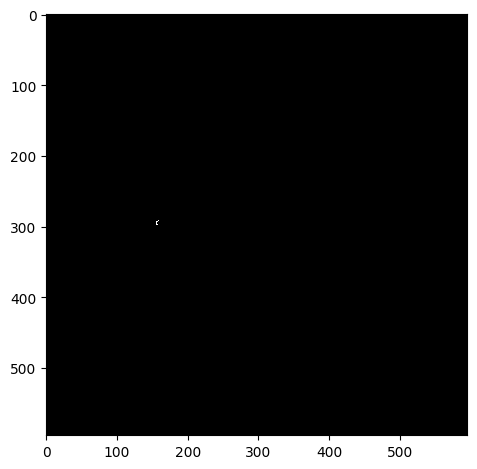

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_03.czi
Red Channel


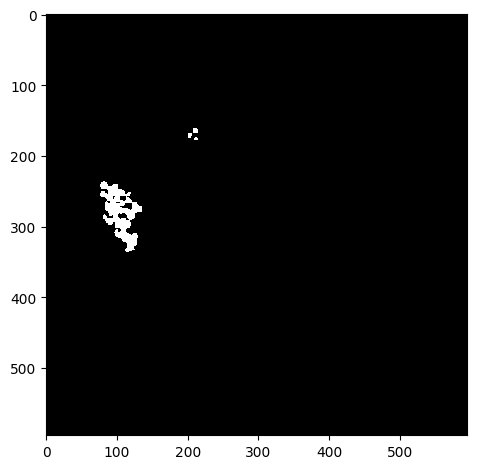

Green Channel


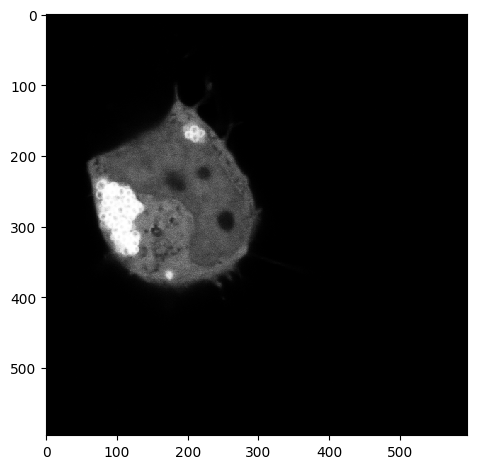

Segmented Cells


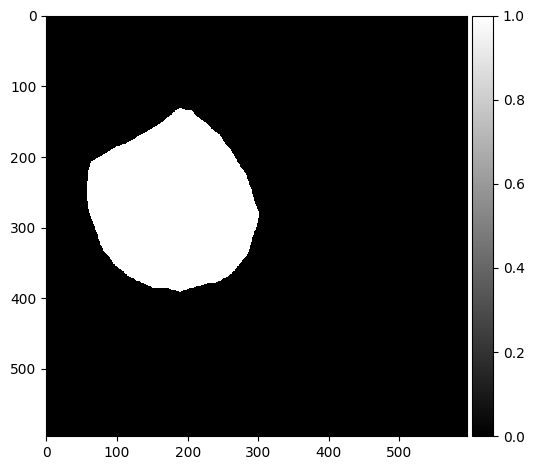

Threshold:  0.5
Bin count 153


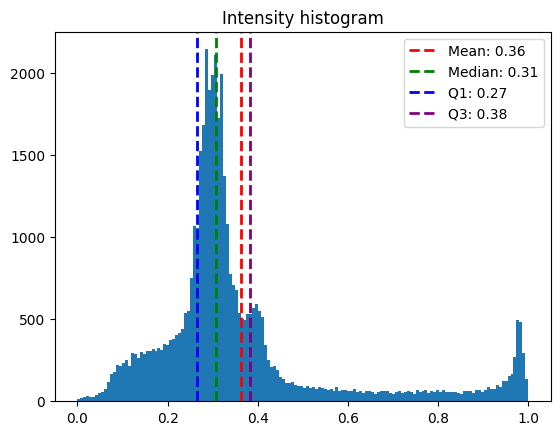

Inclusion Areas:  [ 709. 5398.   25.   14.  172.]


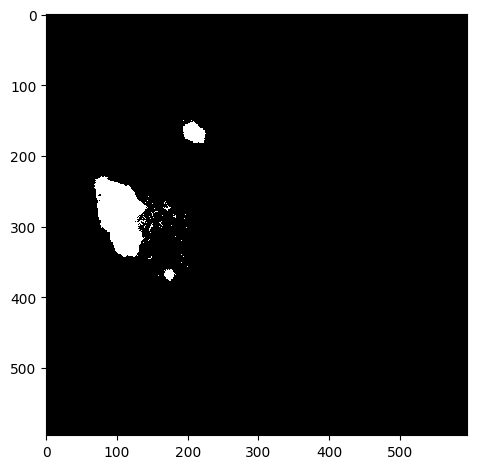

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_04.czi
Red Channel


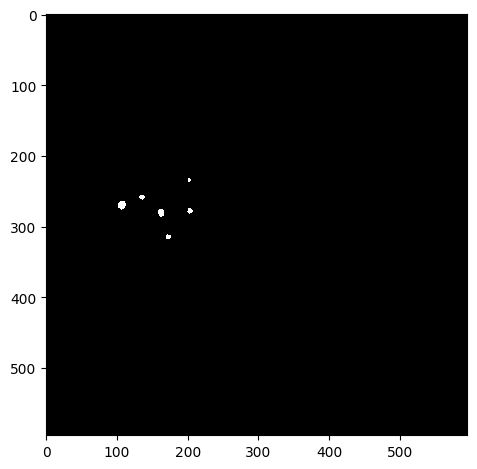

Green Channel


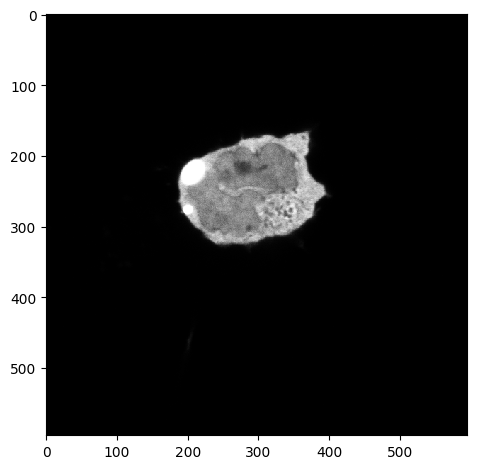

Segmented Cells


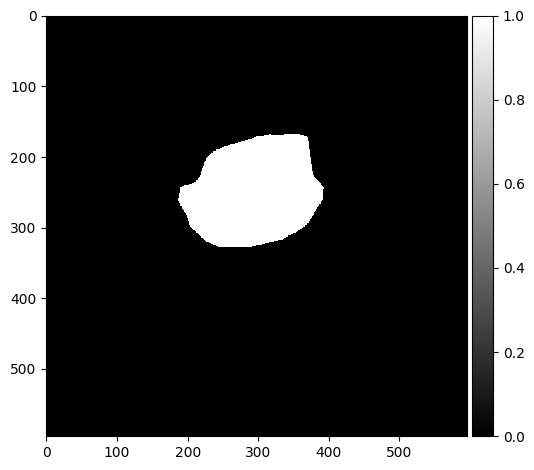

Threshold:  0.99
Bin count 98


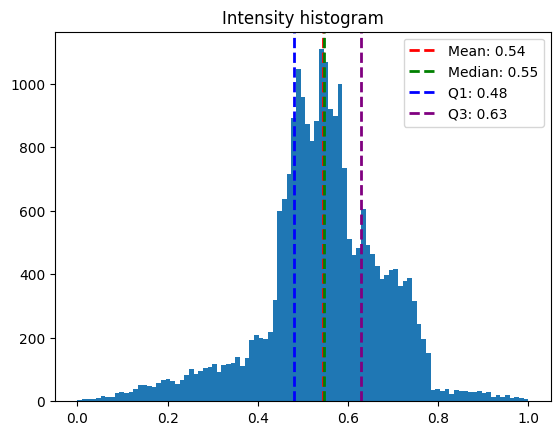

Inclusion Areas:  [103. 114.]


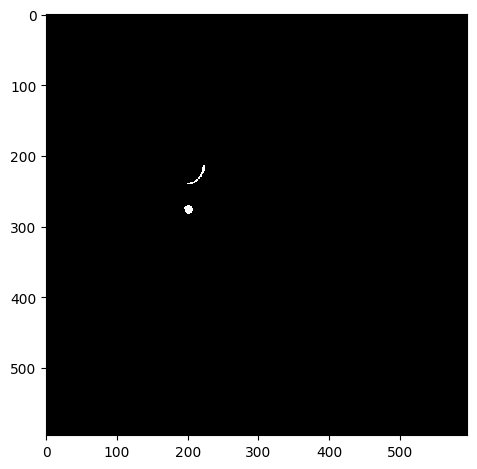

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_05.czi
Red Channel


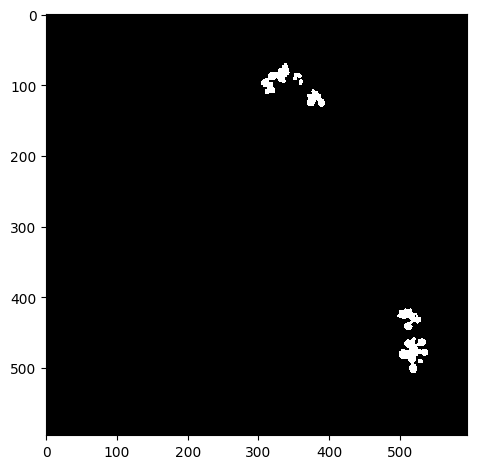

Green Channel


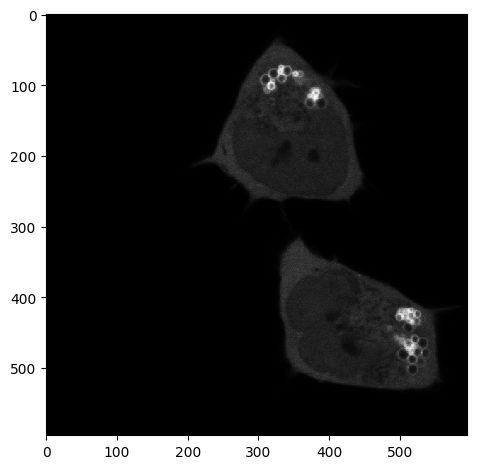

Segmented Cells


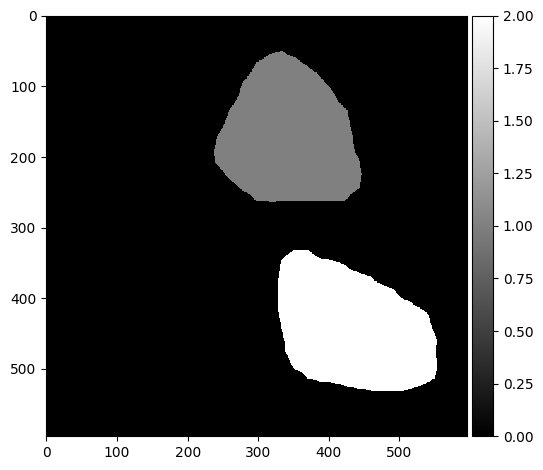

Threshold:  0.5
Bin count 337


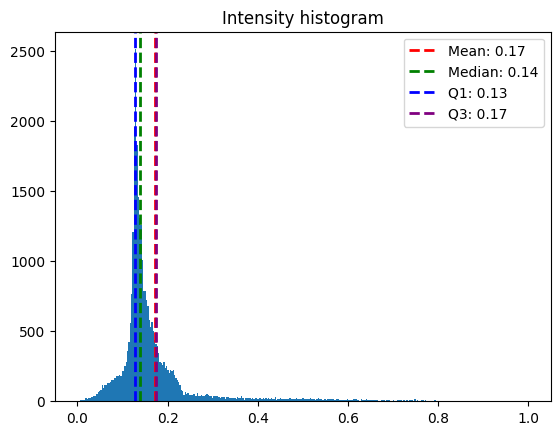

Inclusion Areas:  [150.  65. 161. 232.]


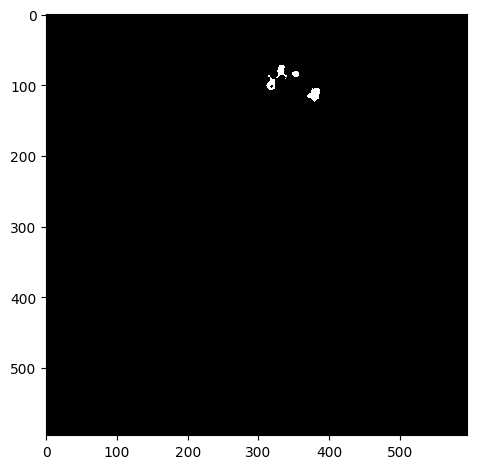

Threshold:  0.5
Bin count 299


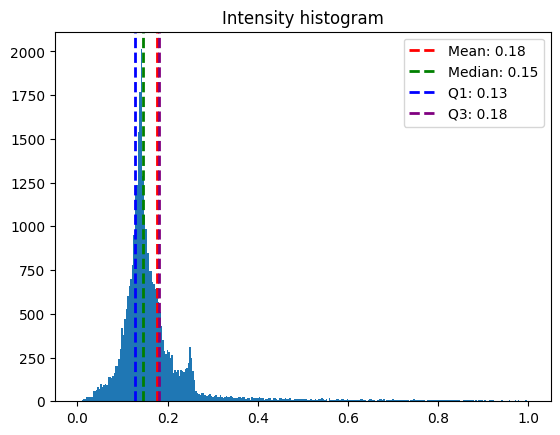

Inclusion Areas:  [410. 248.]


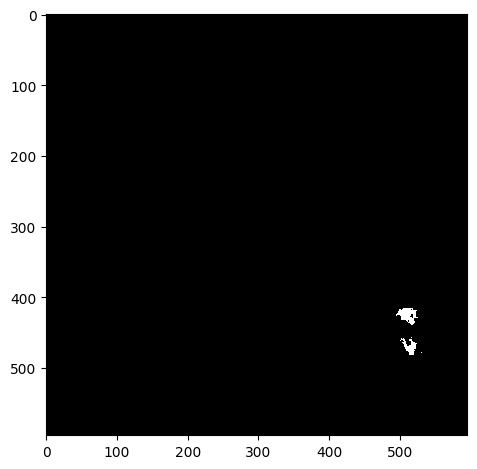

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_06.czi
Red Channel


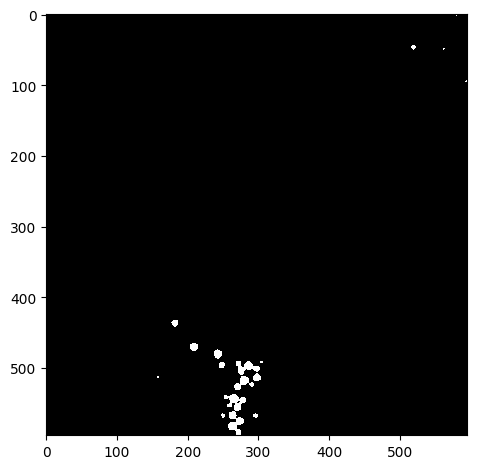

Green Channel


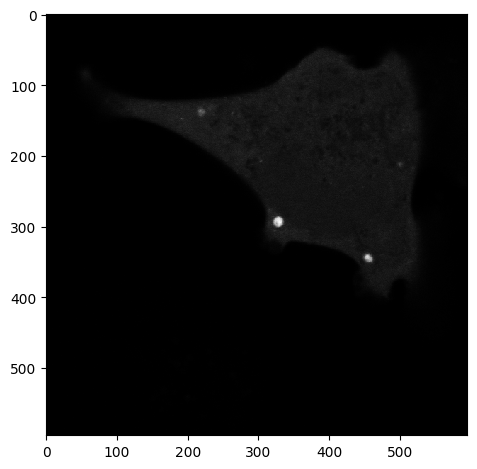

Segmented Cells


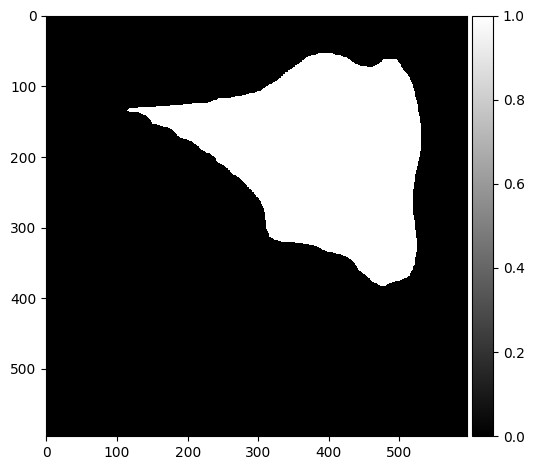

Threshold:  0.5
Bin count 868


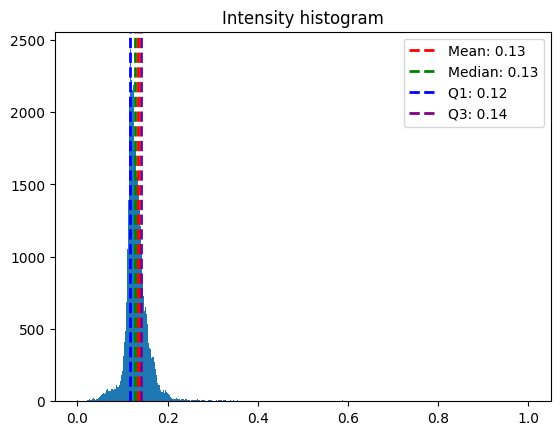

Inclusion Areas:  [143.  68.]


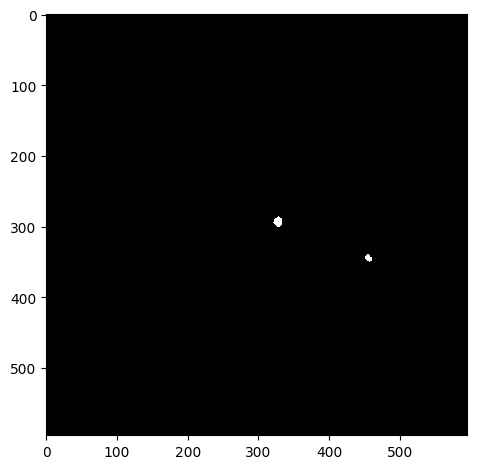

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_07.czi
Red Channel


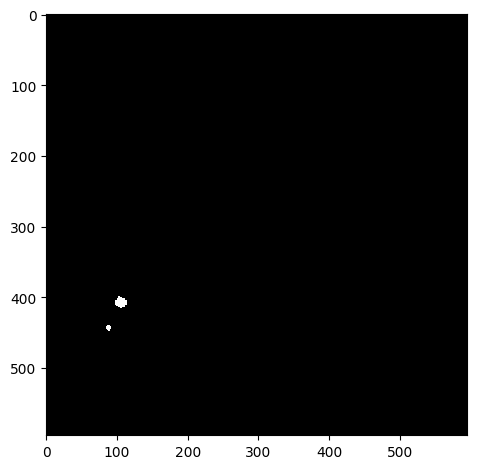

Green Channel


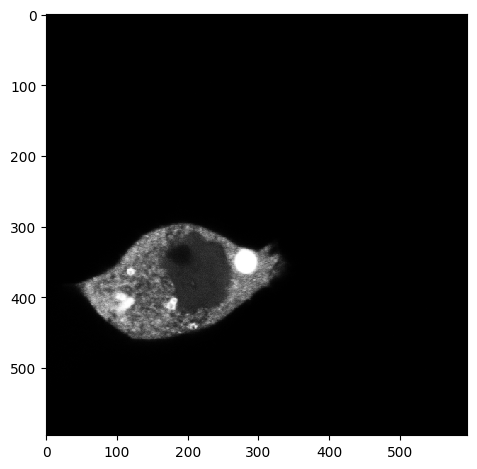

Segmented Cells


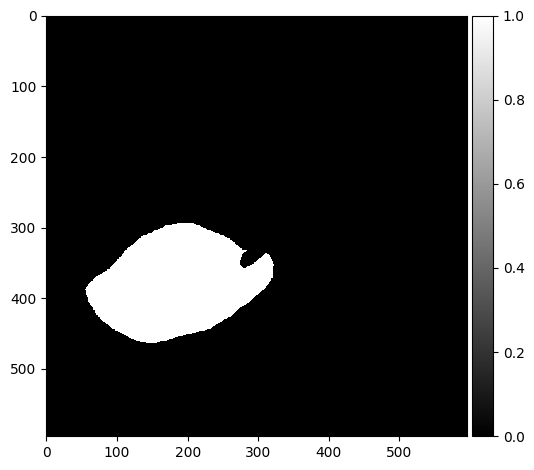

Threshold:  0.99
Bin count 59


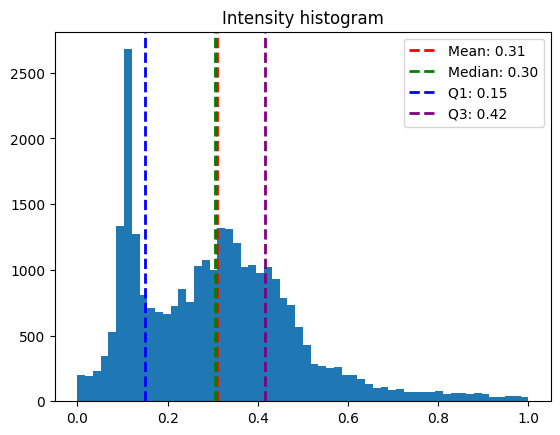

Inclusion Areas:  [365.  17.  55.]


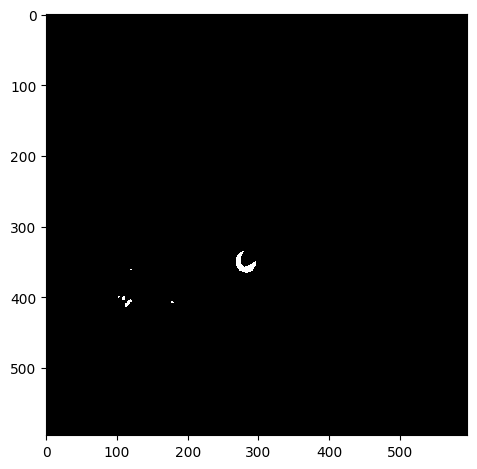

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_01.czi
Red Channel


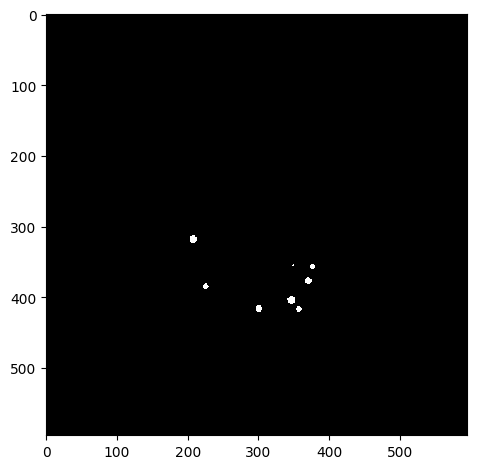

Green Channel


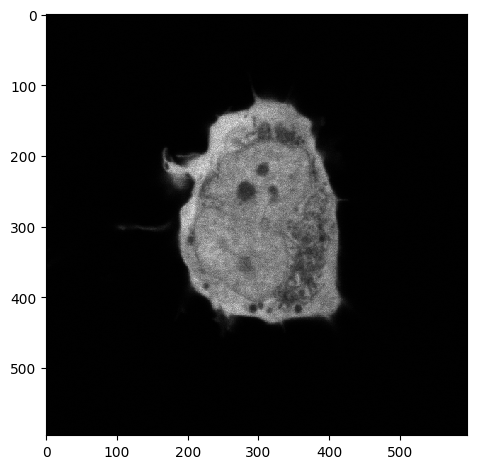

Segmented Cells


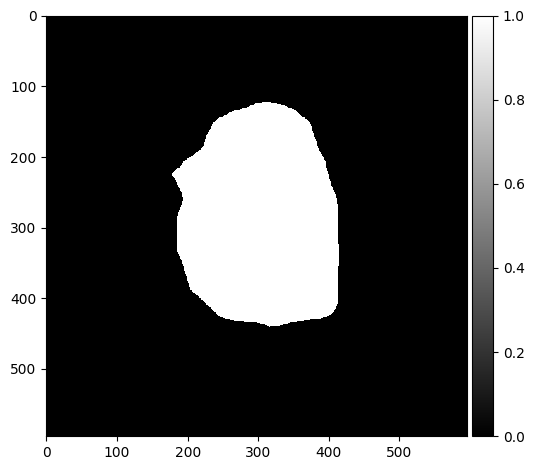

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_02.czi
Red Channel


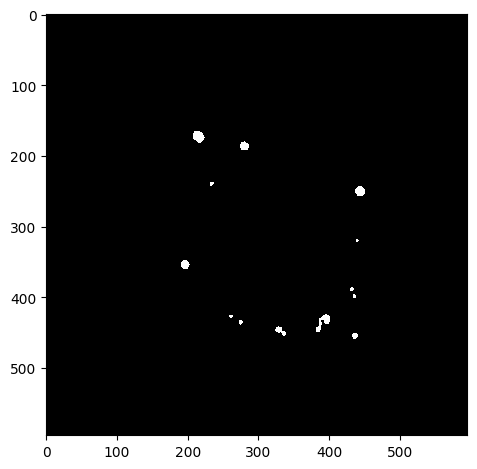

Green Channel


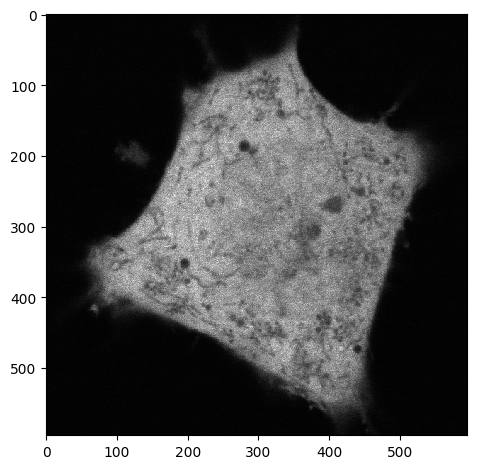

Segmented Cells


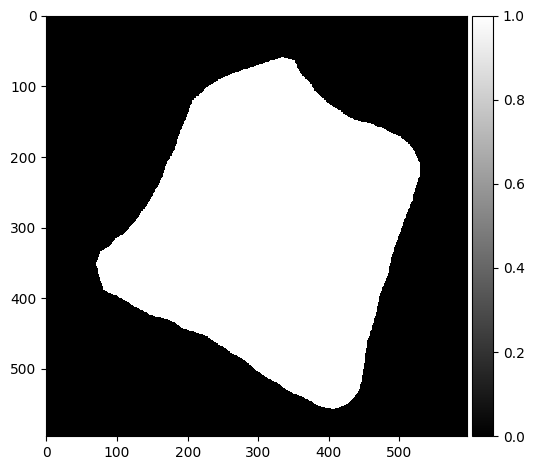

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_03.czi
Red Channel


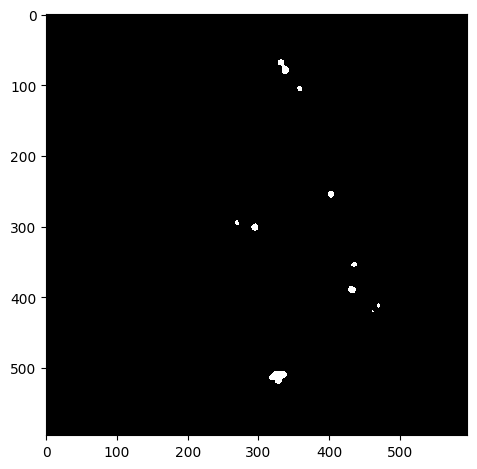

Green Channel


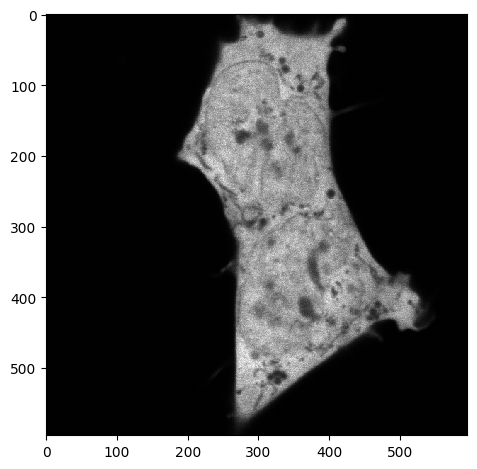

Segmented Cells


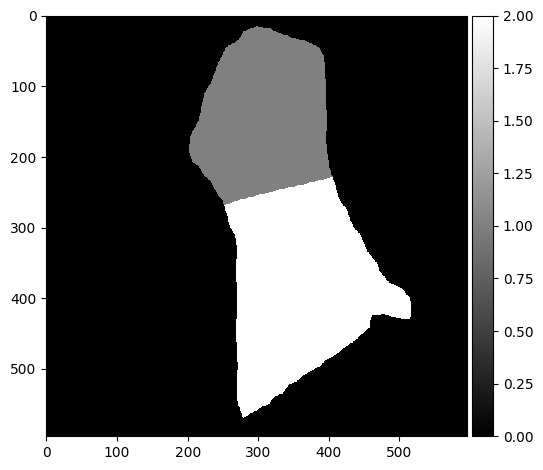

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_04.czi
Red Channel


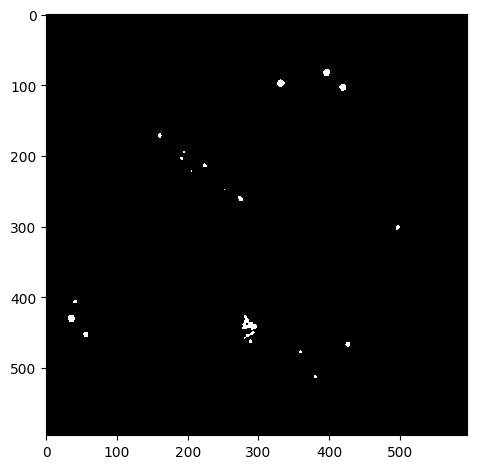

Green Channel


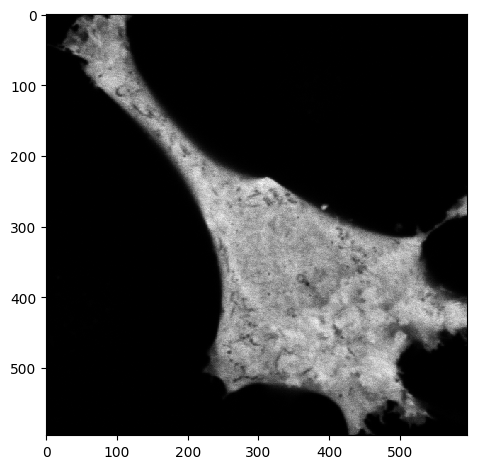

Segmented Cells


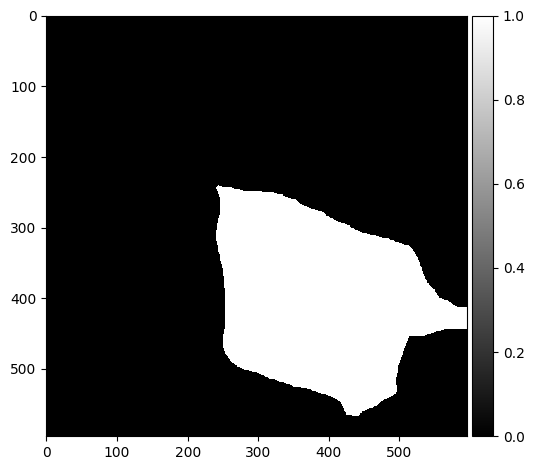

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_05.czi
Red Channel


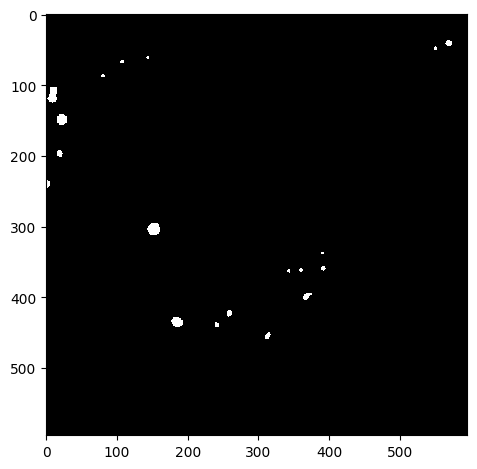

Green Channel


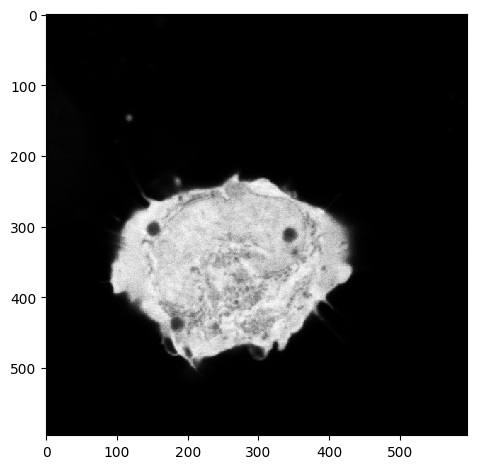

Segmented Cells


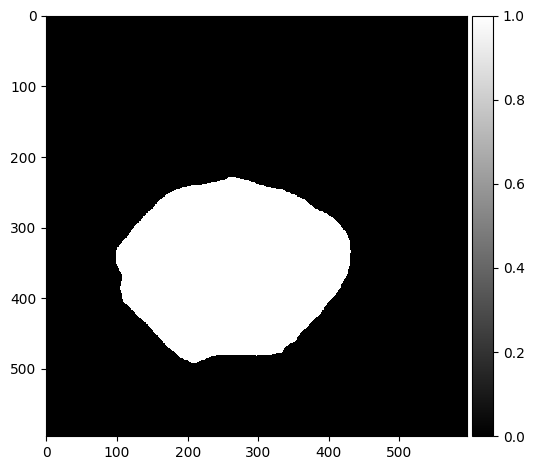

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_06.czi
Red Channel


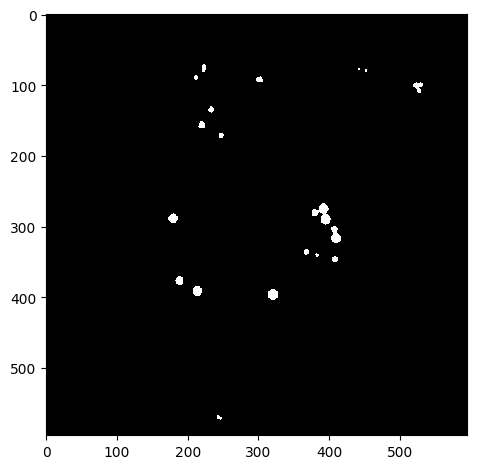

Green Channel


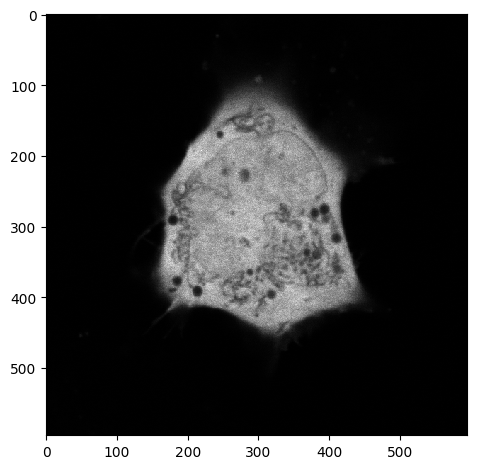

Segmented Cells


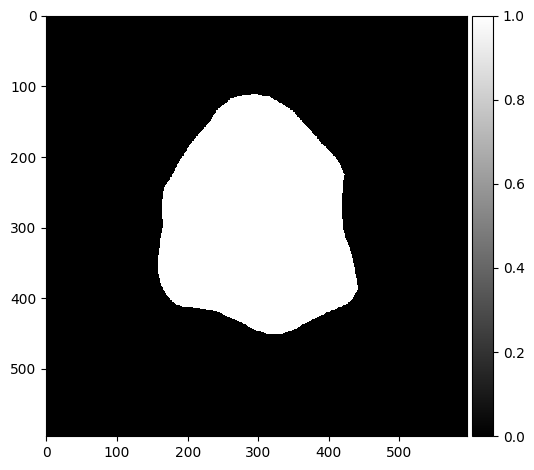

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_01.czi
Red Channel


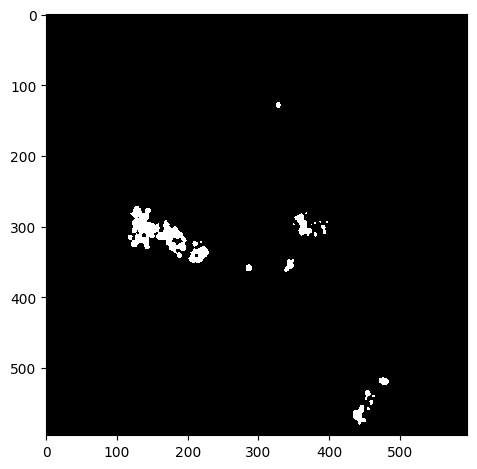

Green Channel


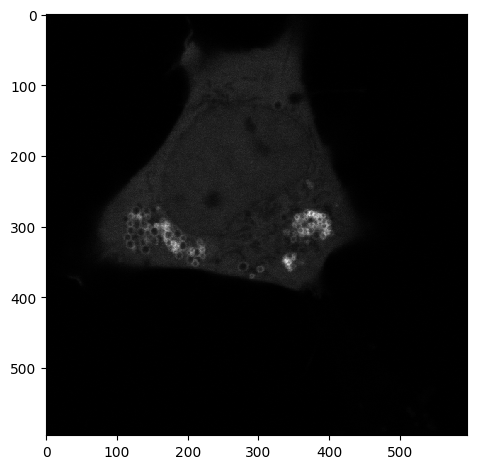

Segmented Cells


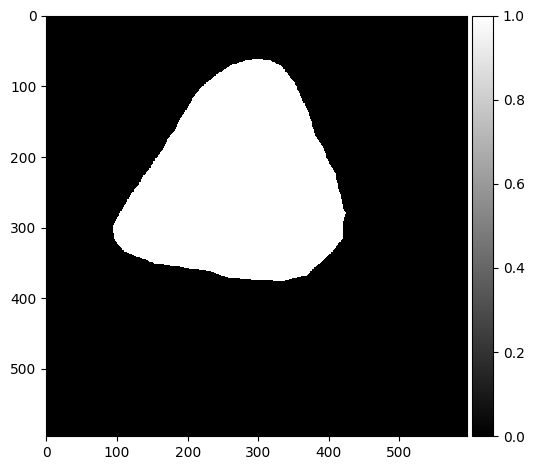

Threshold:  0.5
Bin count 455


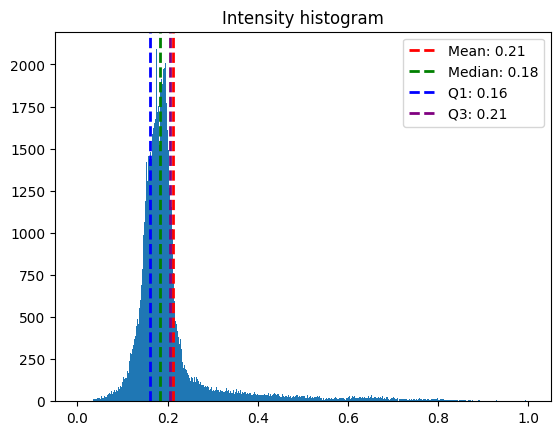

Inclusion Areas:  [186.  16.  58.  72.  15.  16.  21.  95.  91.]


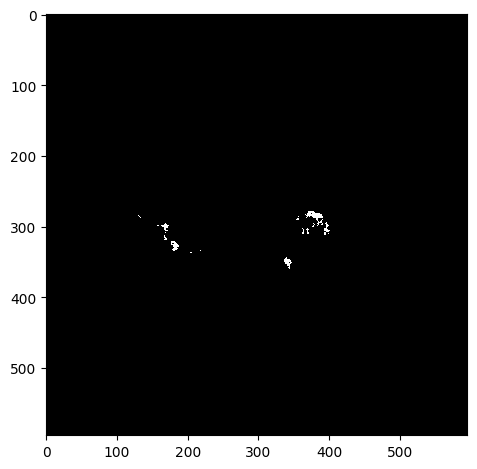

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_02.czi
Red Channel


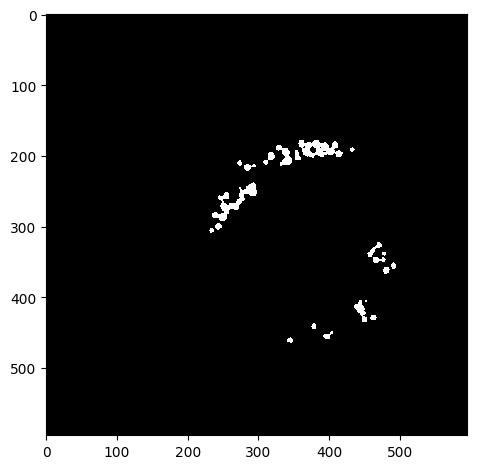

Green Channel


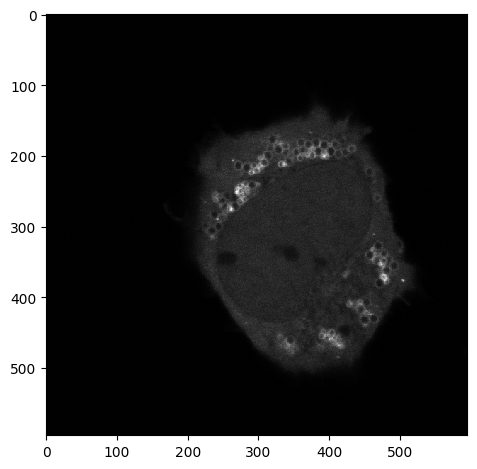

Segmented Cells


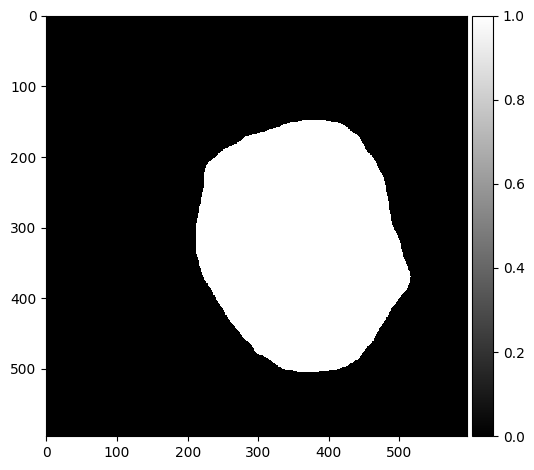

Threshold:  0.5
Bin count 377


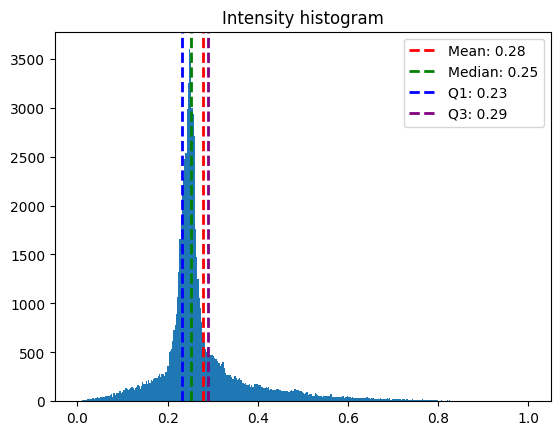

Inclusion Areas:  [ 14.  14.  50.  29.  64.  17. 110.  29.  37.  33.  85.  11.  31.  21.]


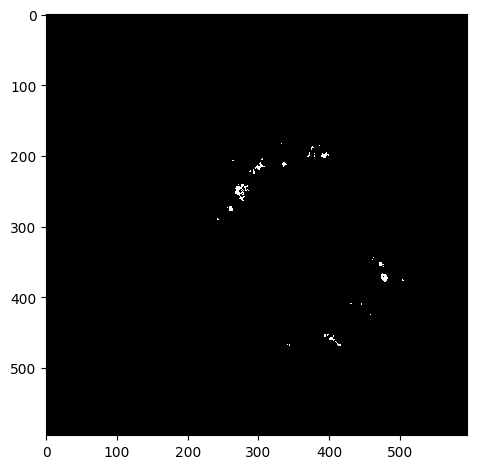

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_03.czi
Red Channel


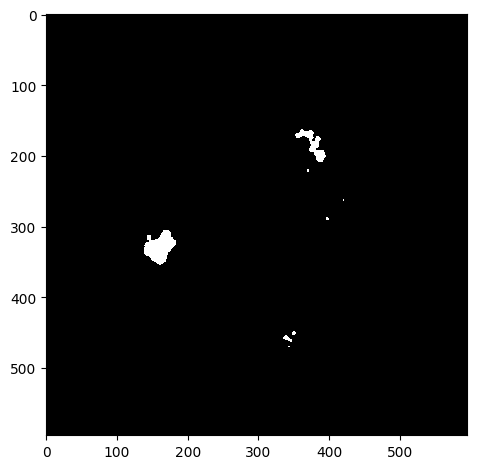

Green Channel


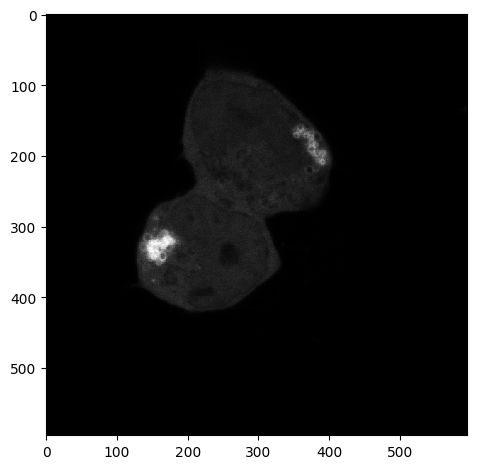

Segmented Cells


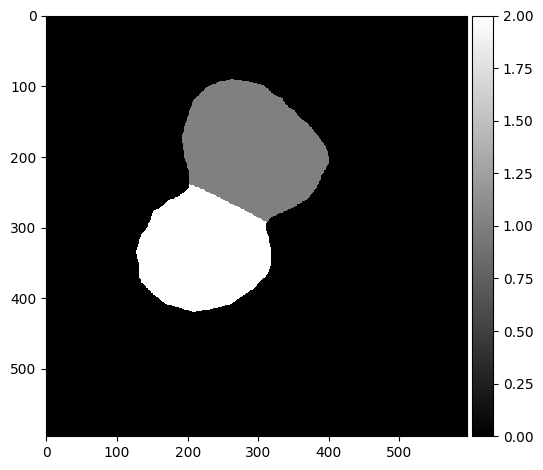

Threshold:  0.5
Bin count 286


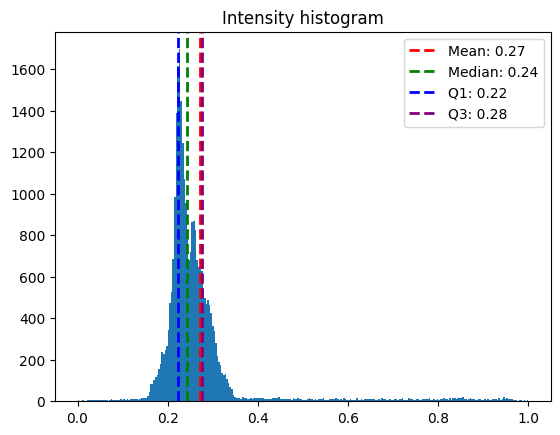

Inclusion Areas:  [27. 14. 29.]


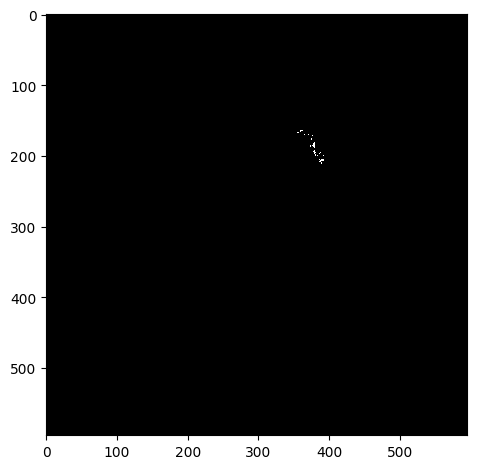

Threshold:  0.5
Bin count 574


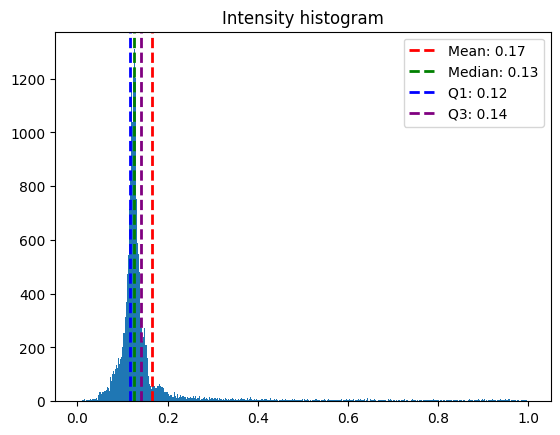

Inclusion Areas:  [963.]


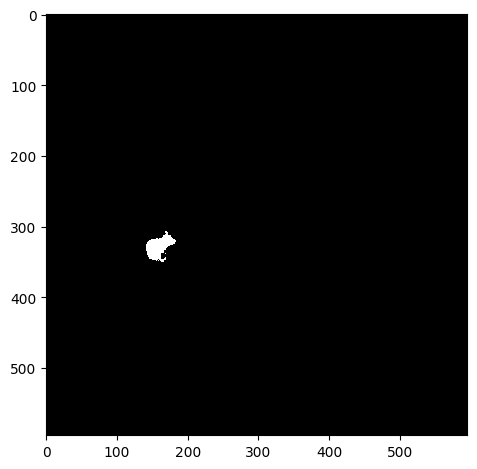

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_04.czi
Red Channel


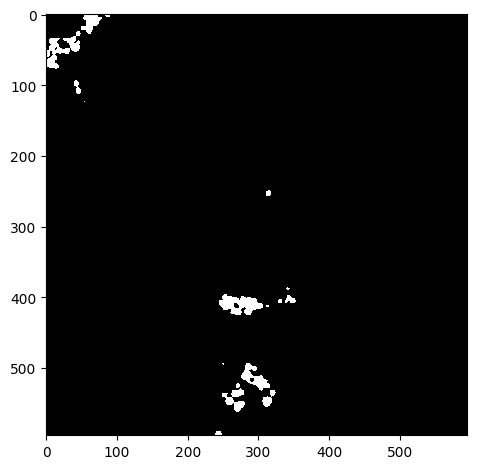

Green Channel


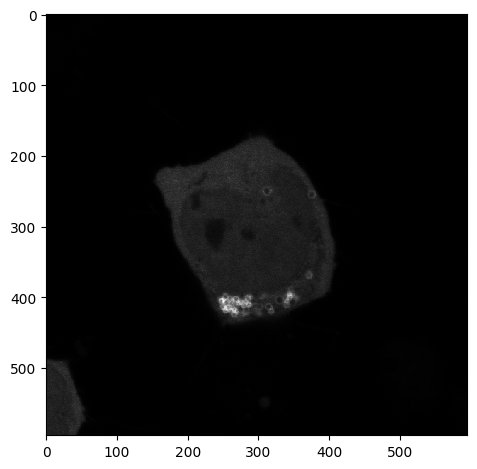

Segmented Cells


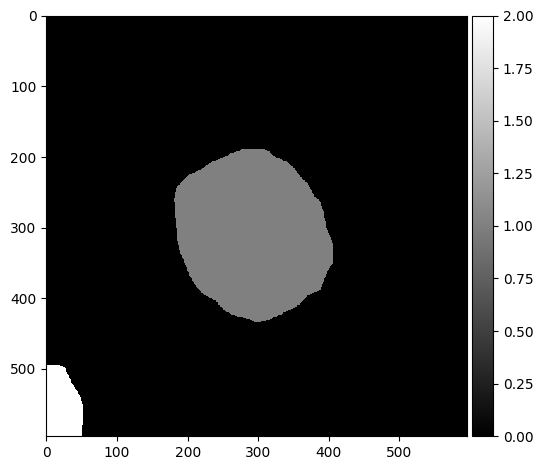

Threshold:  0.5
Bin count 352


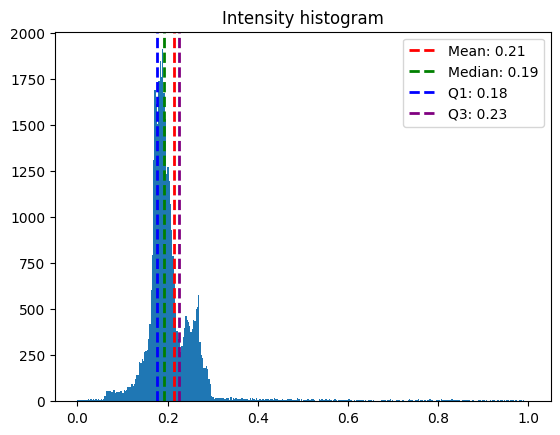

Inclusion Areas:  [ 52. 424.]


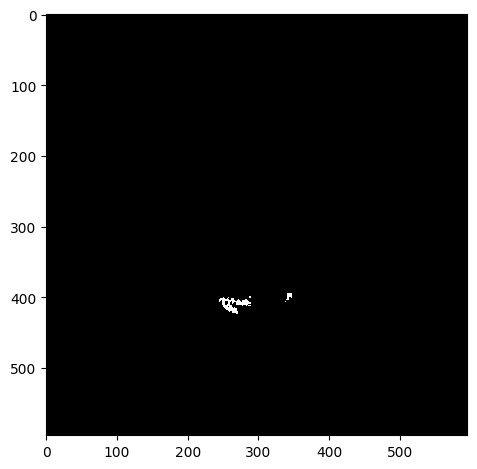

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_05.czi
Red Channel


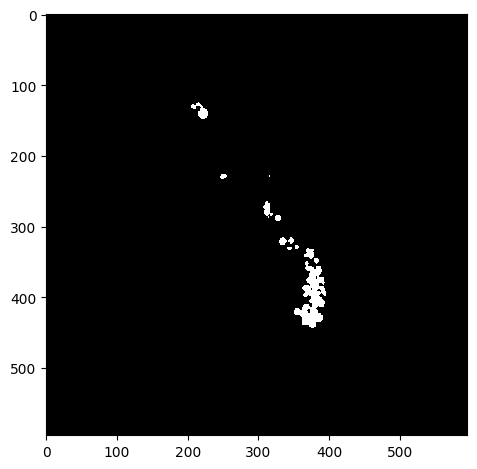

Green Channel


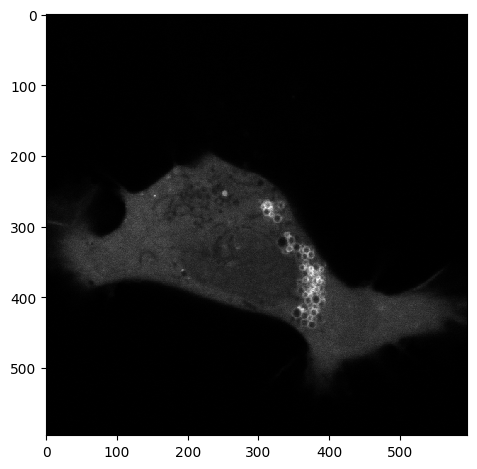

Segmented Cells


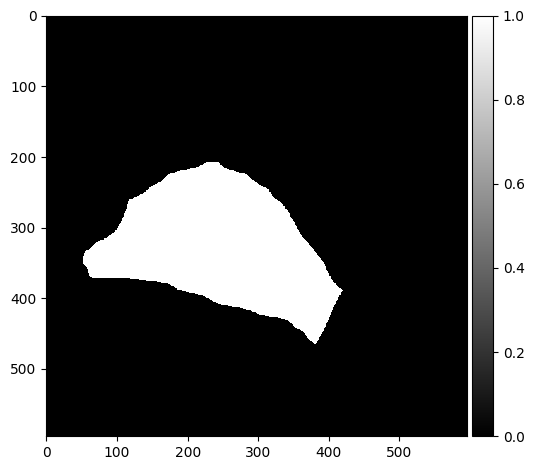

Threshold:  0.5
Bin count 153


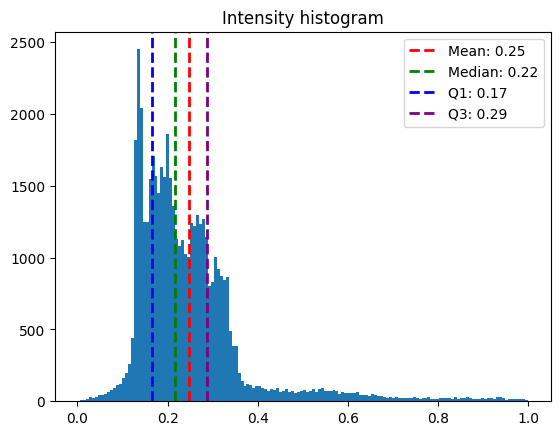

Inclusion Areas:  [ 20. 200.  17.  11.  45. 621.  27.  24.  15.  53.  50.  26.]


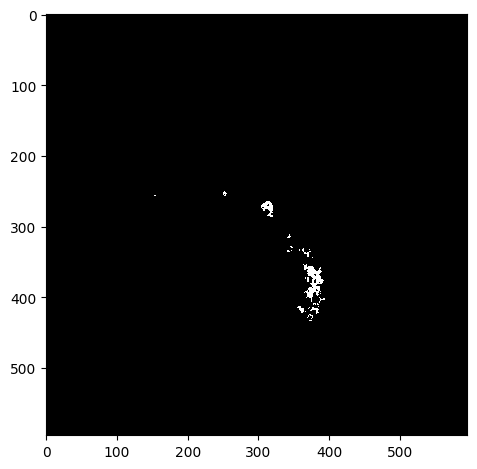

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_06.czi
Red Channel


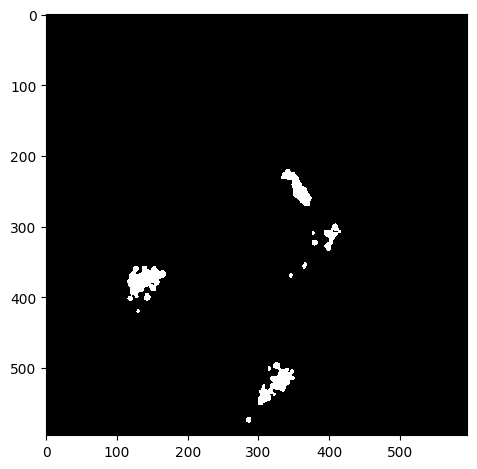

Green Channel


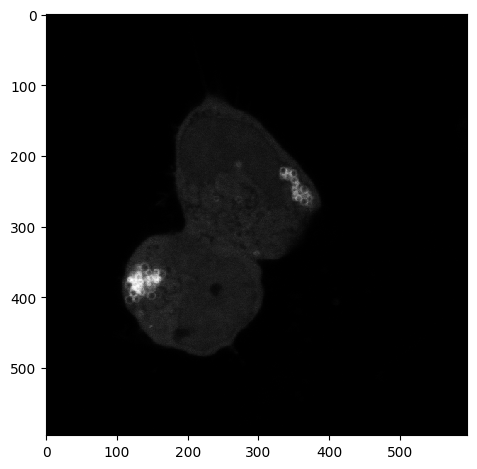

Segmented Cells


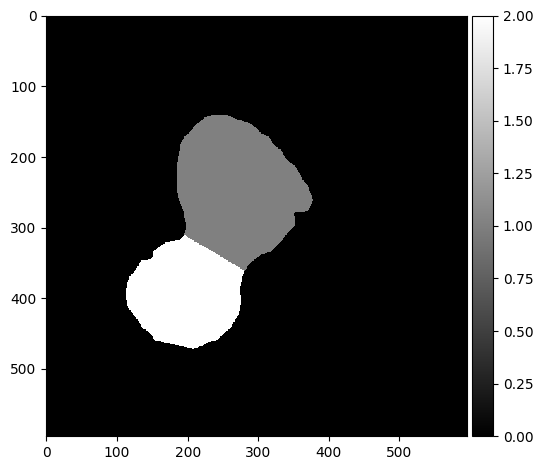

Threshold:  0.5
Bin count 225


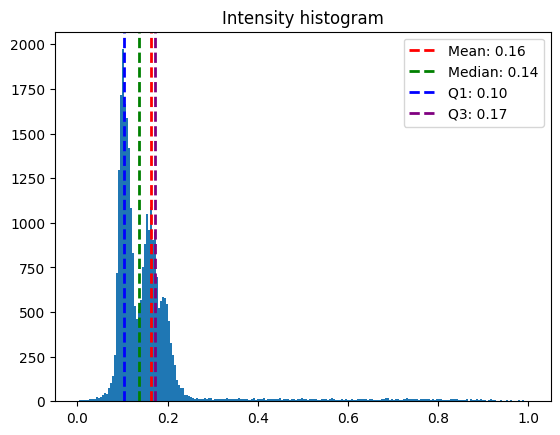

Inclusion Areas:  [47. 11. 21. 22.]


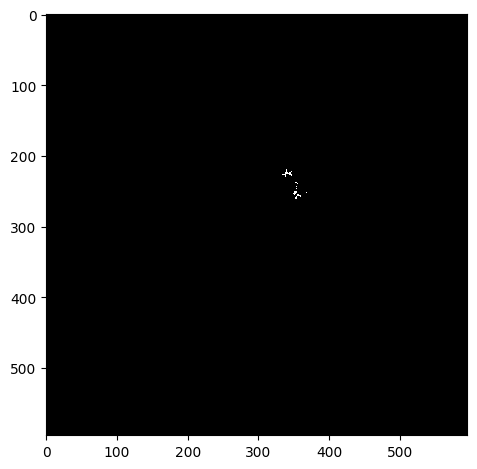

Threshold:  0.5
Bin count 393


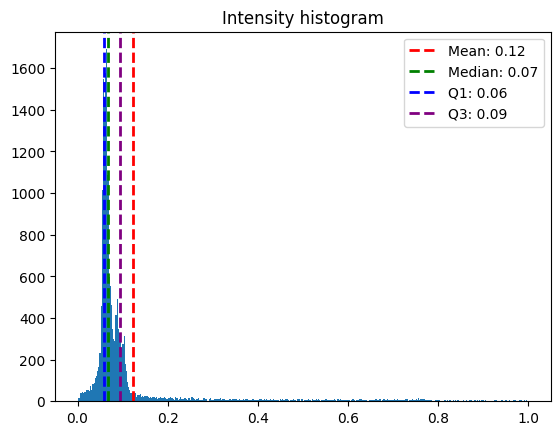

Inclusion Areas:  [875.]


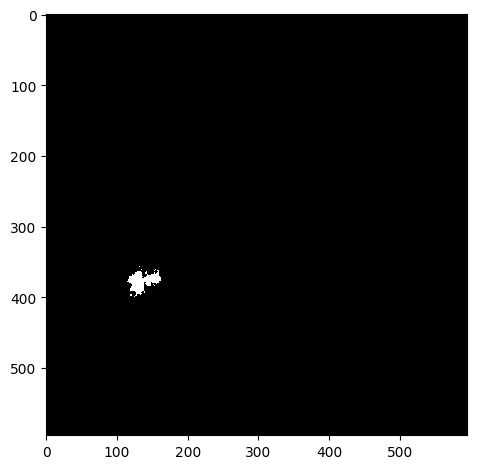

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_01.czi
Red Channel


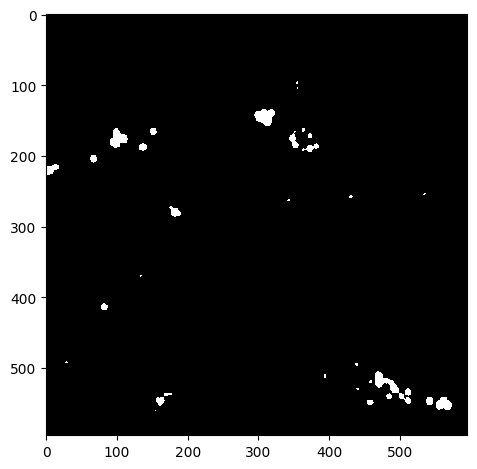

Green Channel


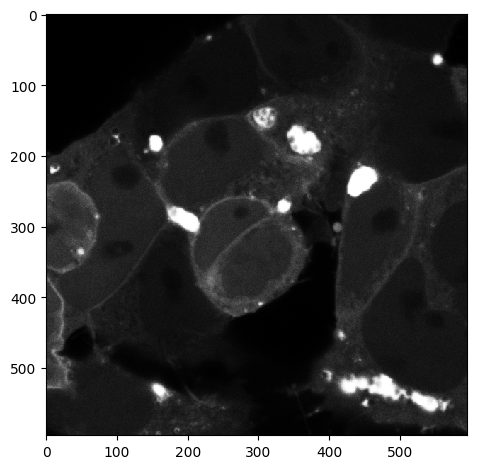

Segmented Cells


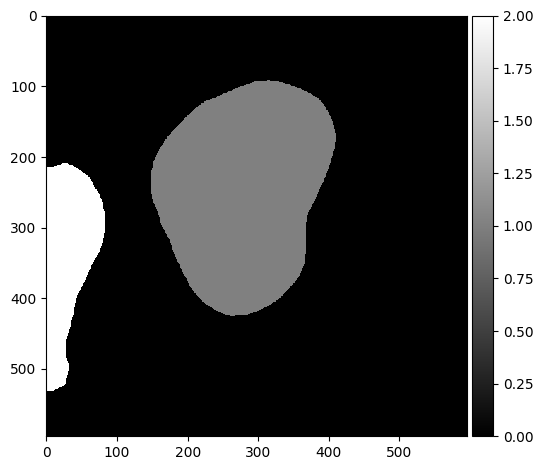

Threshold:  0.5
Bin count 237


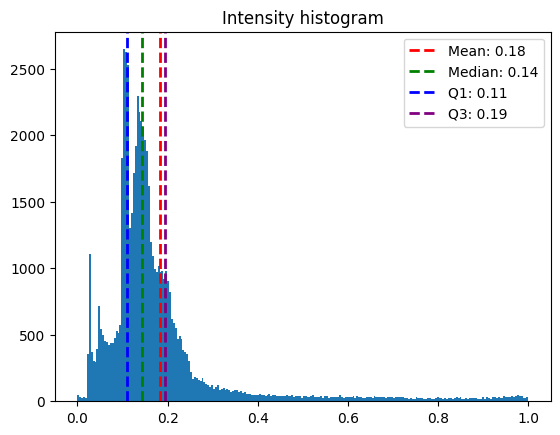

Inclusion Areas:  [ 589. 1381.   32.   19.   13.  319. 1083.   28.]


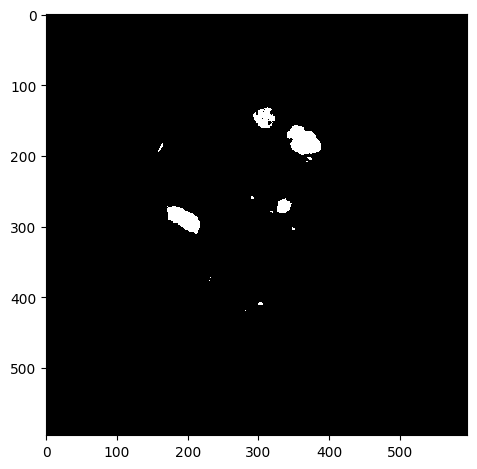

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_02.czi
Red Channel


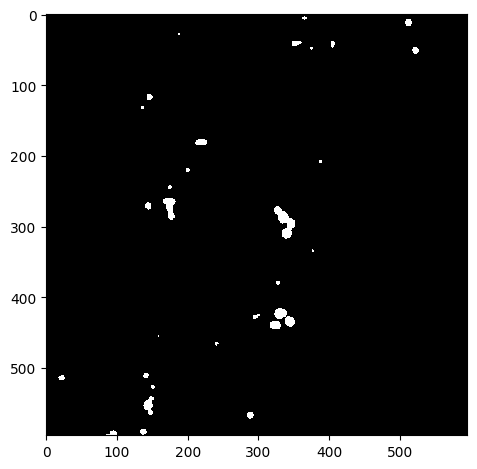

Green Channel


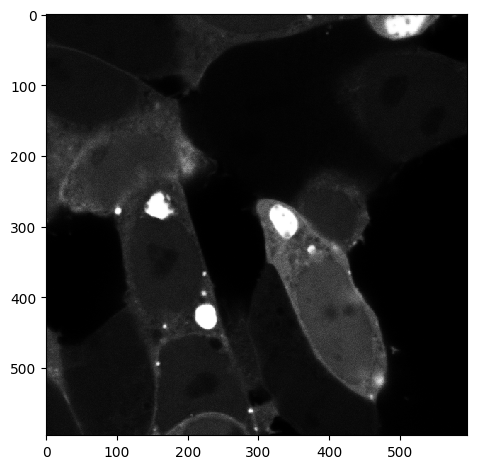

Segmented Cells


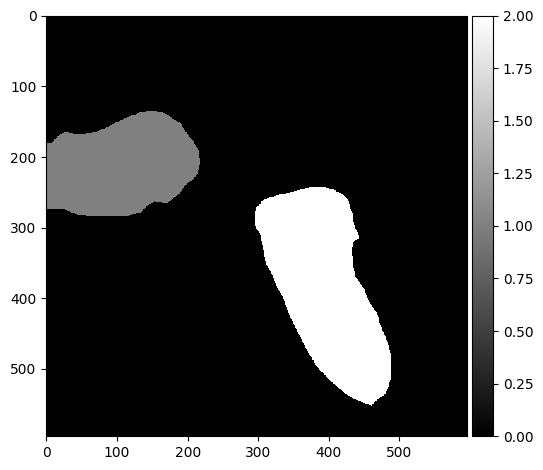

Threshold:  0.5
Bin count 215


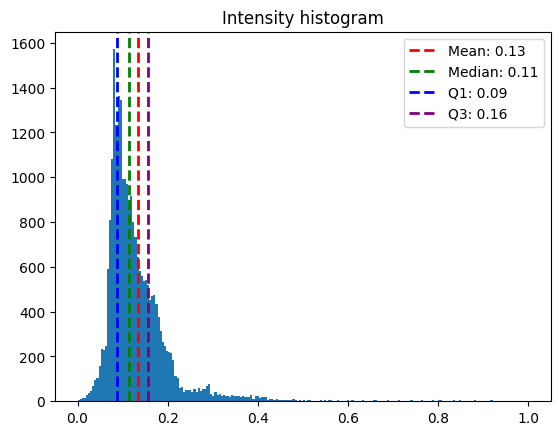

Inclusion Areas:  [ 14.  65. 224.  19.  89.]


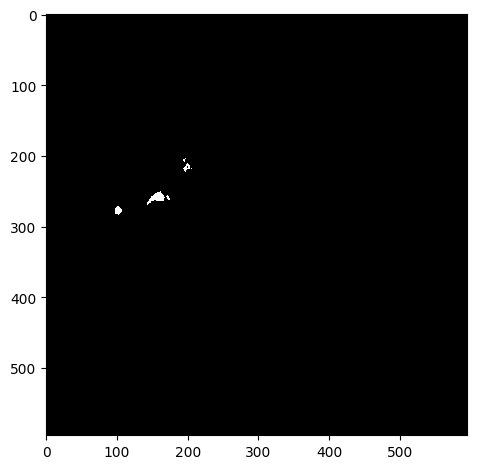

Threshold:  0.5
Bin count 159


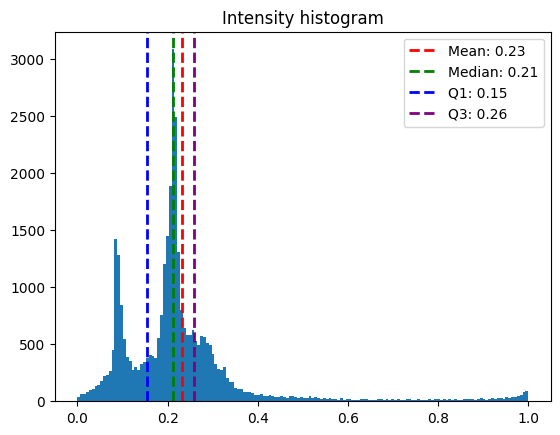

Inclusion Areas:  [1460.  131.   46.   13.  173.   25.]


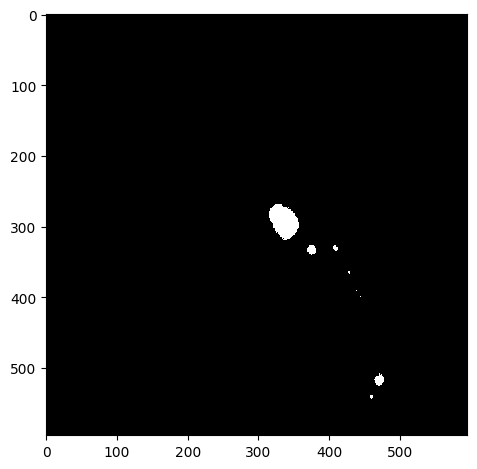

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_03.czi
Red Channel


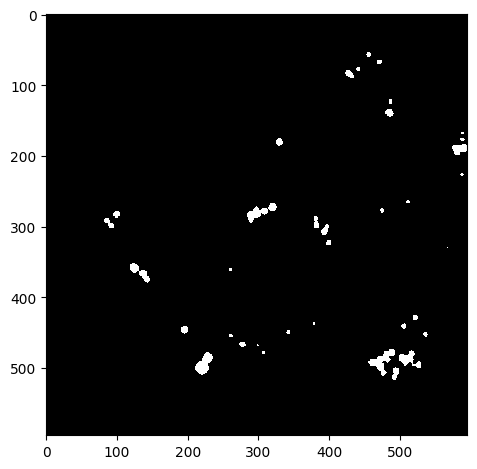

Green Channel


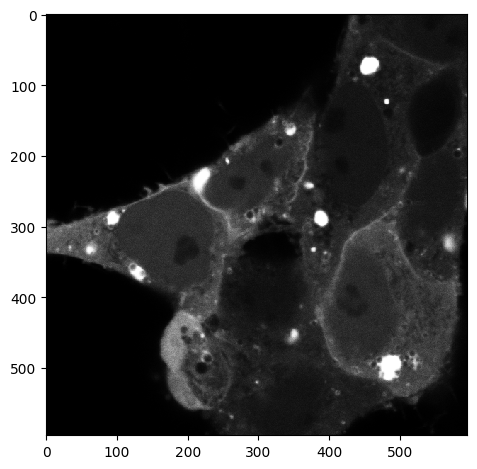

Segmented Cells


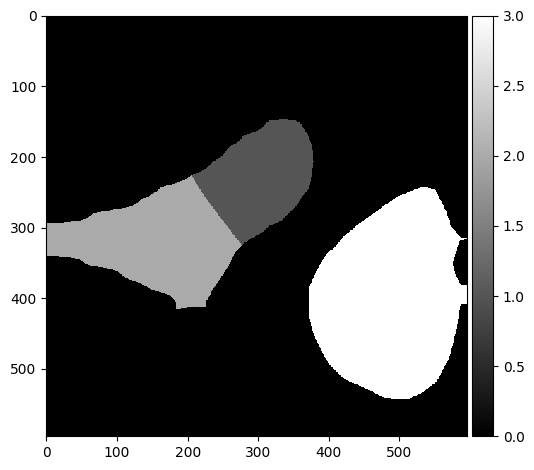

Threshold:  0.5
Bin count 129


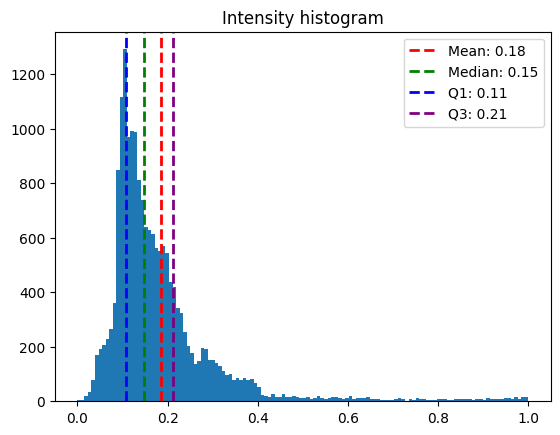

Inclusion Areas:  [163.  35. 467.  58.  16.  13.  50.  24.]


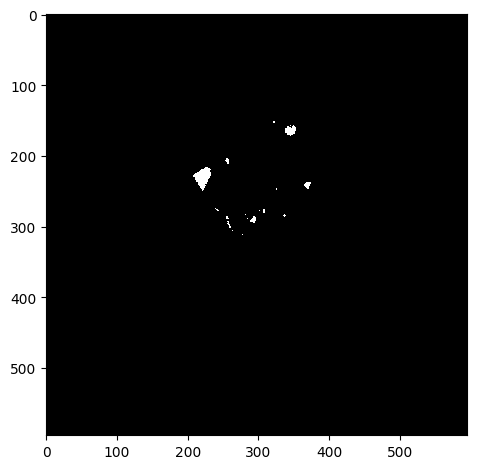

Threshold:  0.5
Bin count 116


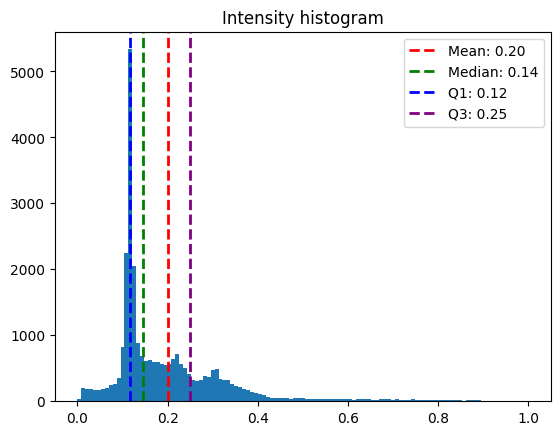

Inclusion Areas:  [345.  22.  16. 325.  12.  15. 234.  33.  13. 374.]


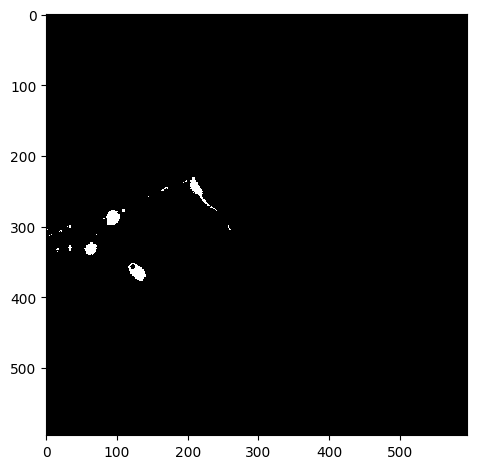

Threshold:  0.5
Bin count 213


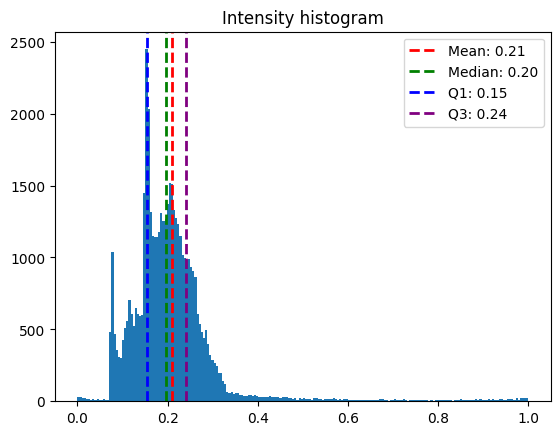

Inclusion Areas:  [ 216. 1009.   99.]


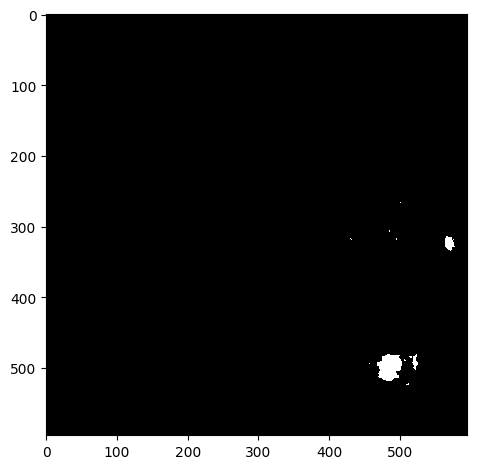

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_04.czi
Red Channel


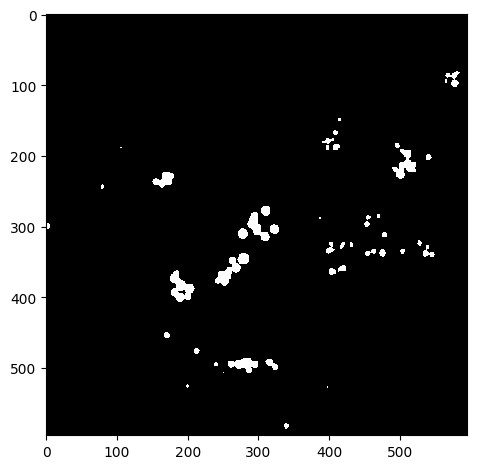

Green Channel


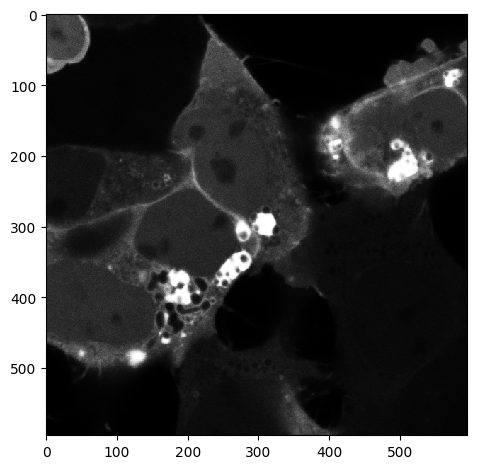

Segmented Cells


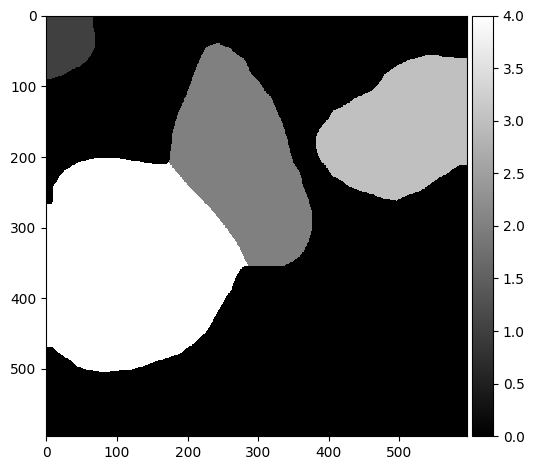

Threshold:  0.5
Bin count 255


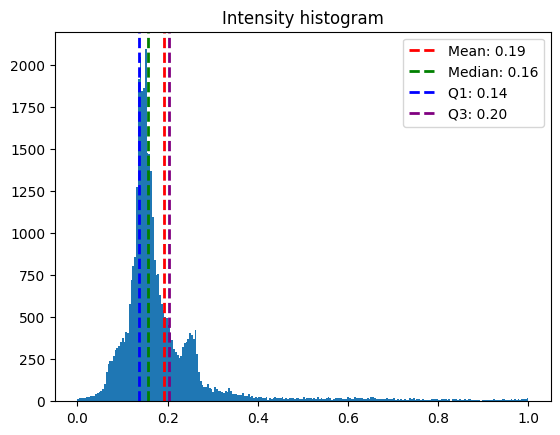

Inclusion Areas:  [  85. 1415.   11.  141.]


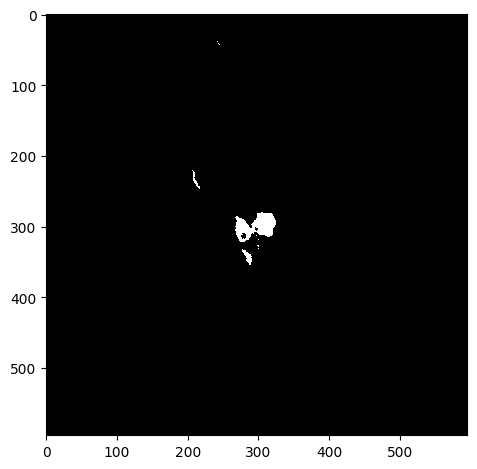

Threshold:  0.5
Bin count 86


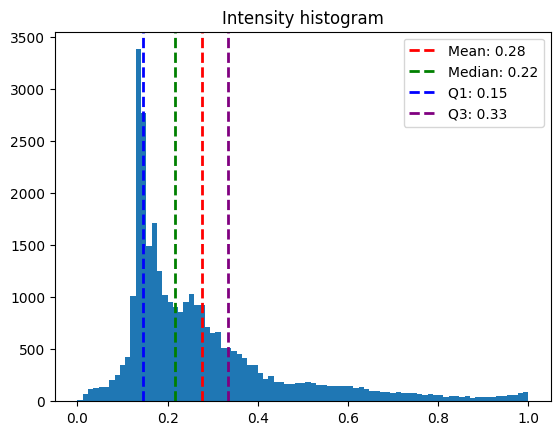

Inclusion Areas:  [ 491.   63.   39.   14.   32. 1401. 2085.   34.]


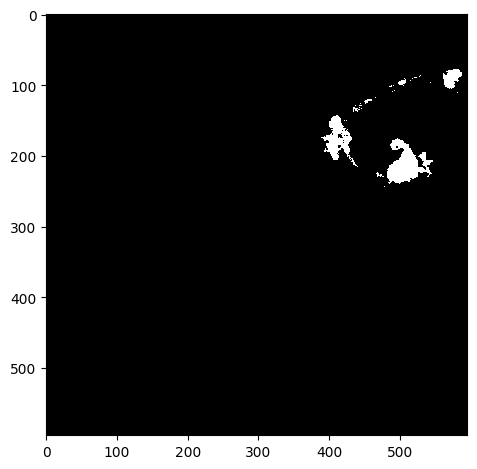

Threshold:  0.5
Bin count 244


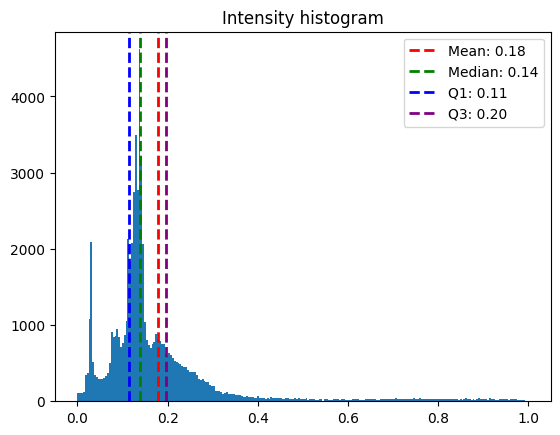

Inclusion Areas:  [1049.   11. 1474.   12.   38.   74.   18.   21.   49.   95.   84.  477.]


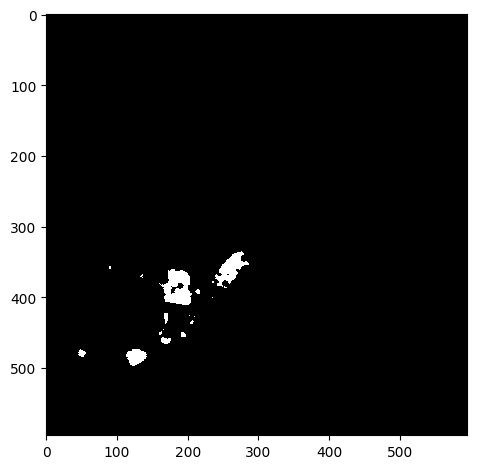

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_05.czi
Red Channel


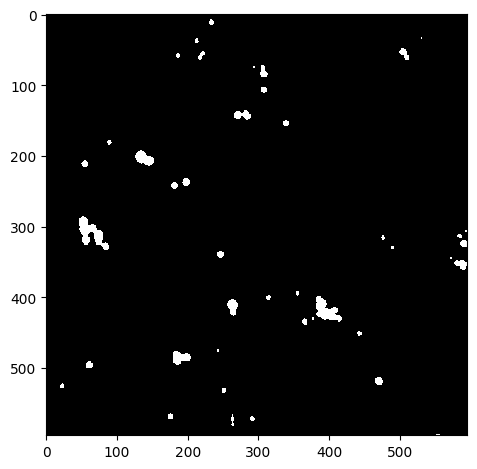

Green Channel


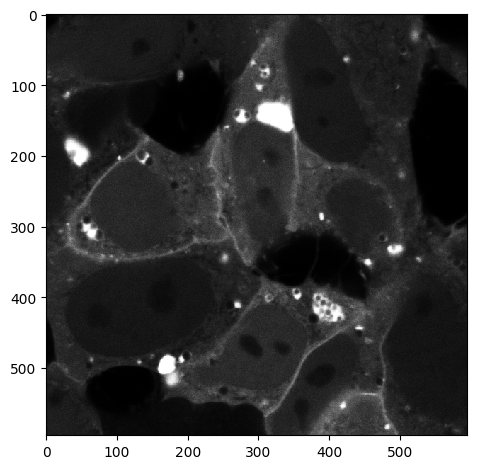

Segmented Cells


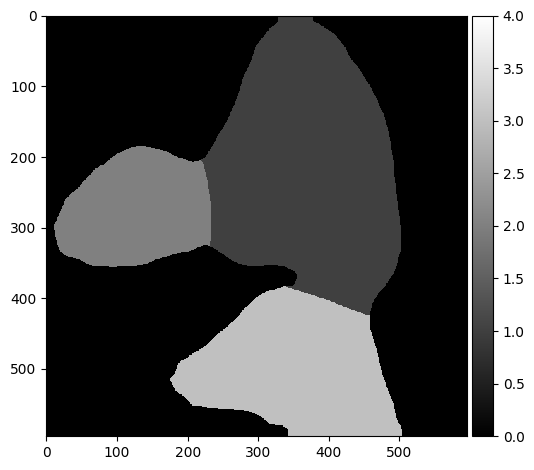

Threshold:  0.5
Bin count 165


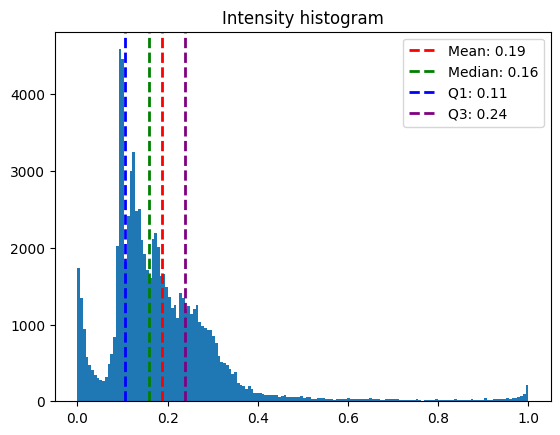

Inclusion Areas:  [  28.   45.  150.   90. 1877.  241.   22.   13.   17.   37.   17.   62.
  245.   81.   42.]


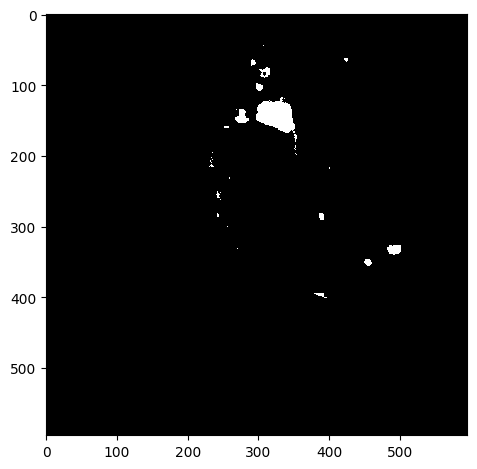

Threshold:  0.5
Bin count 148


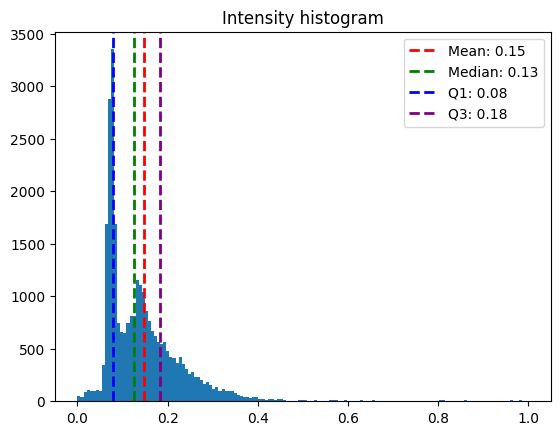

Inclusion Areas:  [ 90.  26. 341.  12.  14.  14.]


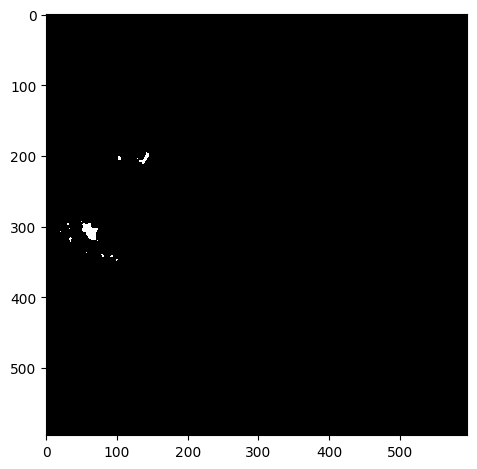

Threshold:  0.5
Bin count 163


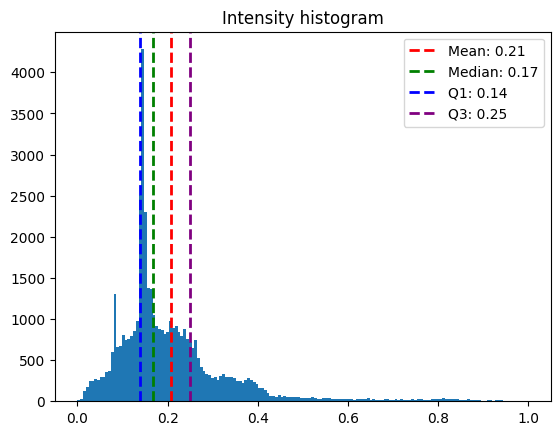

Inclusion Areas:  [  91. 1037.   33.   62.   33.  158.   47.   94.   13.   56.]


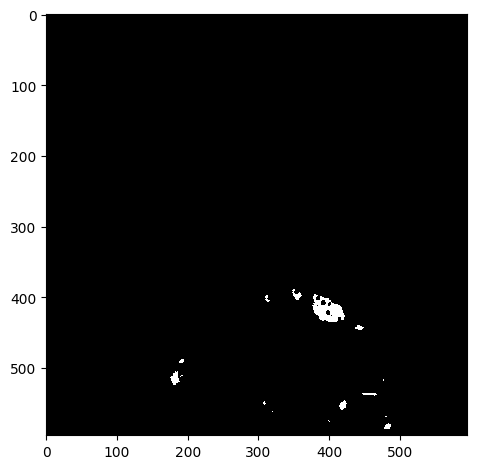

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_06.czi
Red Channel


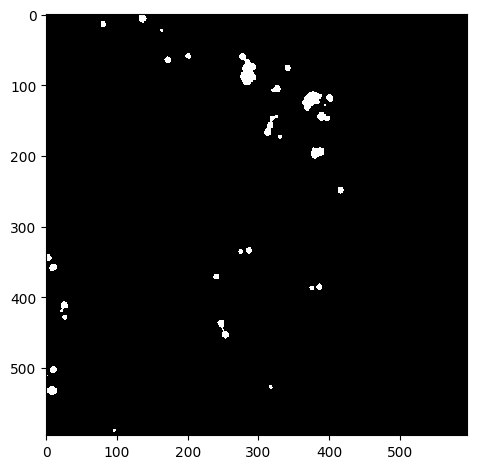

Green Channel


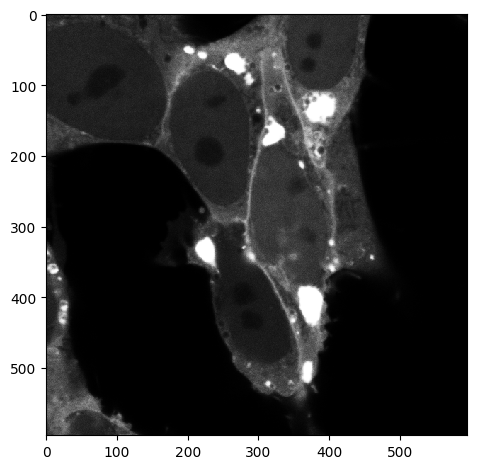

Segmented Cells


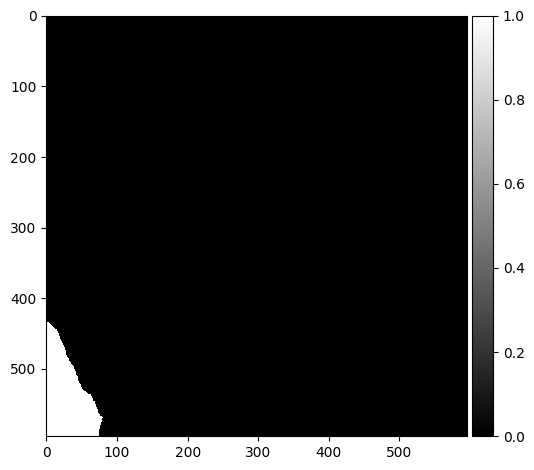

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_01.czi
Red Channel


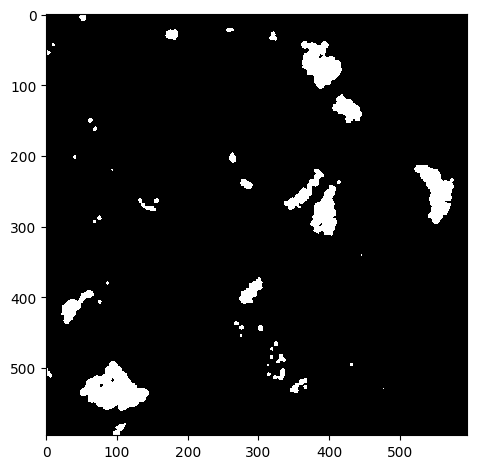

Green Channel


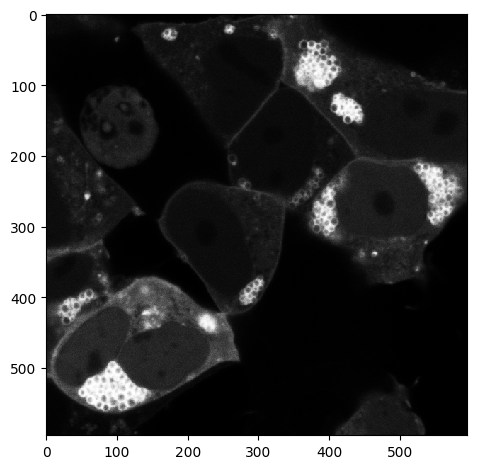

Segmented Cells


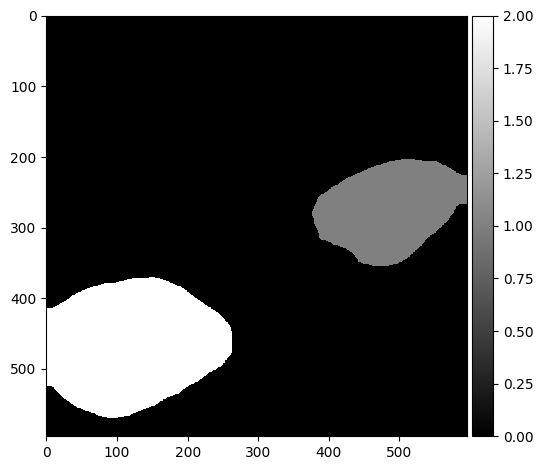

Threshold:  0.5
Bin count 61


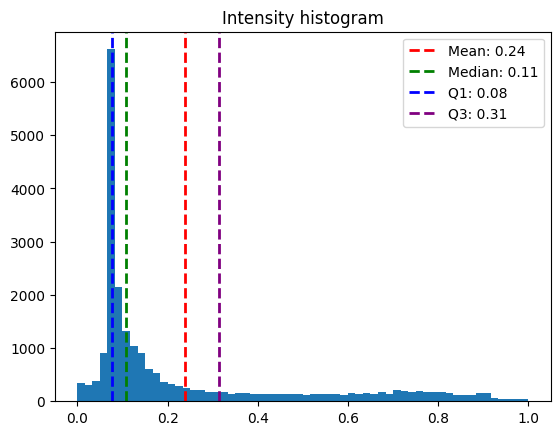

Inclusion Areas:  [2532. 1309.   29.]


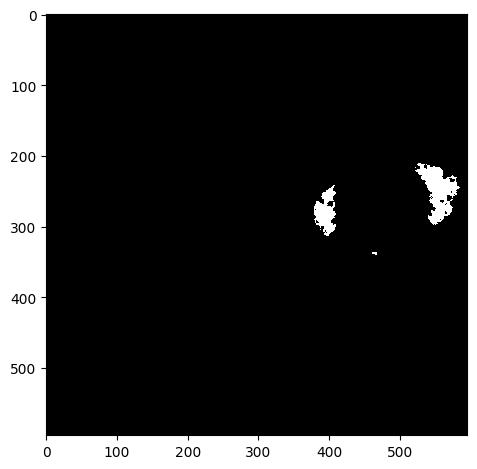

Threshold:  0.5
Bin count 90


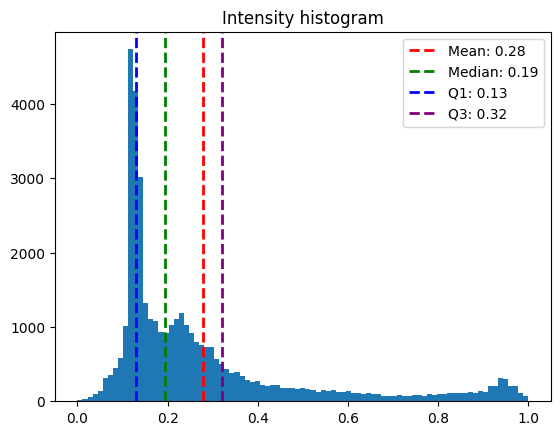

Inclusion Areas:  [  74.  782.   35.  204.  587.   11.  101.   12. 4042.]


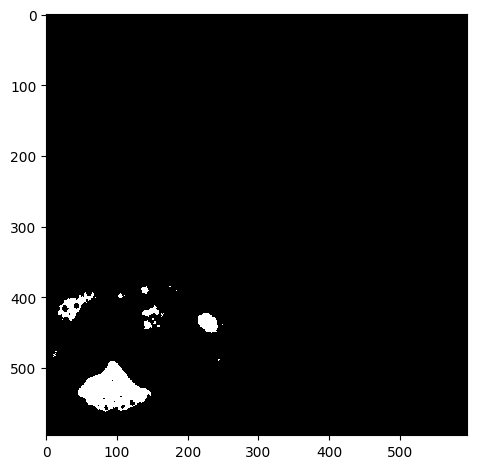

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_02.czi
Red Channel


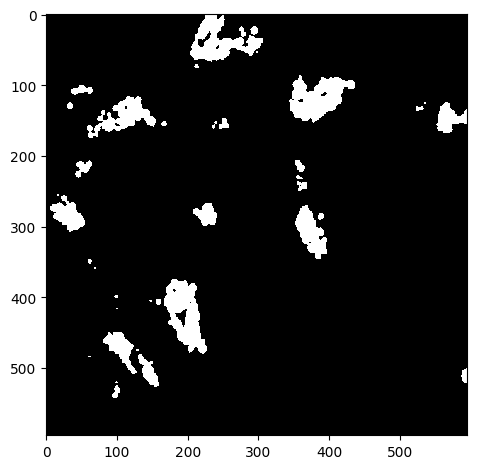

Green Channel


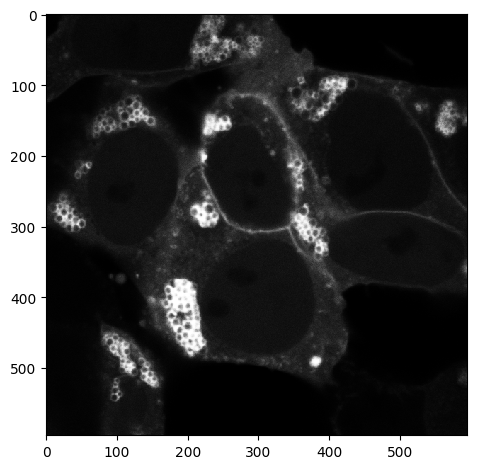

Segmented Cells


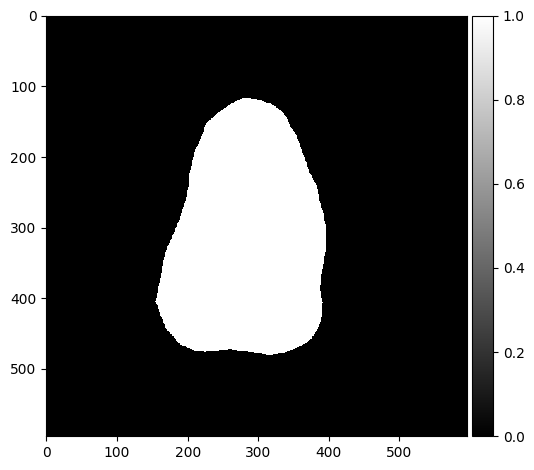

Threshold:  0.5
Bin count 120


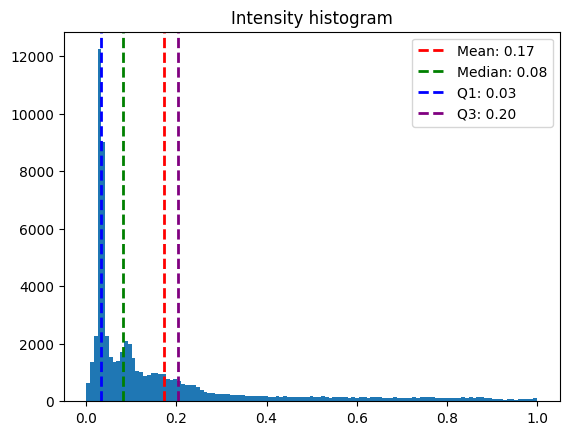

Inclusion Areas:  [  19.  691.  128.  487.   41.  876. 1270.   16.   12. 3601.]


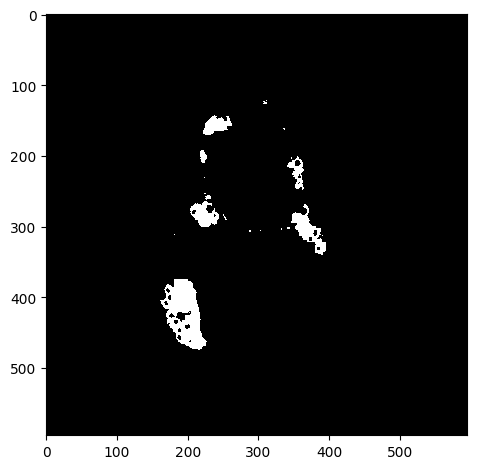

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_03.czi
Red Channel


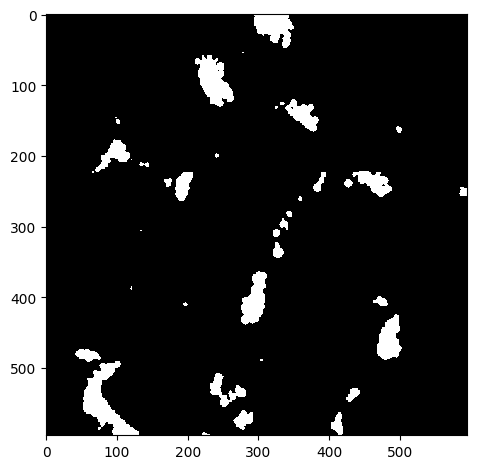

Green Channel


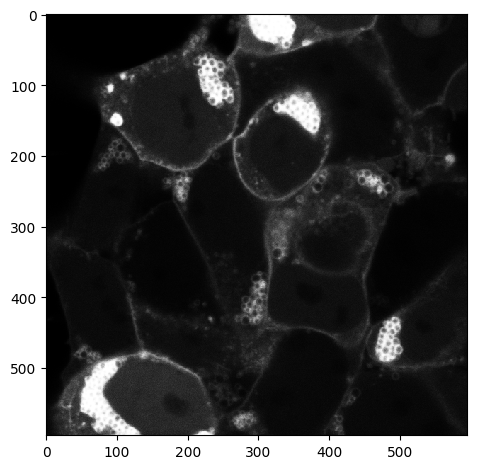

Segmented Cells


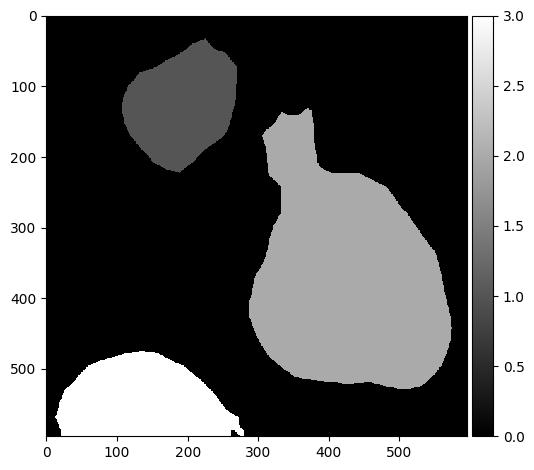

Threshold:  0.5
Bin count 123


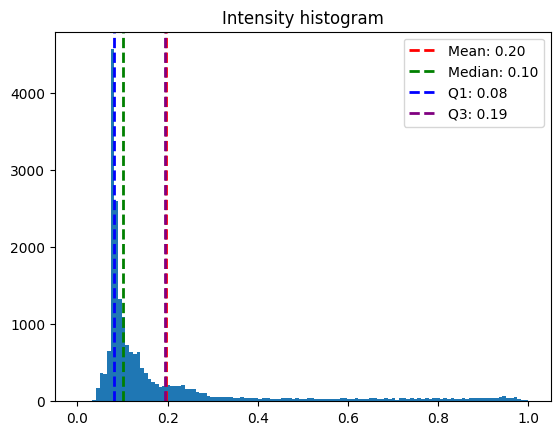

Inclusion Areas:  [2071.]


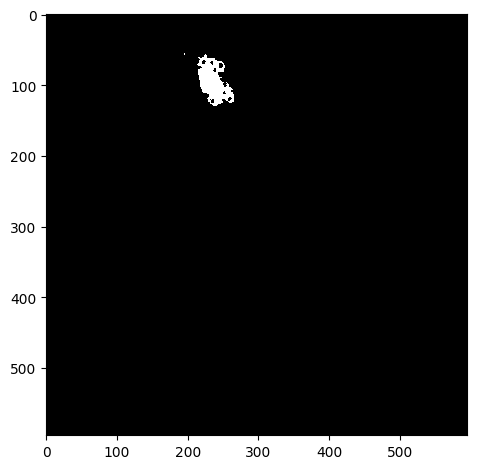

Threshold:  0.5
Bin count 251


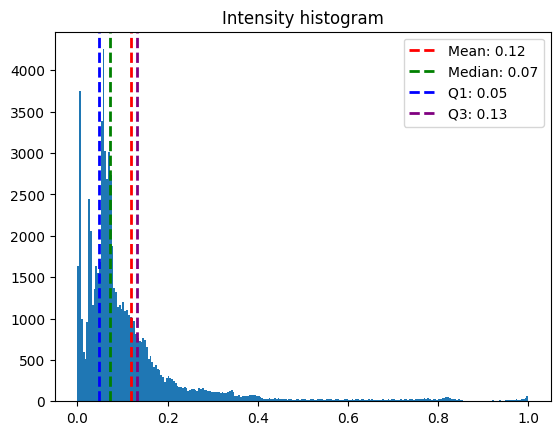

Inclusion Areas:  [ 756.  306.   95.   18.   26.   27.   46. 1572.]


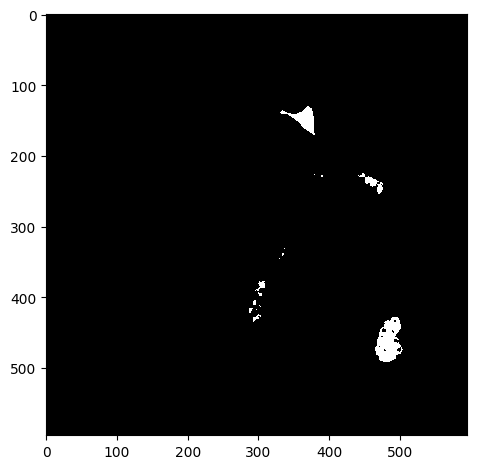

Threshold:  0.5
Bin count 67


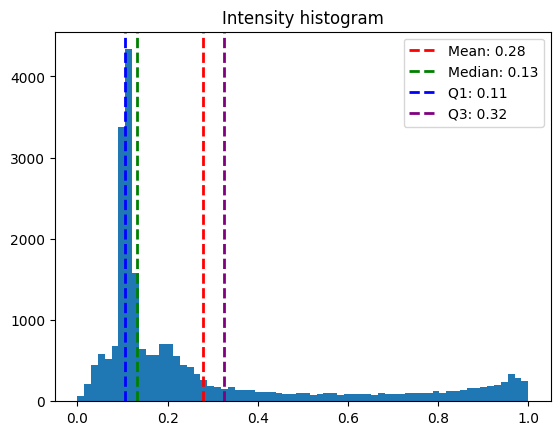

Inclusion Areas:  [ 102. 4144.   16.   18.   29.   14.  149.]


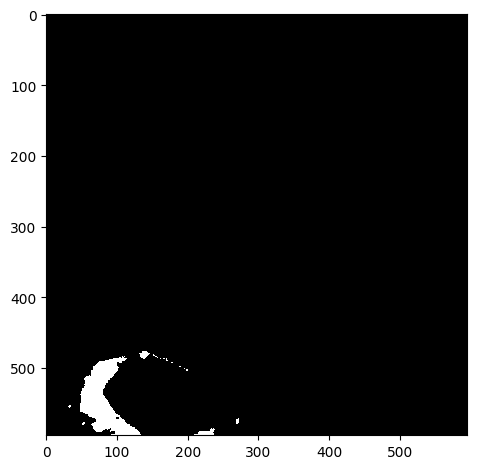

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_04.czi
Red Channel


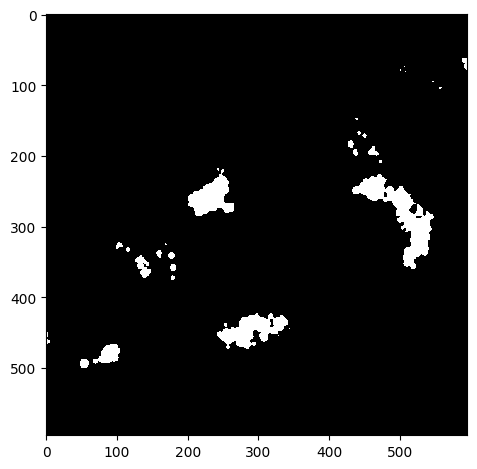

Green Channel


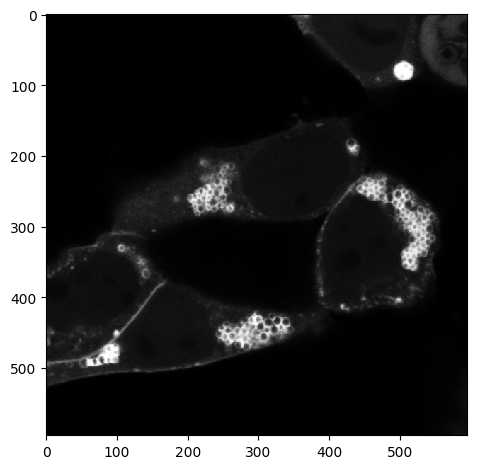

Segmented Cells


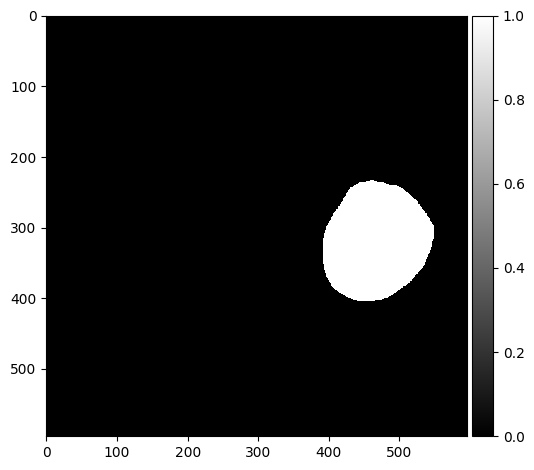

Threshold:  0.5
Bin count 42


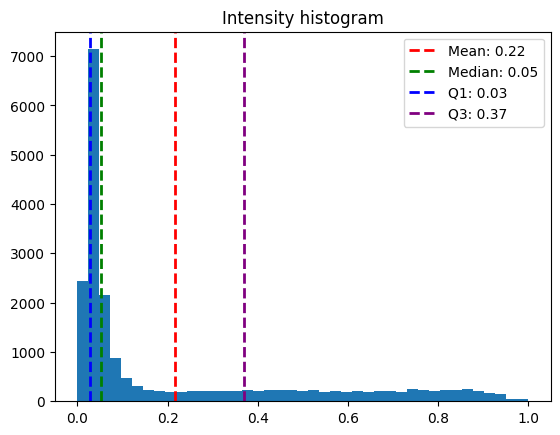

Inclusion Areas:  [ 682. 2540.   63.   19.]


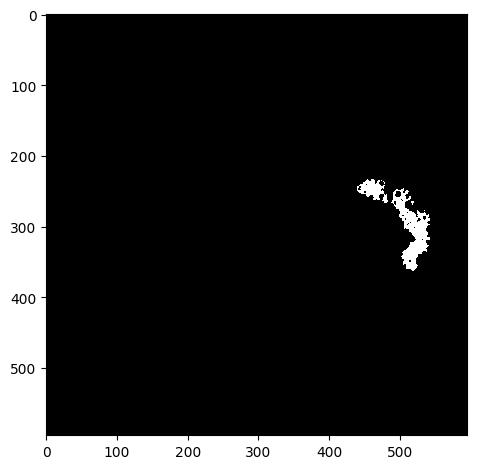

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_05.czi
Red Channel


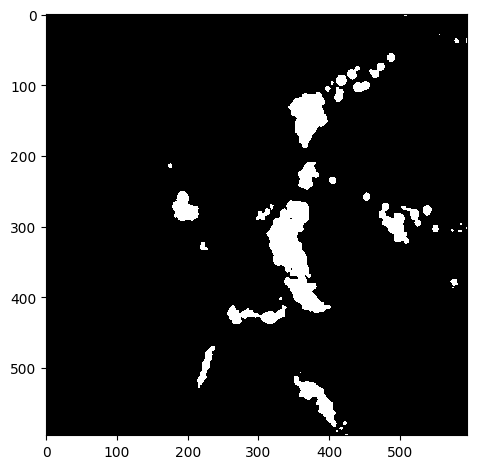

Green Channel


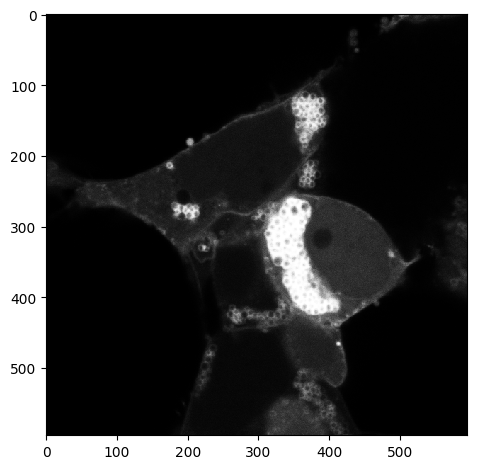

Segmented Cells


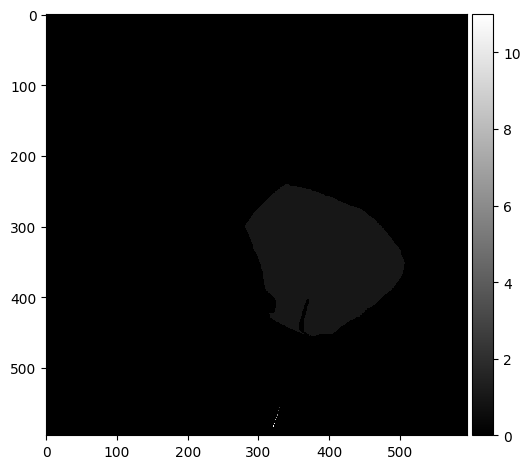

Threshold:  0.99
Bin count 36


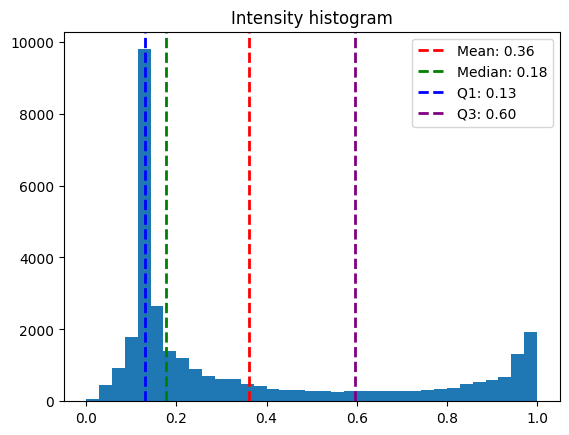

Inclusion Areas:  [ 14.  14.  20. 782.  16. 196.  16.  46. 533.  43. 169.]


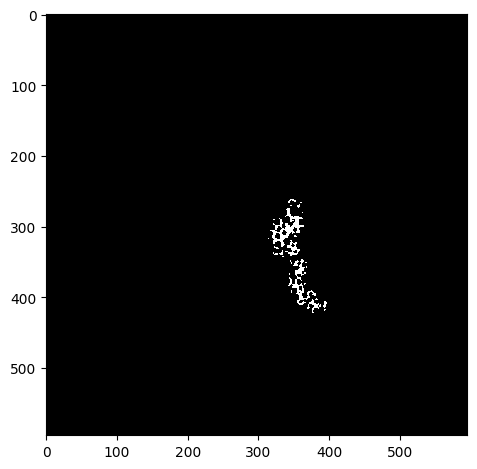

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_06.czi
Red Channel


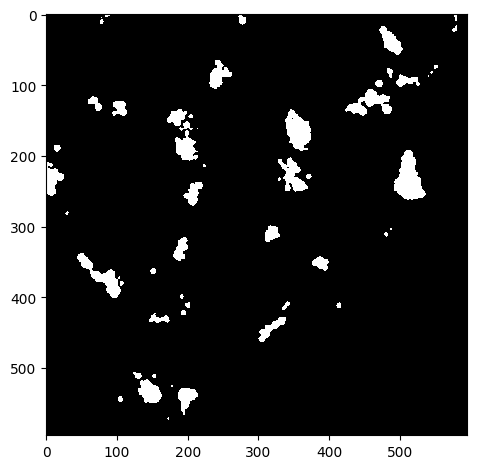

Green Channel


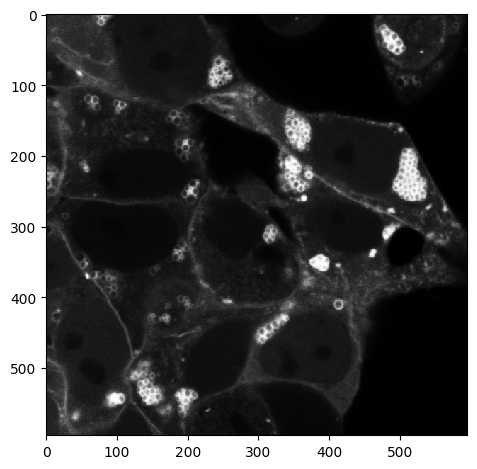

Segmented Cells


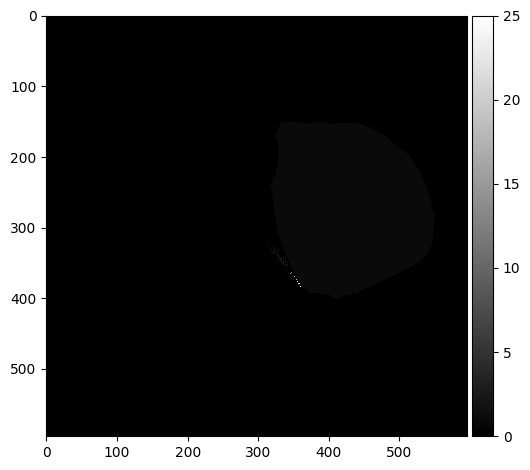

Threshold:  0.5
Bin count 105


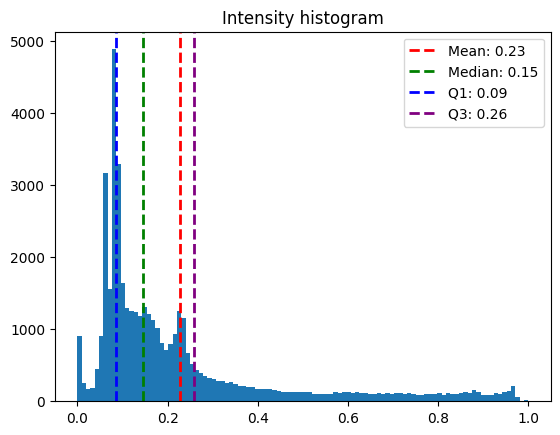

Inclusion Areas:  [  11. 1046. 2167. 1055.  161.   70.   31.   57.   11.  271.   23.   93.
  506.   32.   47.]


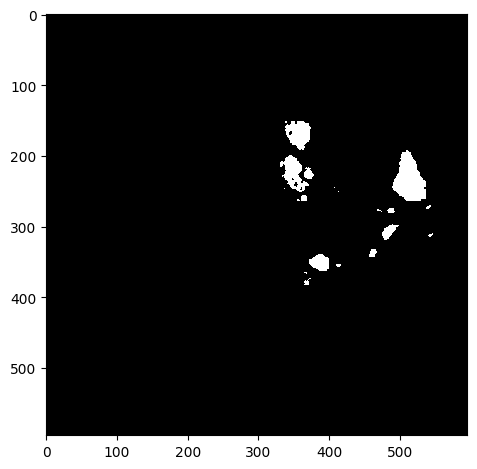

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_01.czi
Red Channel


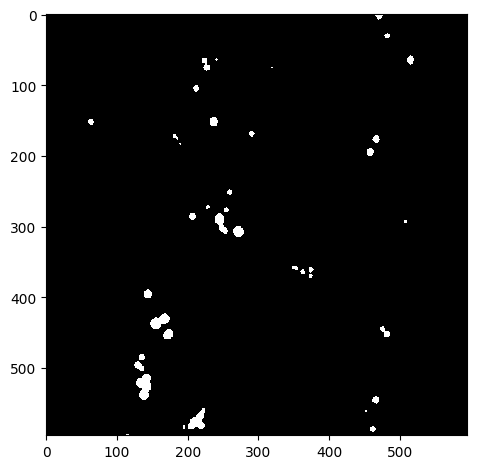

Green Channel


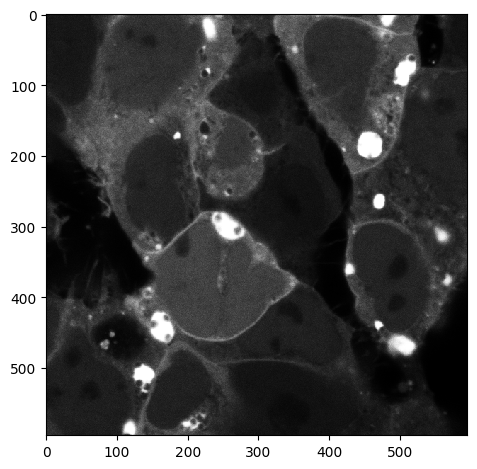

Segmented Cells


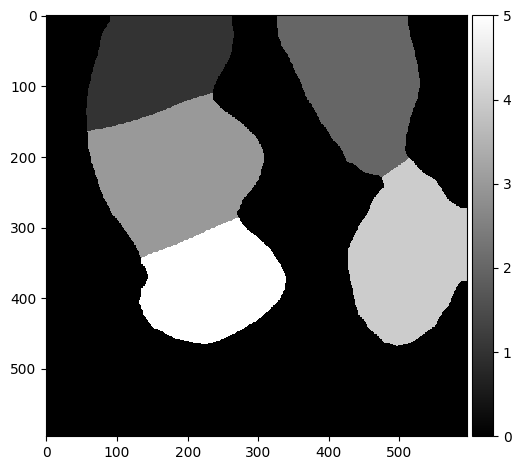

Threshold:  0.5
Bin count 117


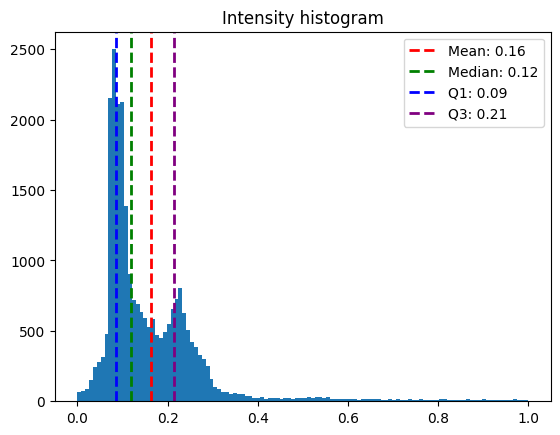

Inclusion Areas:  [ 66. 644.  20.  47.  15.]


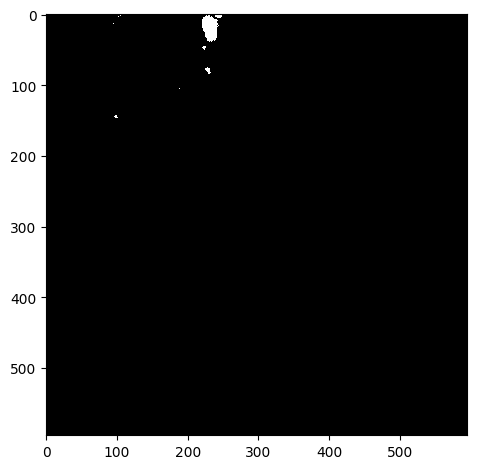

Threshold:  0.5
Bin count 79


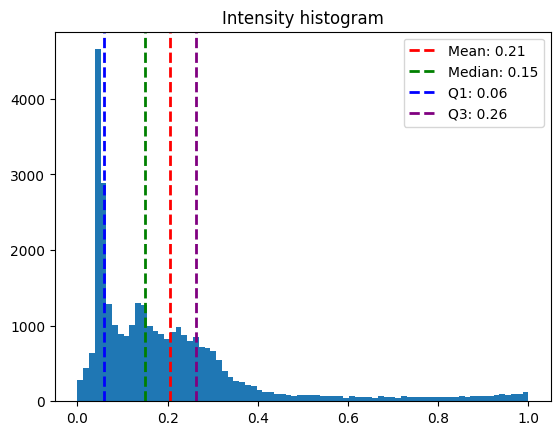

Inclusion Areas:  [  68.   52.  651.   84.  925.   30.   83.   81.   15.   14.   17. 1162.
   23.]


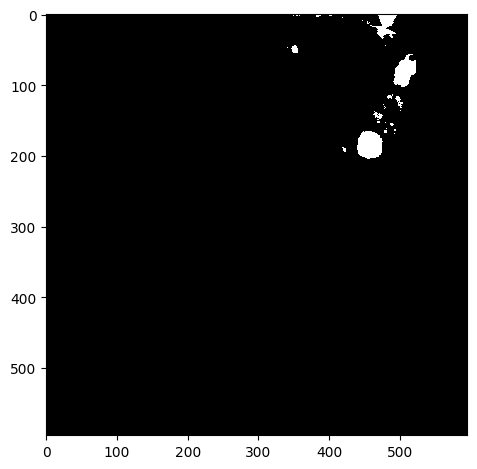

Threshold:  0.5
Bin count 93


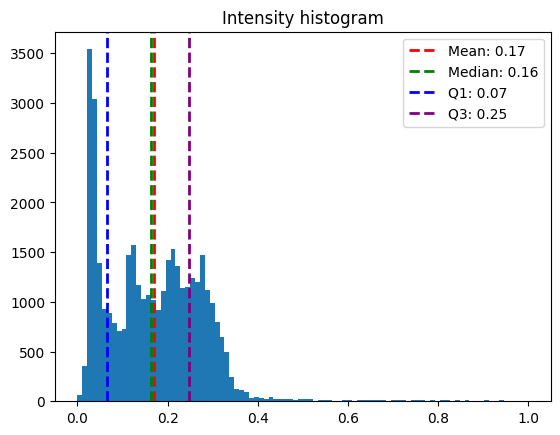

Inclusion Areas:  [ 12.  24.  81.  35.  34.  14.  29. 402.  68.  14.]


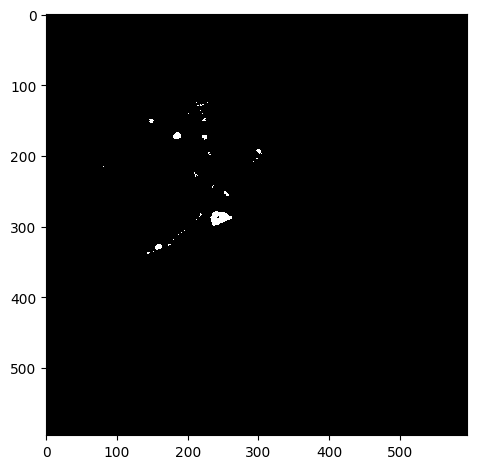

Threshold:  0.5
Bin count 206


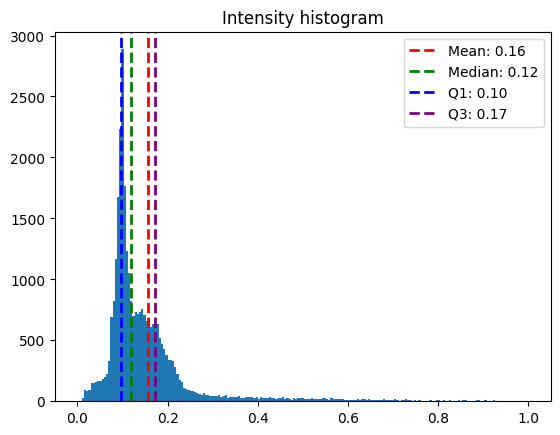

Inclusion Areas:  [305. 278.  98. 135. 119. 309.]


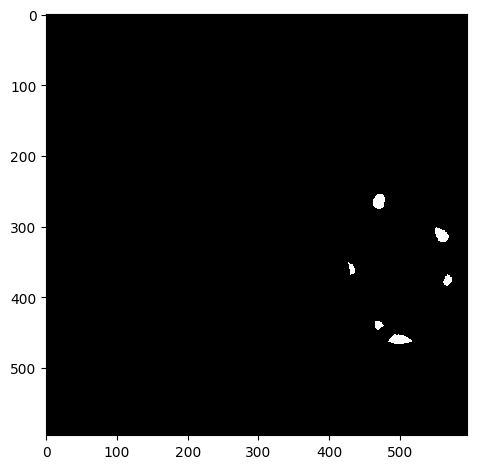

Threshold:  0.5
Bin count 284


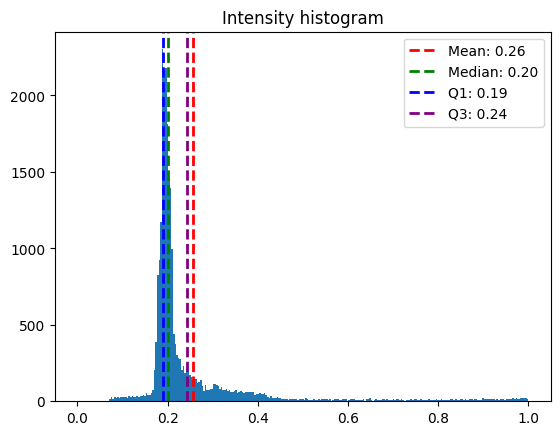

Inclusion Areas:  [914.  89.  52.  43.  12.  69.  59.  16. 722.]


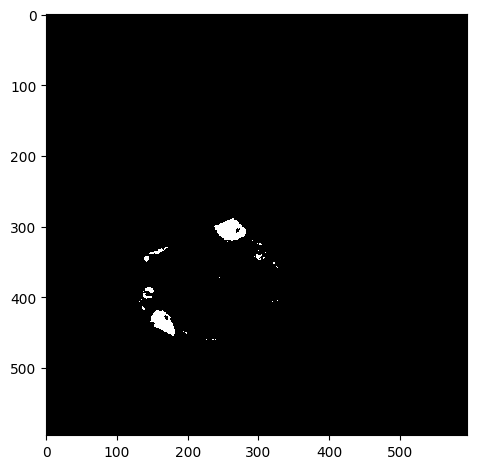

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_02.czi
Red Channel


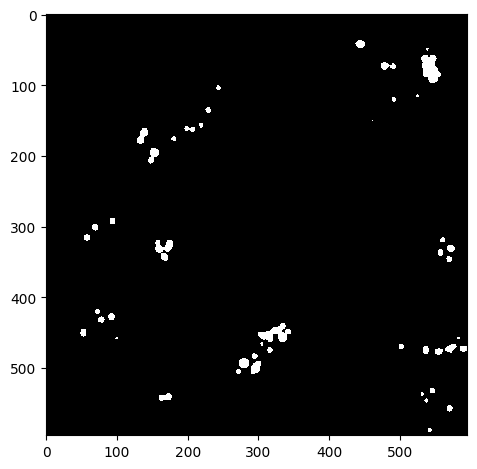

Green Channel


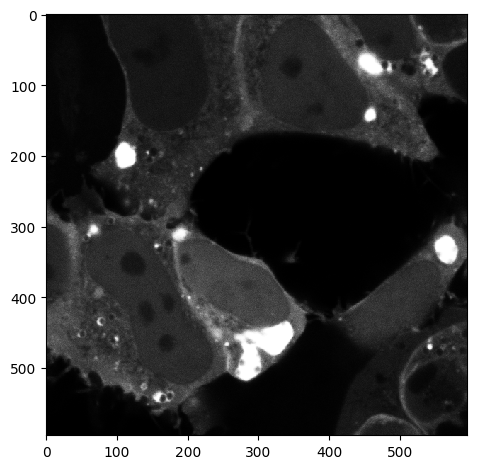

Segmented Cells


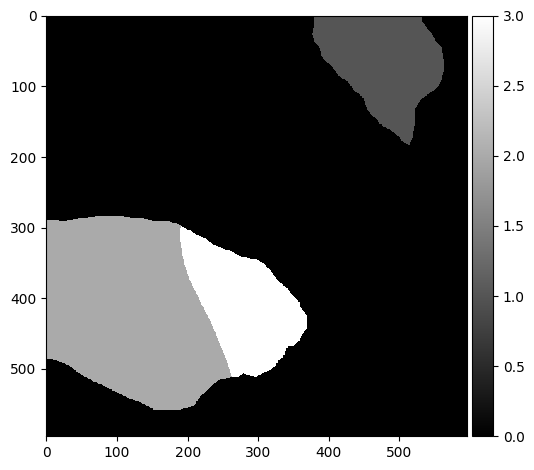

Threshold:  0.5
Bin count 96


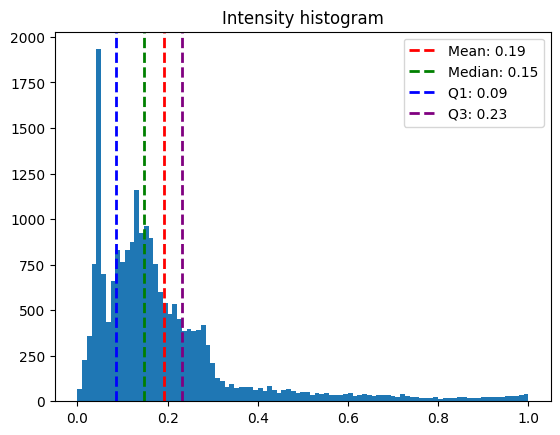

Inclusion Areas:  [  15. 1017.  387.   90.   75.]


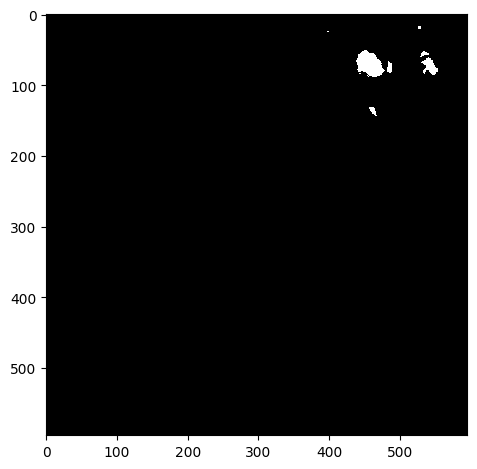

Threshold:  0.5
Bin count 173


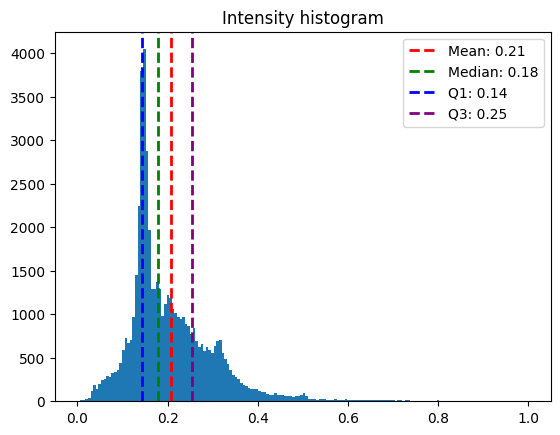

Inclusion Areas:  [205. 204.  32.  37.  55.  16.  13.  31.  50. 180.  11.  31.  42.  41.
 163.  28.]


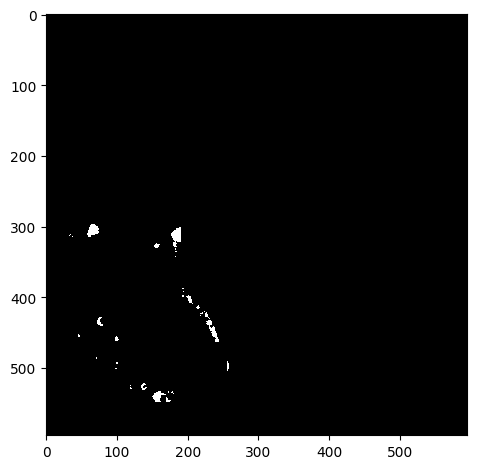

Threshold:  0.99
Bin count 67


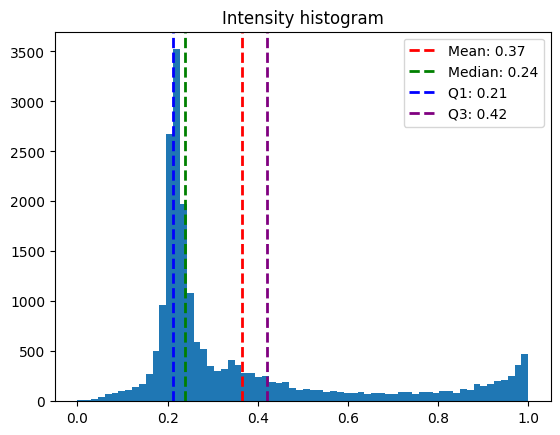

Inclusion Areas:  [  11. 2212.]


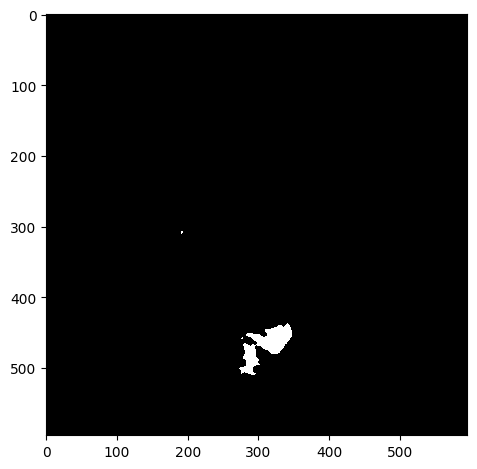

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_03.czi
Red Channel


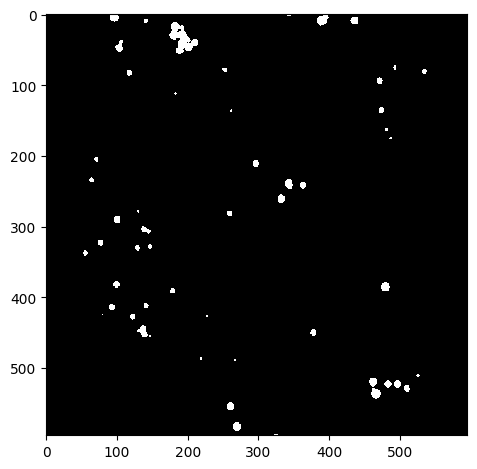

Green Channel


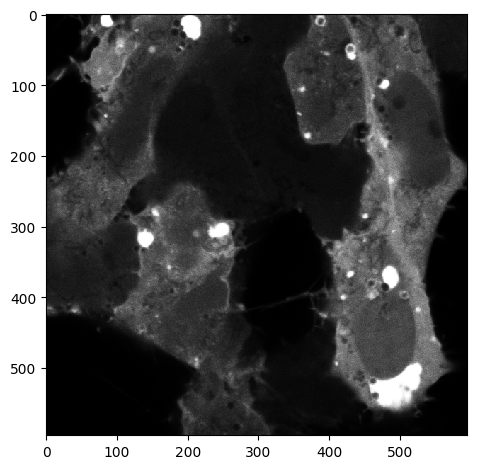

Segmented Cells


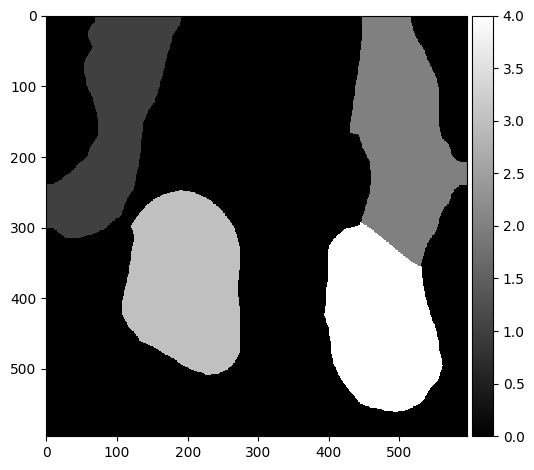

Threshold:  0.5
Bin count 111


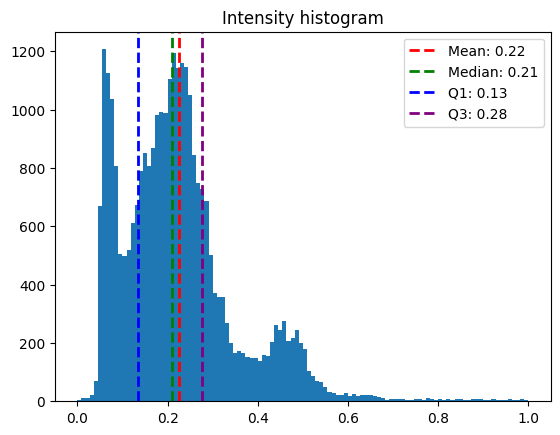

Inclusion Areas:  [294.  12.  24.  13. 280.  15.  50. 239.  68.  91.  58.  23.]


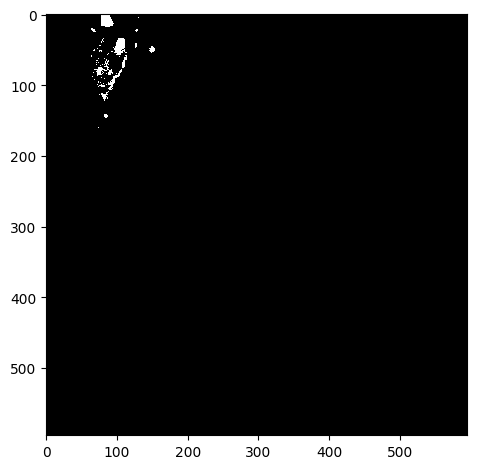

Threshold:  0.99
Bin count 60


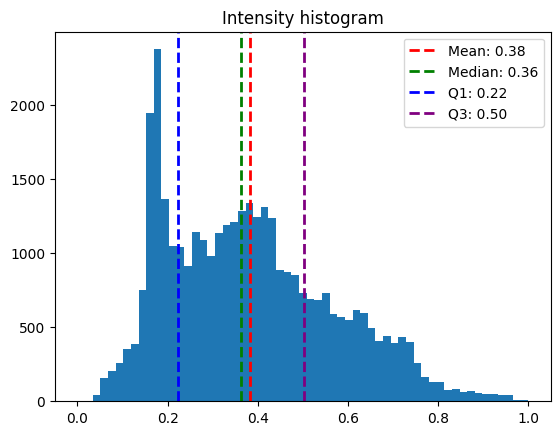

Inclusion Areas:  [52.]


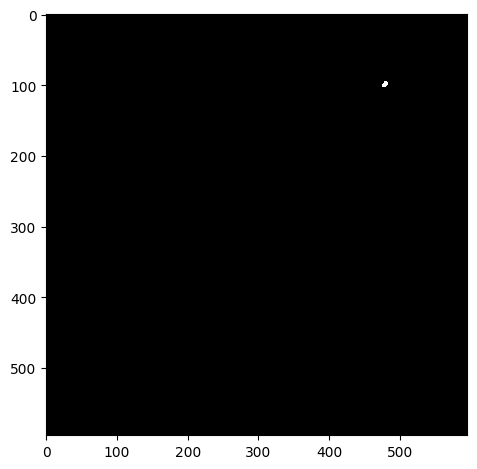

Threshold:  0.5
Bin count 119


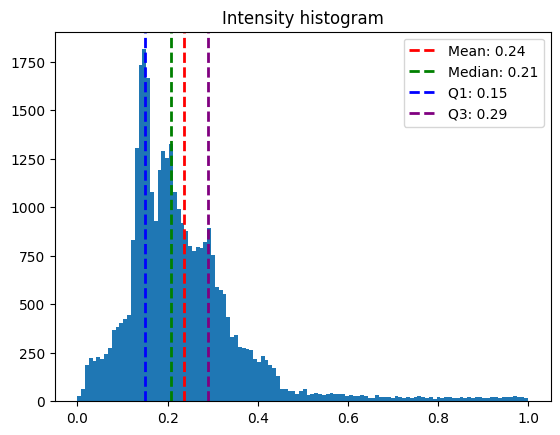

Inclusion Areas:  [164. 663. 520.  13.  38. 195.  53.  48.]


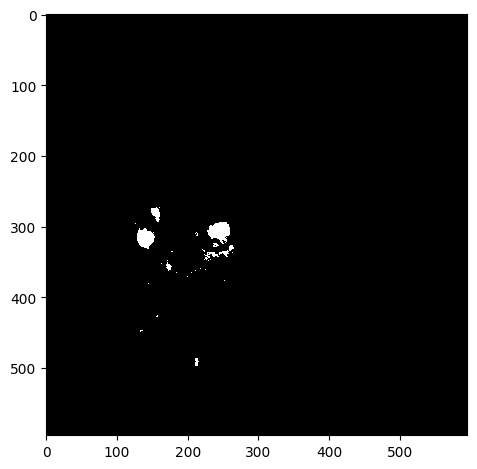

Threshold:  0.99
Bin count 88


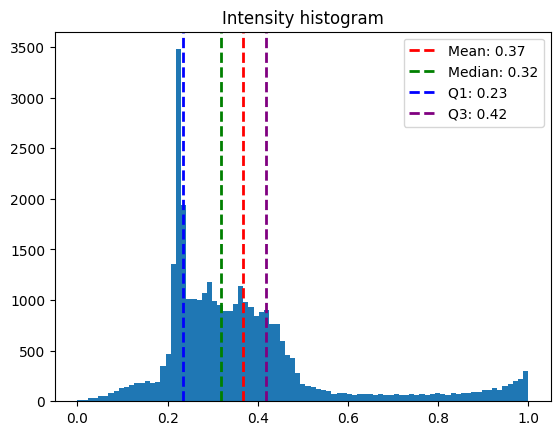

Inclusion Areas:  [ 376.   17. 1653.   14.]


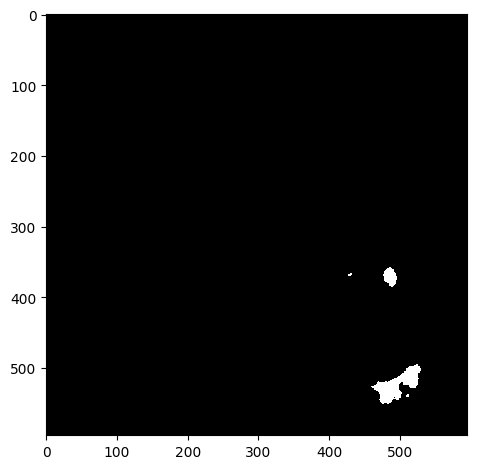

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_04.czi
Red Channel


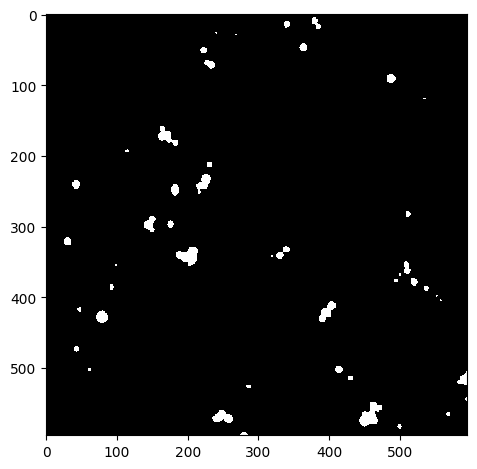

Green Channel


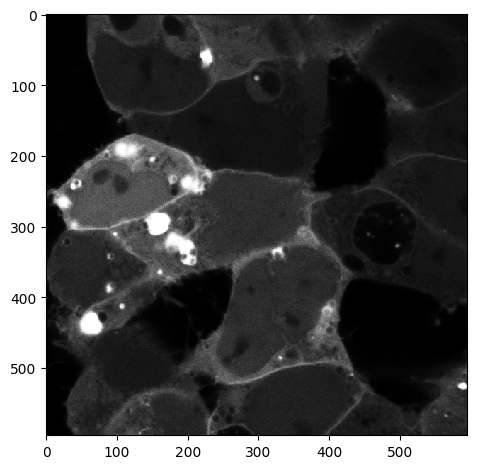

Segmented Cells


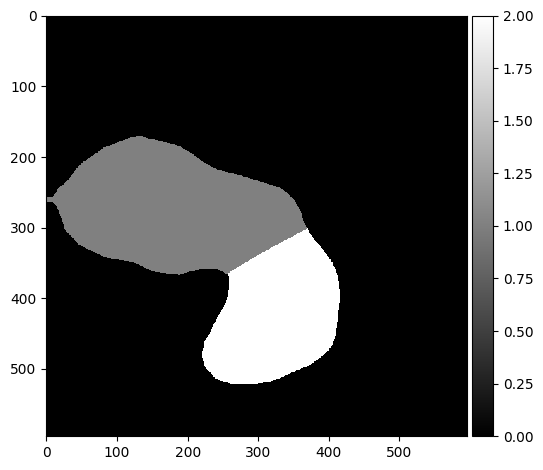

Threshold:  0.5
Bin count 85


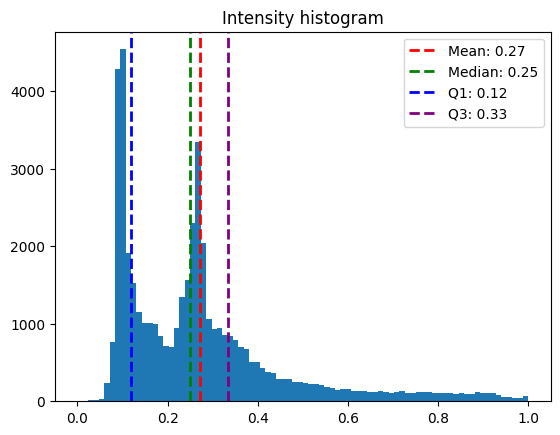

Inclusion Areas:  [1327. 2475.   60.   80.  146.  208.  457.  523.   23. 1325.   65.   17.]


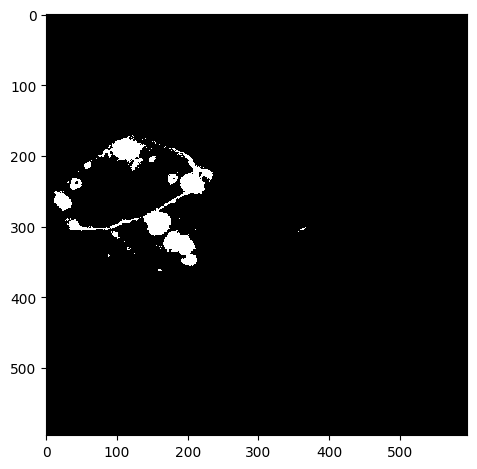

Threshold:  0.5
Bin count 110


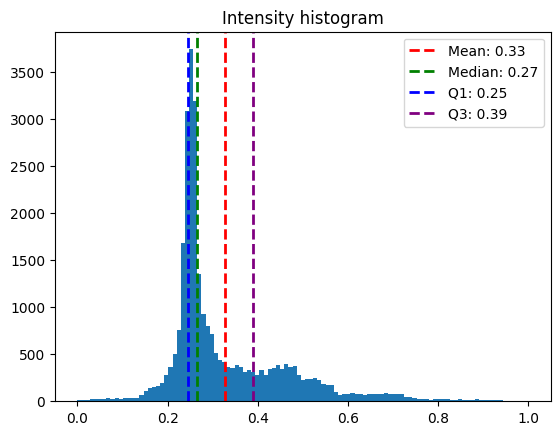

Inclusion Areas:  [ 53.  13. 175. 388.  28.  24.  14.]


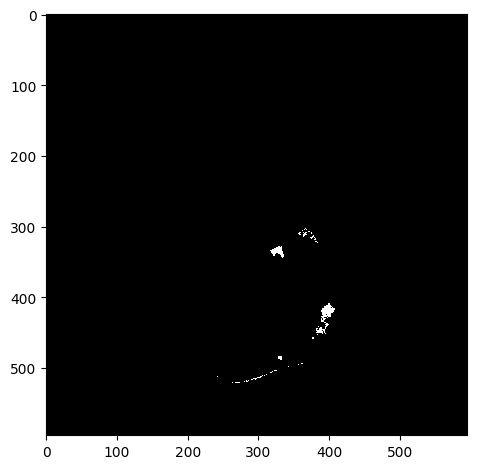

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_05.czi
Red Channel


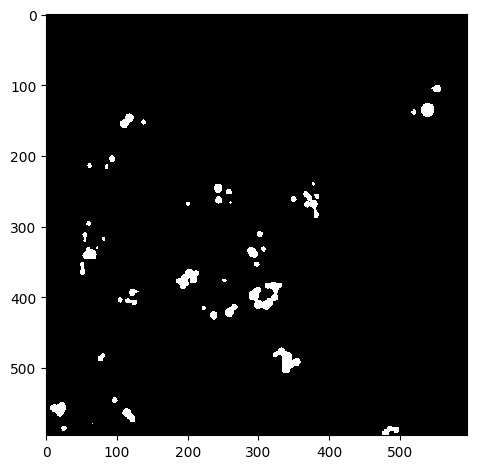

Green Channel


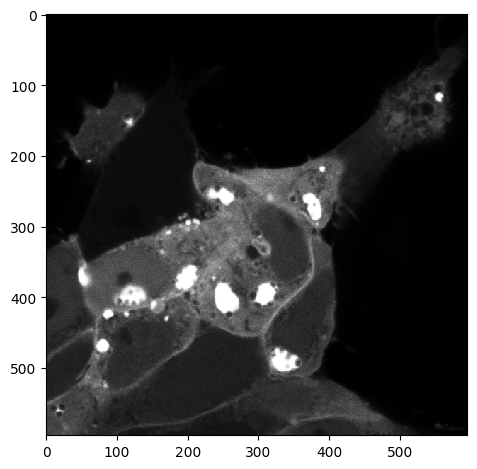

Segmented Cells


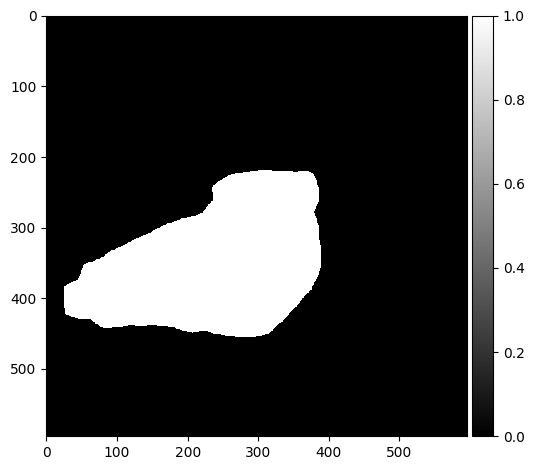

Threshold:  0.5
Bin count 112


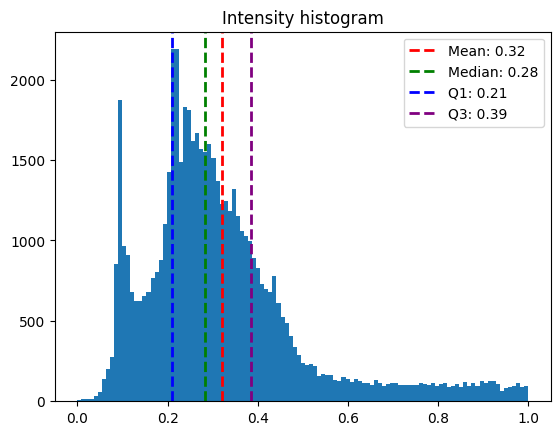

Inclusion Areas:  [ 571.   13.   16.  712.   22.  192.  721.   17.   31.  327.   24.   49.
  126.   11.   18. 5179.  190.   16.   20.   15.   52.   38.   21.   13.
  411.   36.  787.  184.   13.  206.   37.   16.]


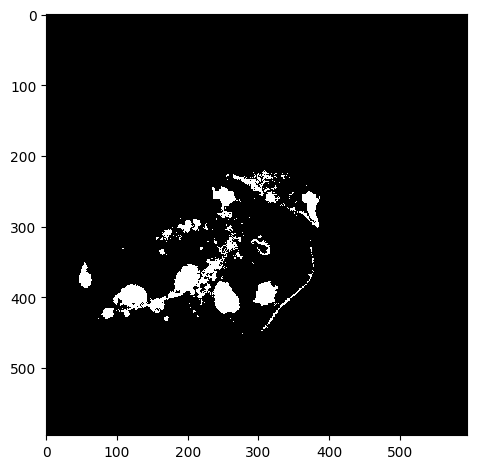

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_06.czi
Red Channel


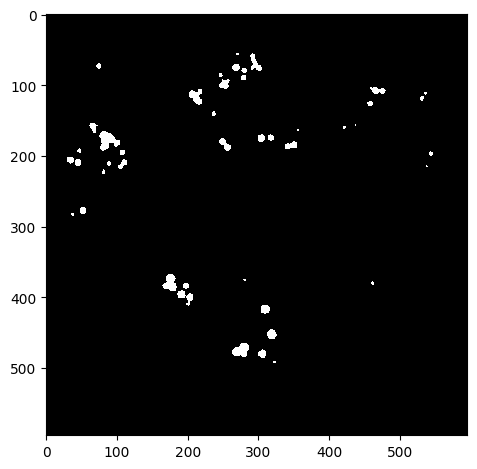

Green Channel


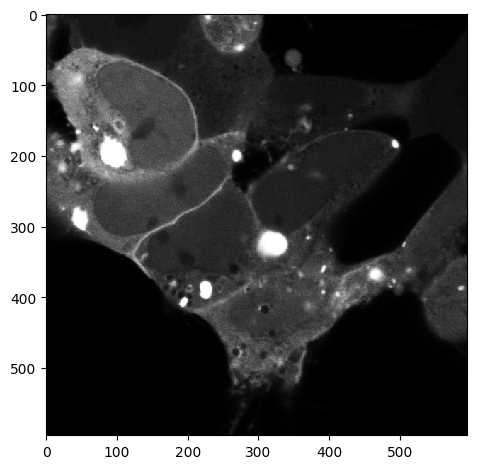

Segmented Cells


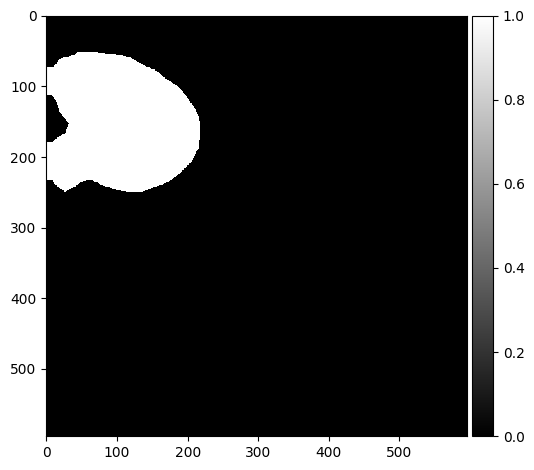

Threshold:  0.99
Bin count 92


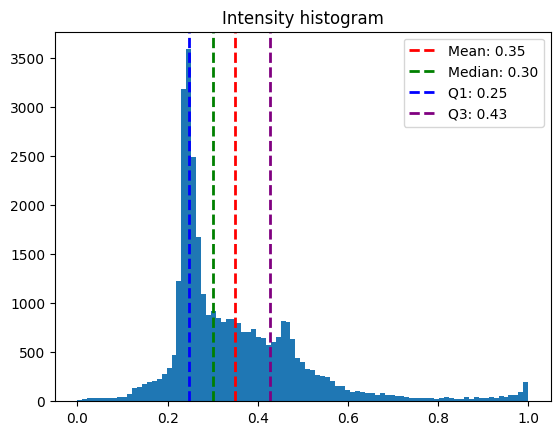

Inclusion Areas:  [944.  12.]


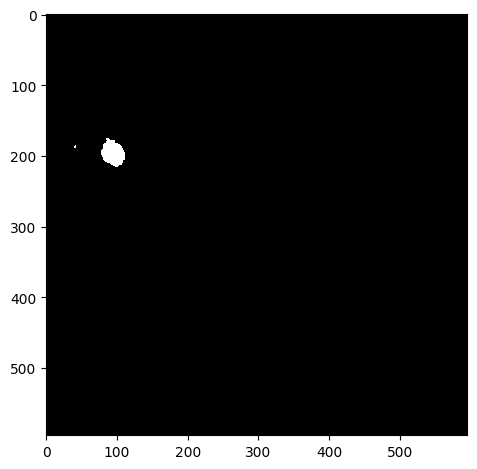

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_01.czi
Red Channel


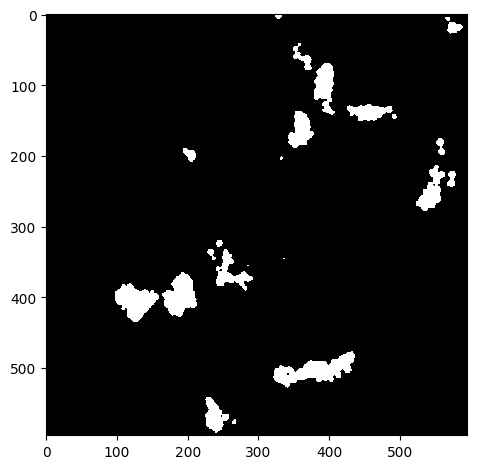

Green Channel


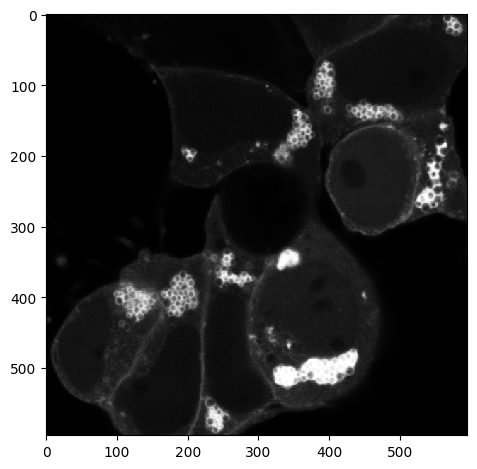

Segmented Cells


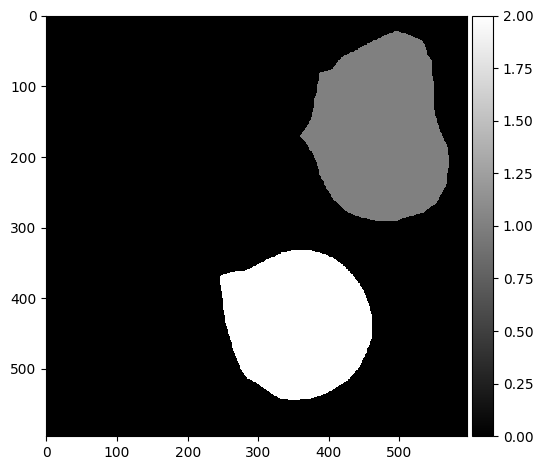

Threshold:  0.5
Bin count 139


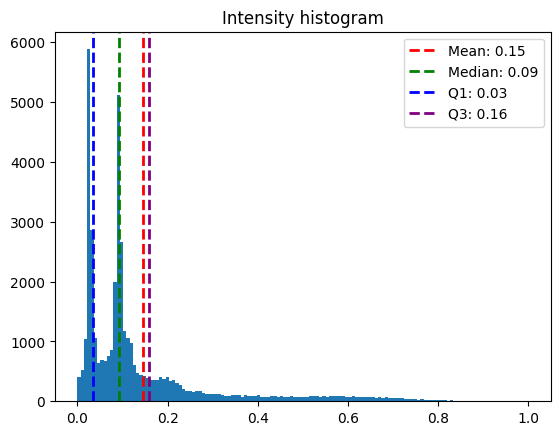

Inclusion Areas:  [396.  18.  21.  31. 700. 130. 156. 991.]


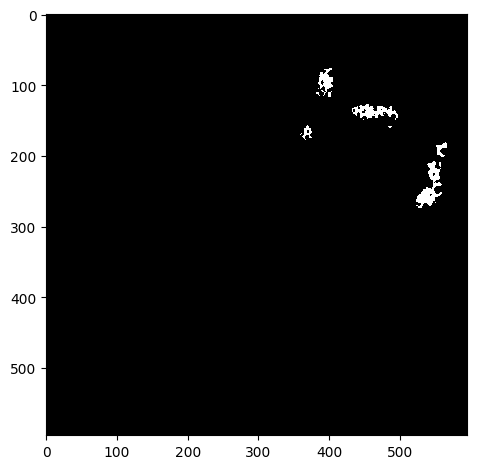

Threshold:  0.5
Bin count 131


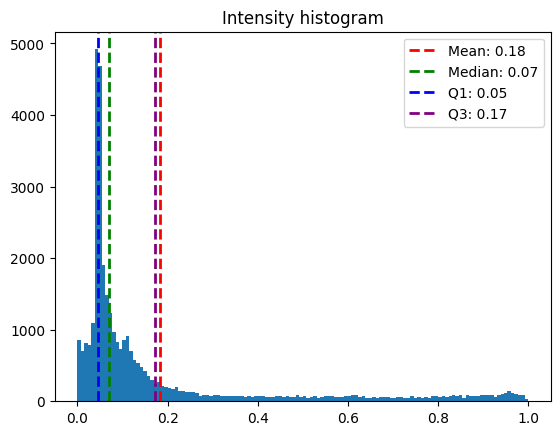

Inclusion Areas:  [ 654.  487.   32.   13.   30. 3474.]


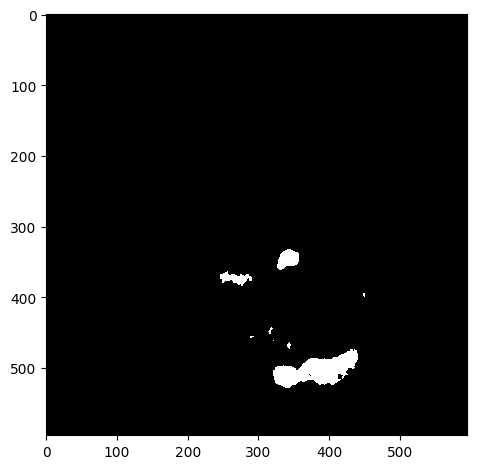

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_02.czi
Red Channel


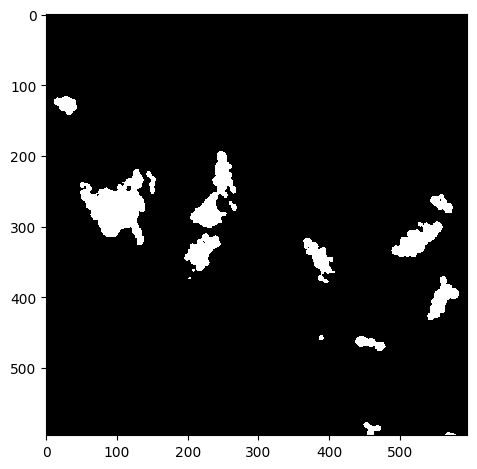

Green Channel


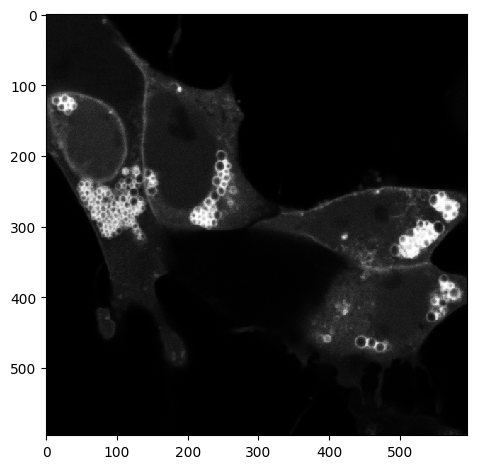

Segmented Cells


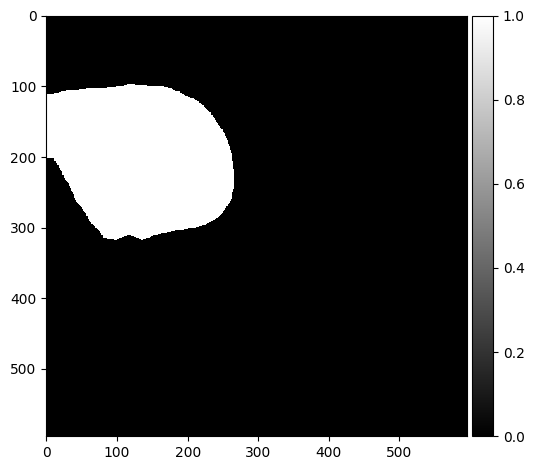

Threshold:  0.5
Bin count 90


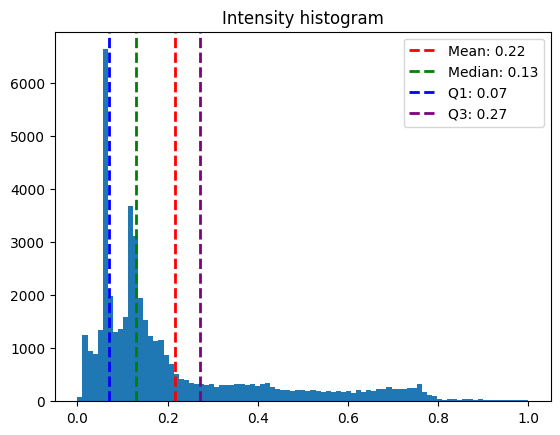

Inclusion Areas:  [  15.  514.  590.  123.   69.  243. 3260.   67.   45.   14.  908.   37.
   22.]


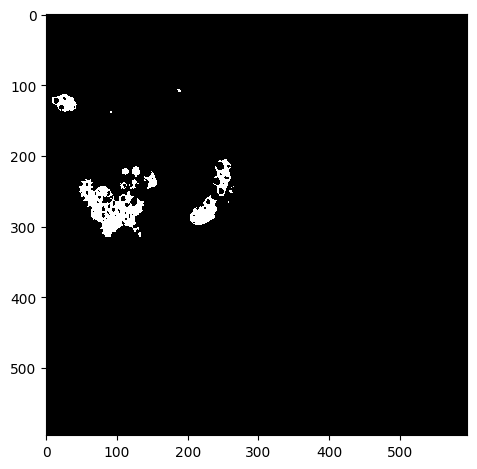

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_03.czi
Red Channel


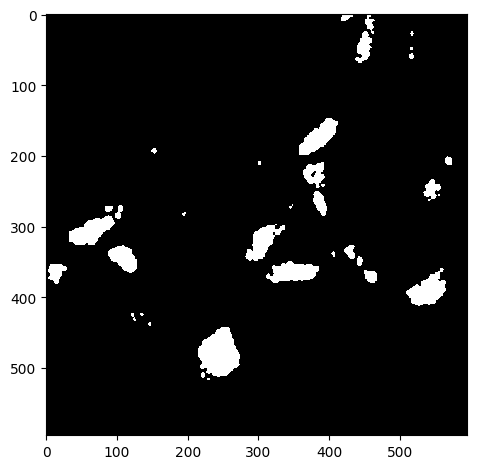

Green Channel


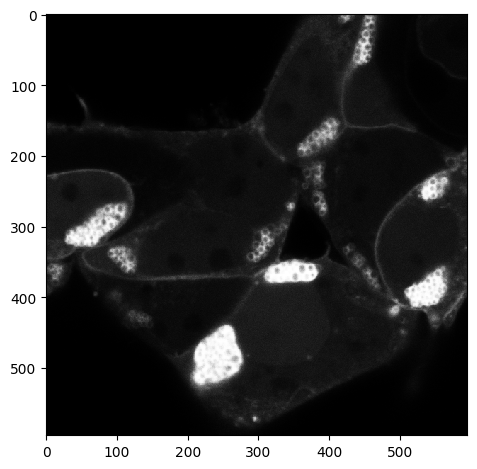

Segmented Cells


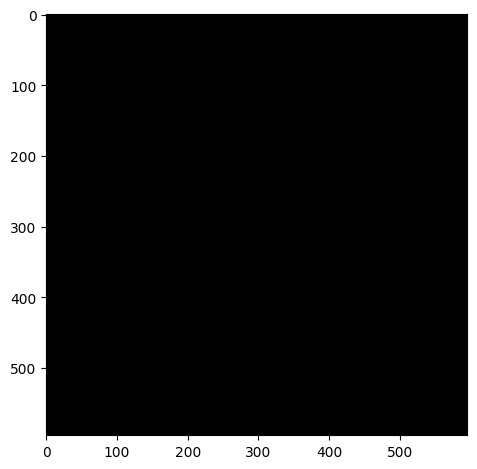

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_04.czi
Red Channel


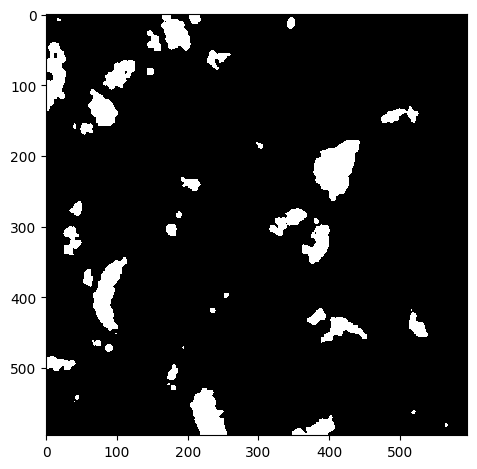

Green Channel


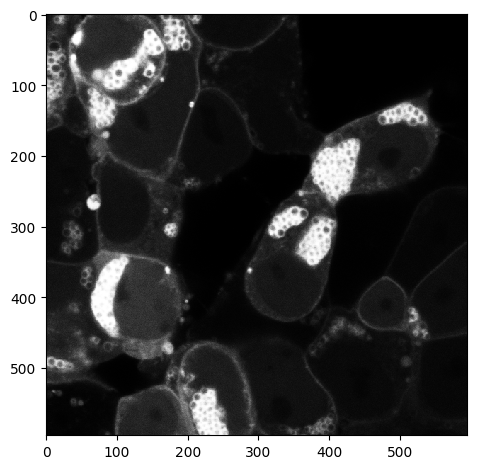

Segmented Cells


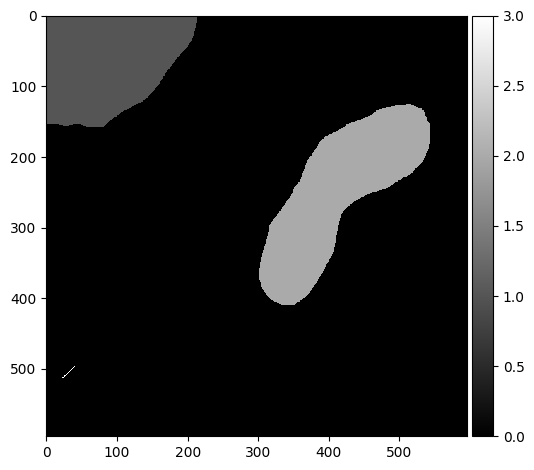

Threshold:  0.99
Bin count 36


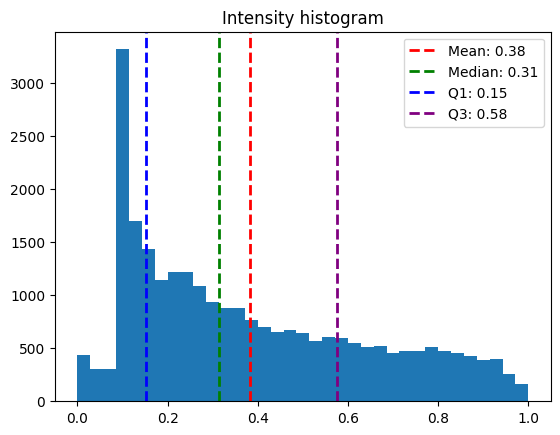

Inclusion Areas:  [ 96. 207.  20. 186.  33.  19.  27.]


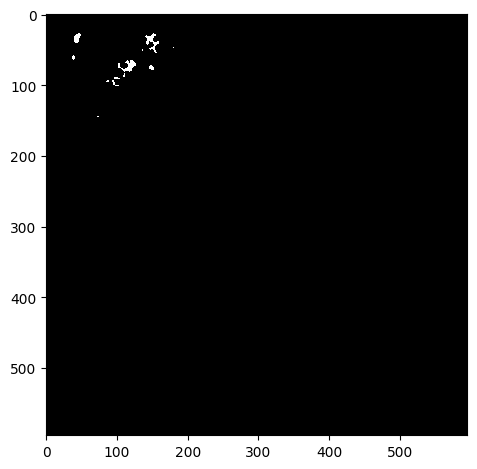

Threshold:  0.99
Bin count 32


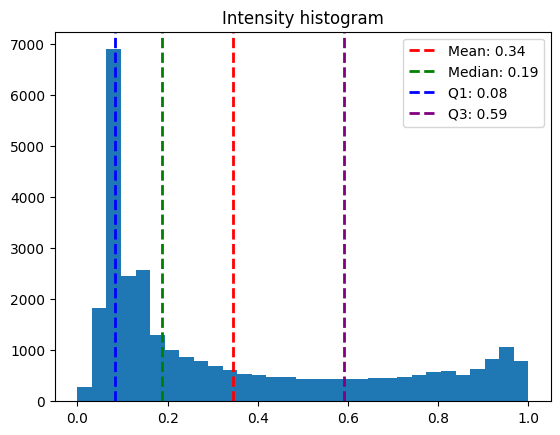

Inclusion Areas:  [17. 24.]


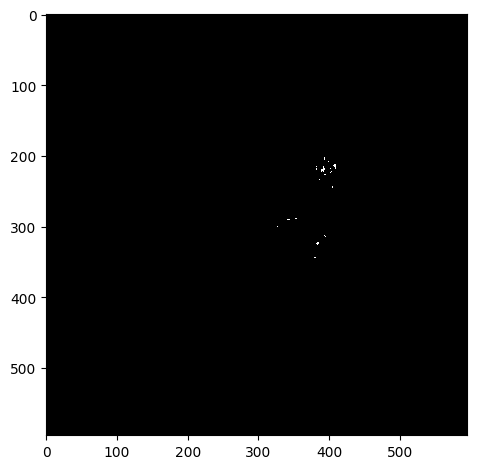

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_05.czi
Red Channel


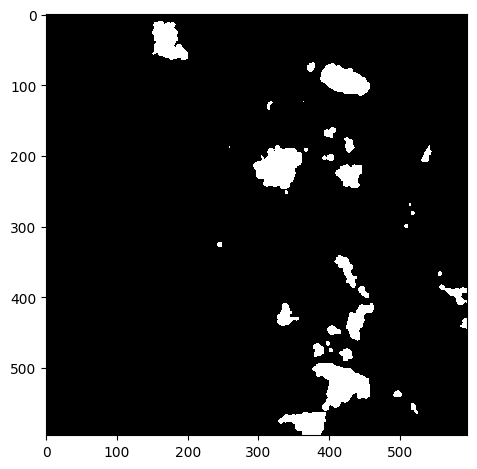

Green Channel


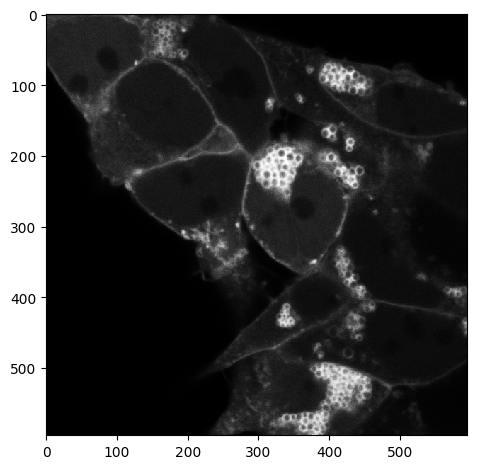

Segmented Cells


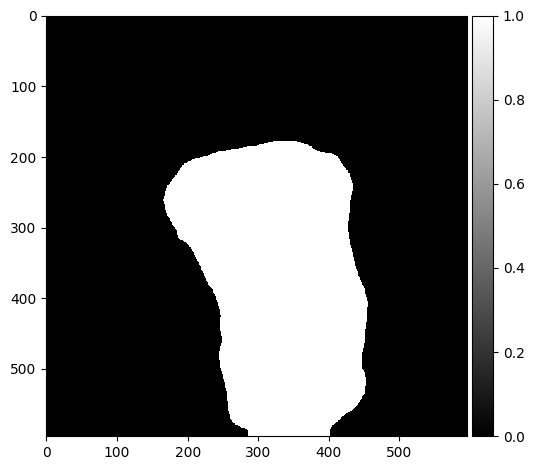

Threshold:  0.5
Bin count 141


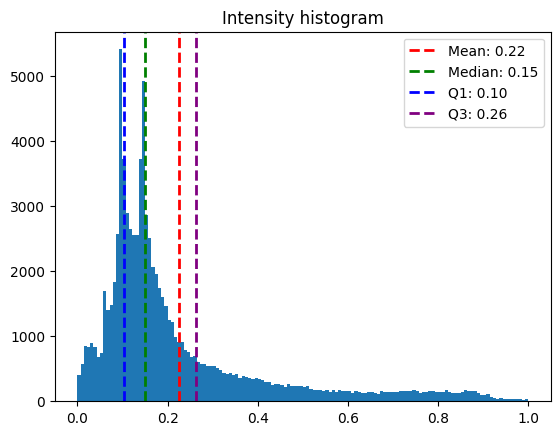

Inclusion Areas:  [2923.  679.   24.   29.  123.   20.   14.   67.   13.   18.   24.   24.
  140.   37.   30.   89.   96.  399.   32. 2518.   46. 1219.]


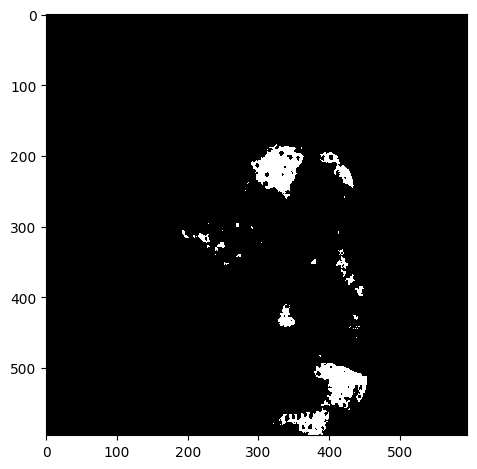

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_06.czi
Red Channel


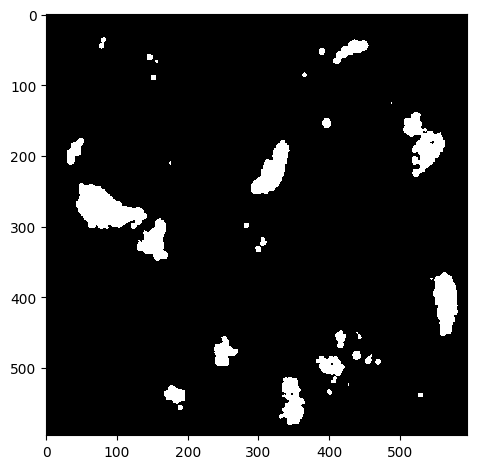

Green Channel


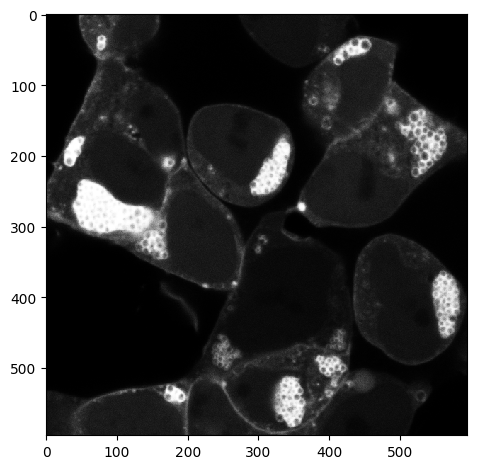

Segmented Cells


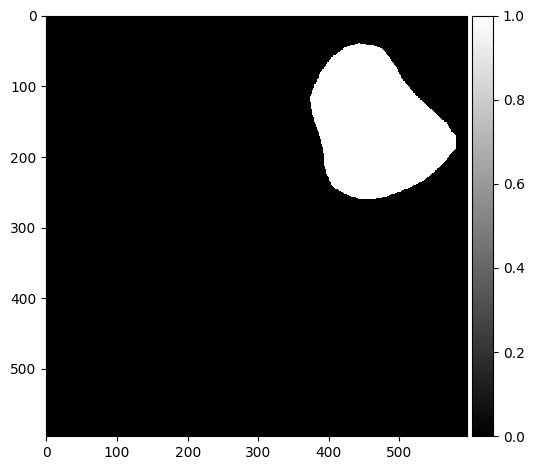

Threshold:  0.5
Bin count 97


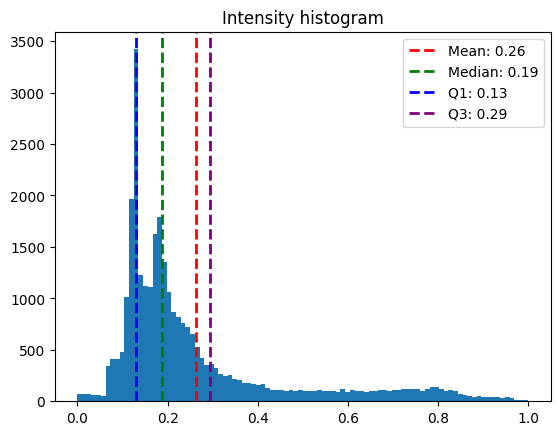

Inclusion Areas:  [ 704.   18.  153.   12. 2337.   12.   41.]


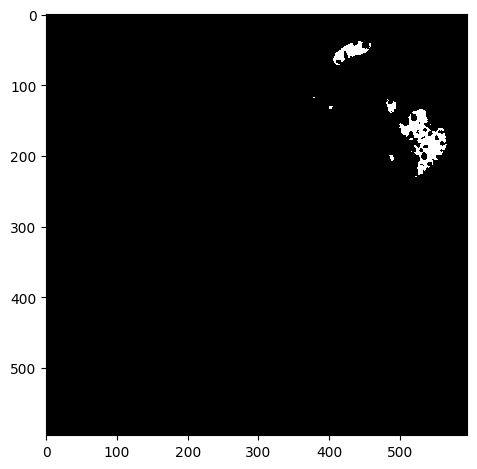

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_01.czi
Red Channel


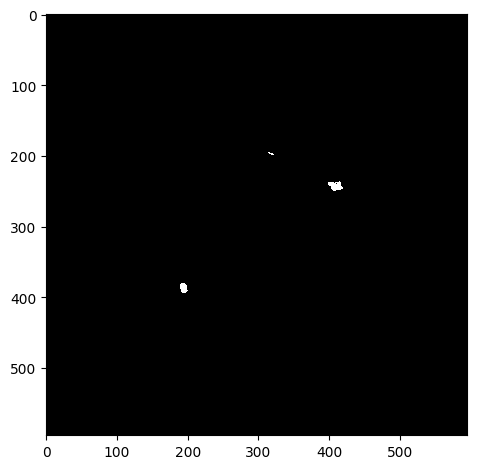

Green Channel


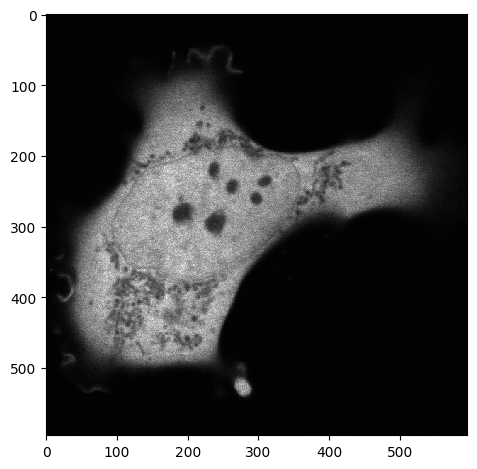

Segmented Cells


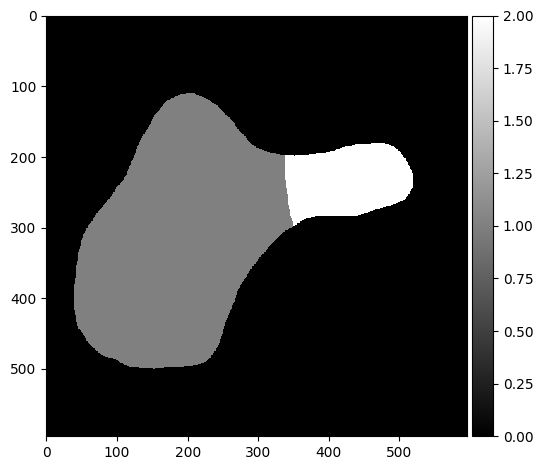

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_02.czi
Red Channel


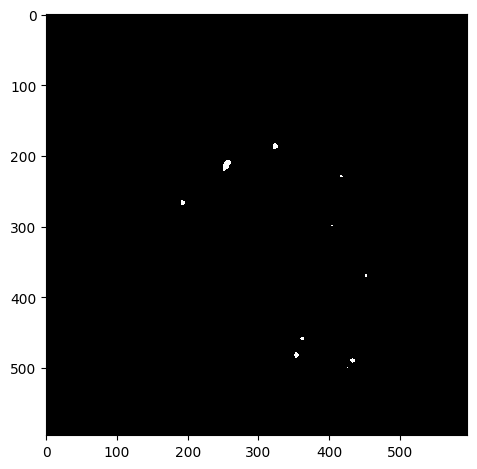

Green Channel


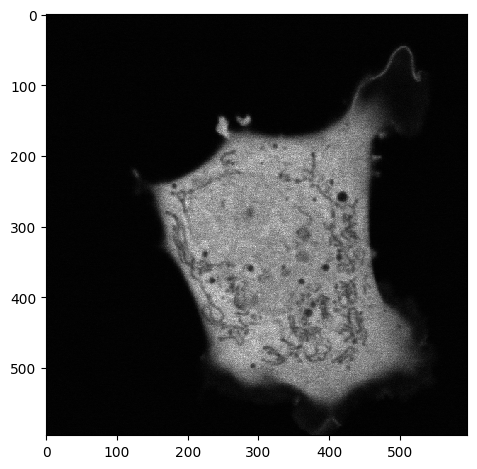

Segmented Cells


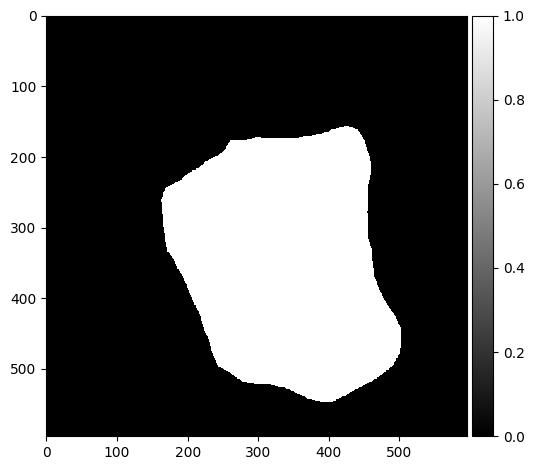

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_03.czi
Red Channel


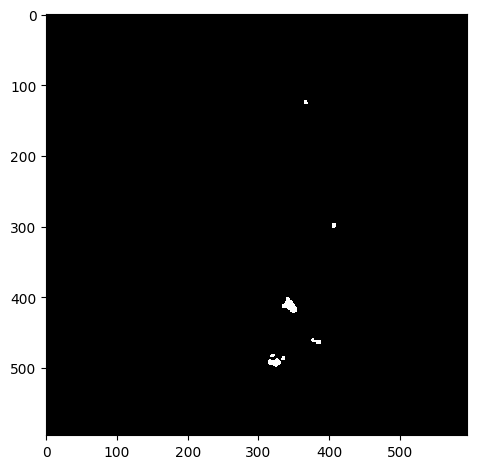

Green Channel


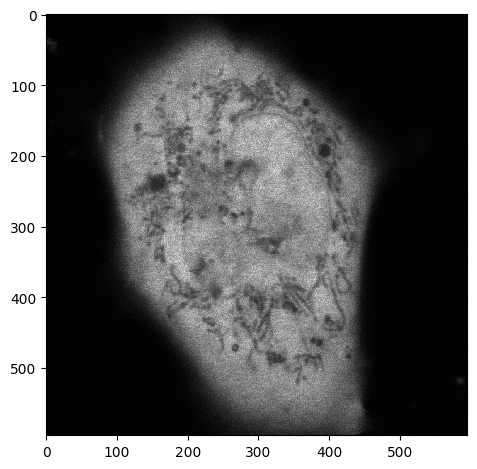

Segmented Cells


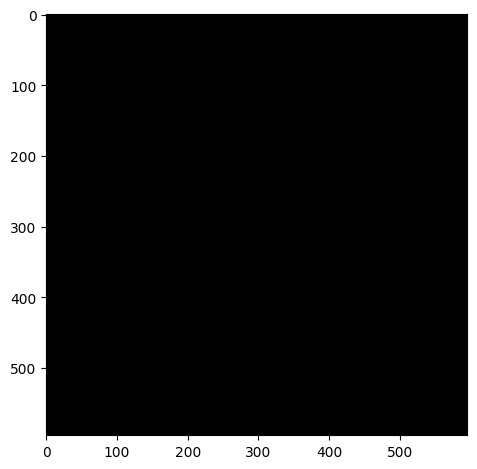

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_04.czi
Red Channel


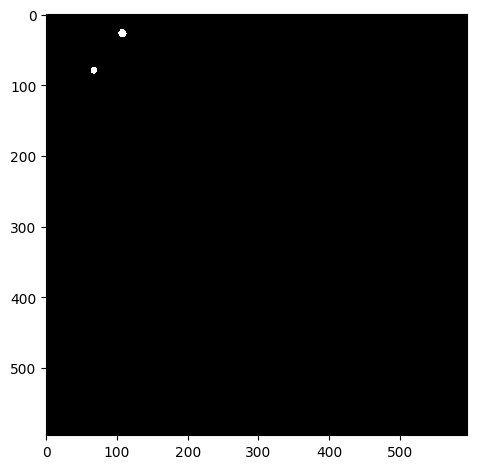

Green Channel


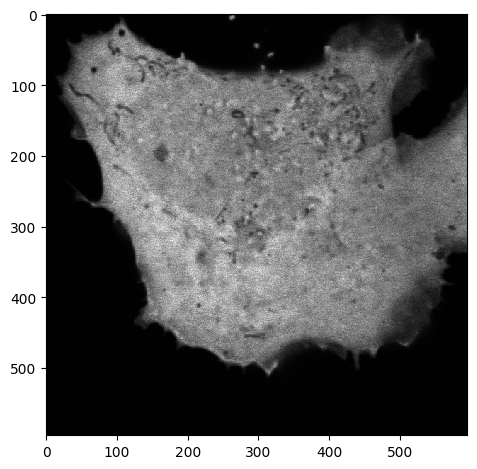

Segmented Cells


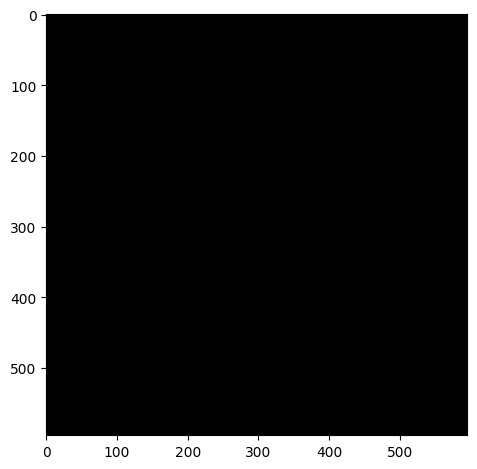

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_05.czi
Red Channel


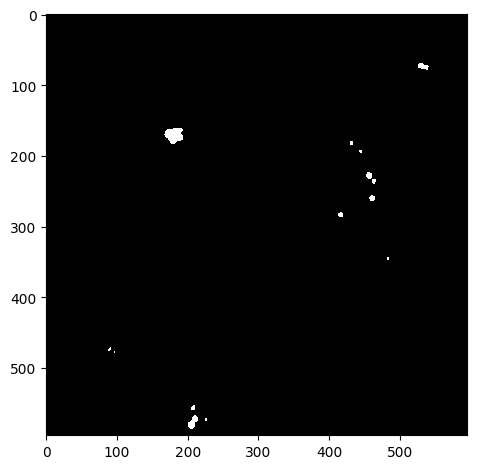

Green Channel


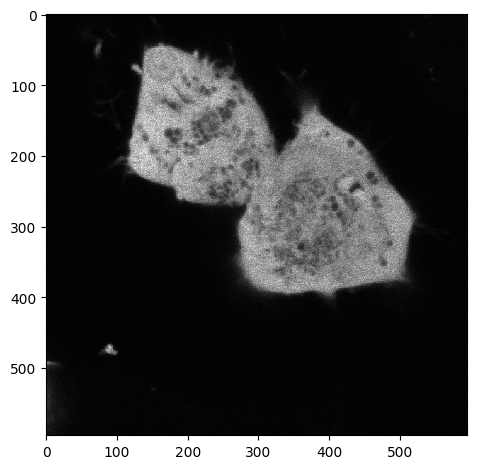

Segmented Cells


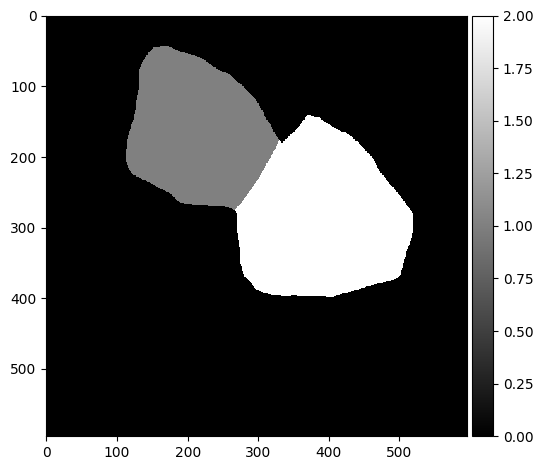

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_06.czi
Red Channel


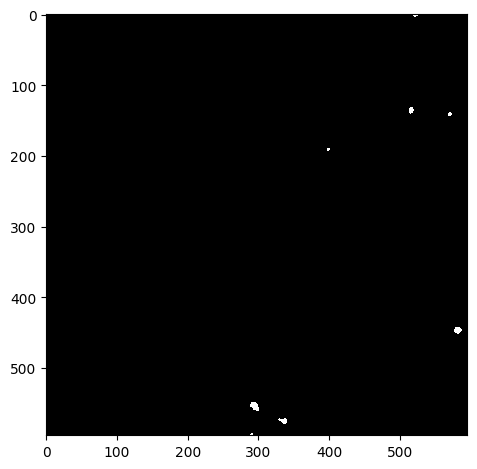

Green Channel


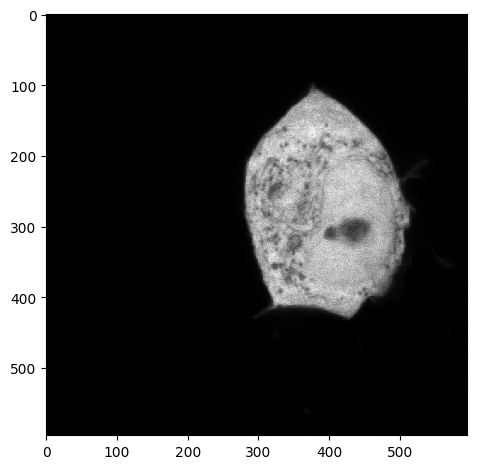

Segmented Cells


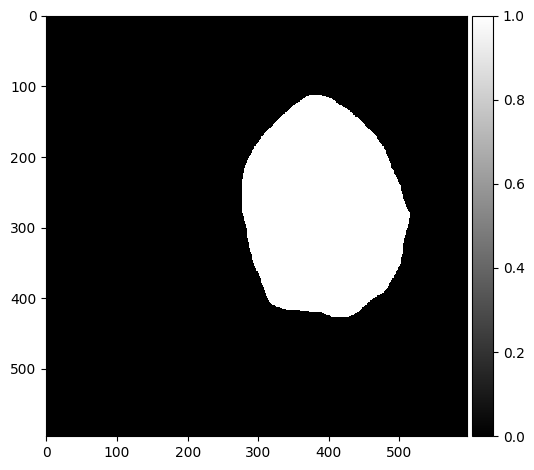

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_01.czi
Red Channel


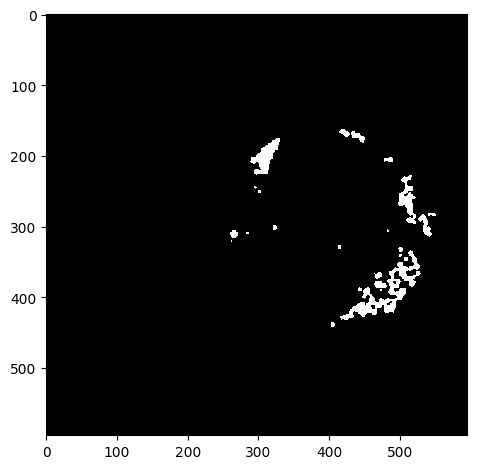

Green Channel


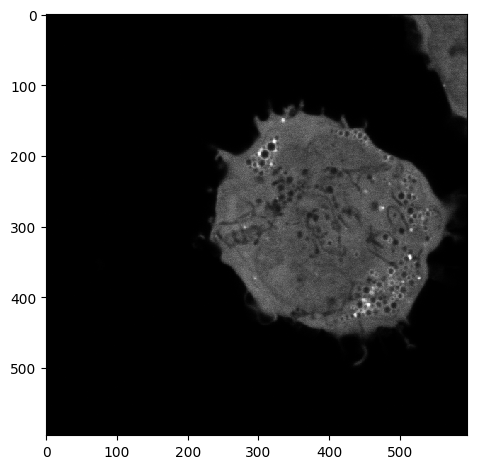

Segmented Cells


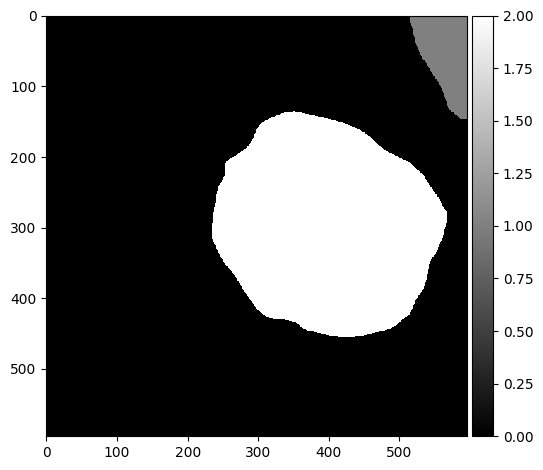

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_02.czi
Red Channel


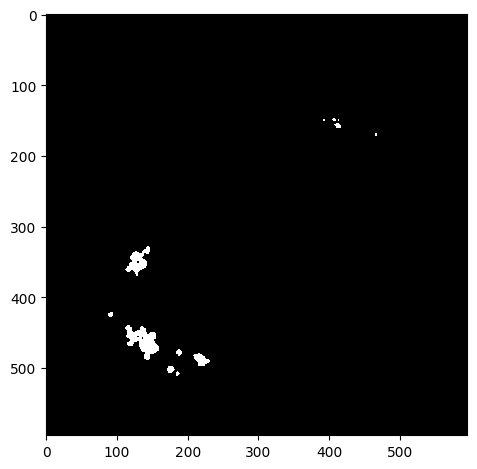

Green Channel


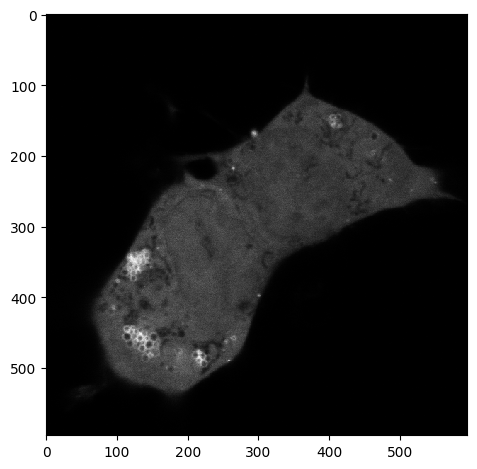

Segmented Cells


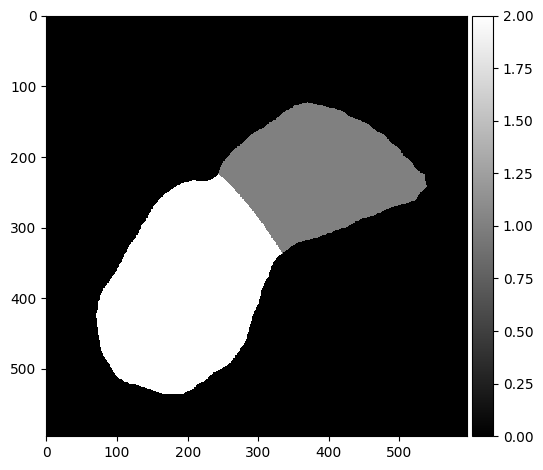

Threshold:  0.5
Bin count 282


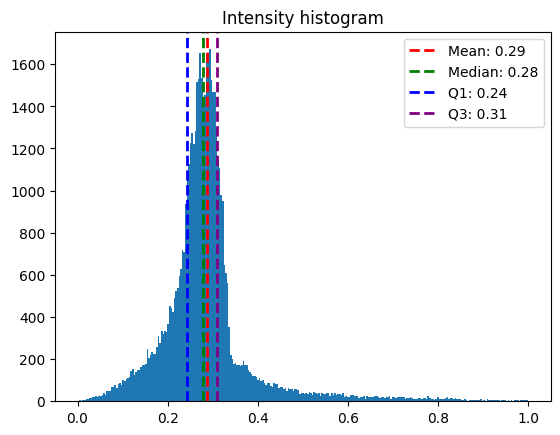

Inclusion Areas:  [718. 587. 171.  40.]


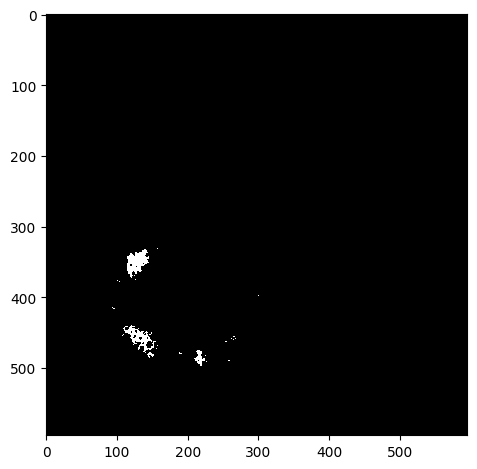

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_03.czi
Red Channel


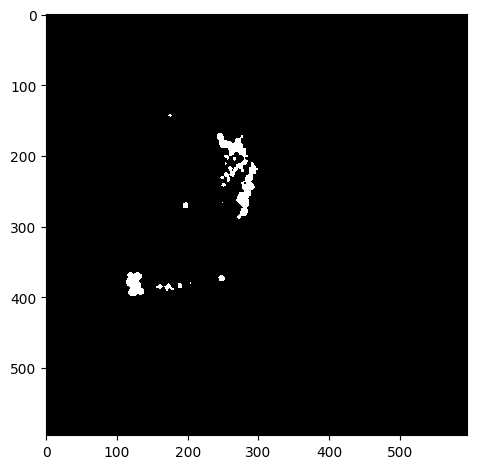

Green Channel


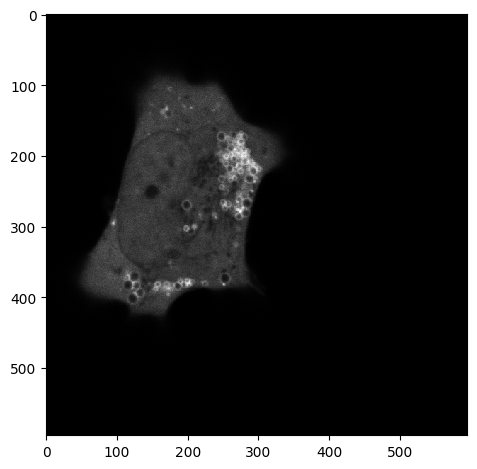

Segmented Cells


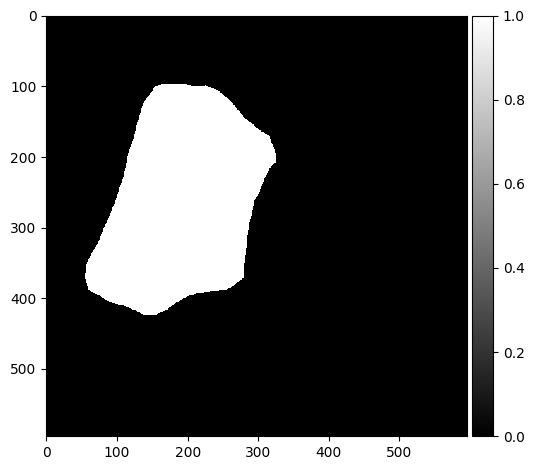

Threshold:  0.5
Bin count 287


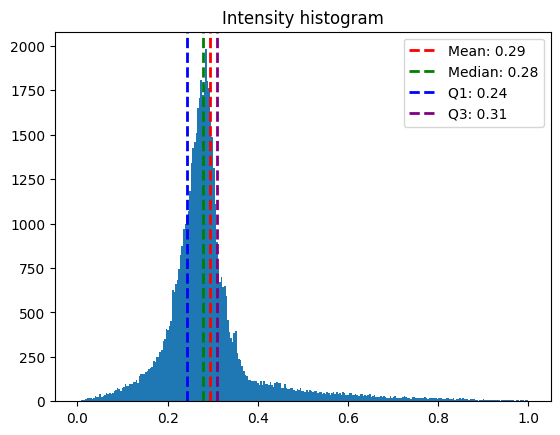

Inclusion Areas:  [  17. 1345.   11.   11.   46.   18.   39.  126.   18.   16.   13.   31.
  113.   20.   66.   84.   13.]


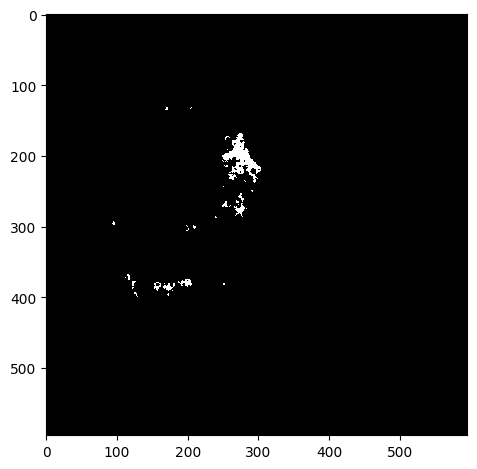

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_04.czi
Red Channel


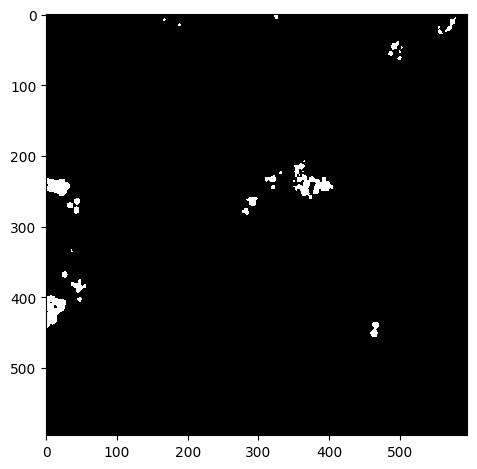

Green Channel


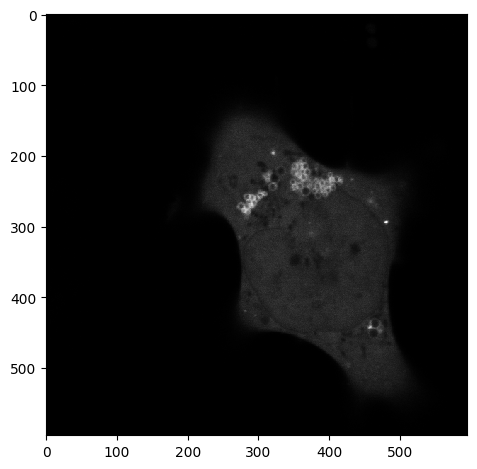

Segmented Cells


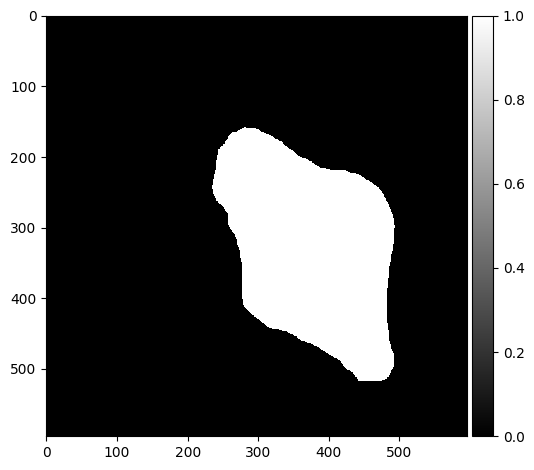

Threshold:  0.5
Bin count 383


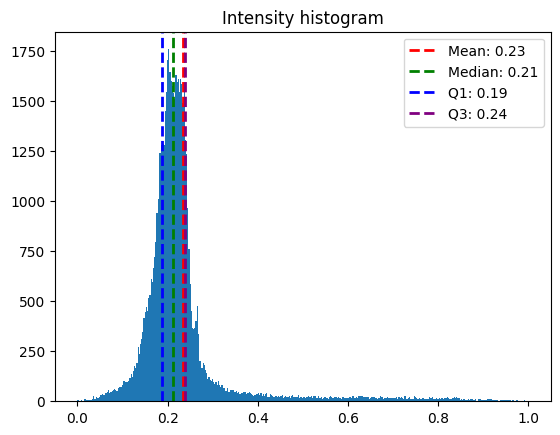

Inclusion Areas:  [ 12.  79.  21.  84. 153.  12.  30.  25. 266.  14.  17.]


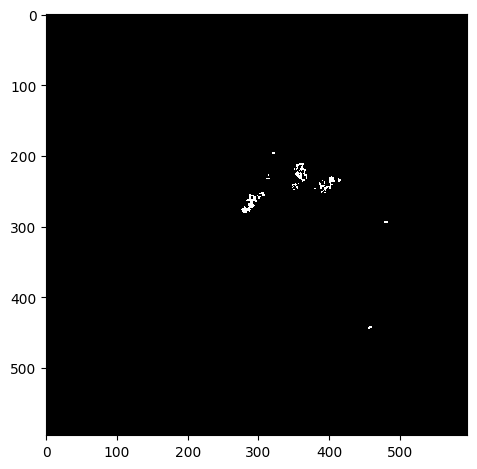

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_05.czi
Red Channel


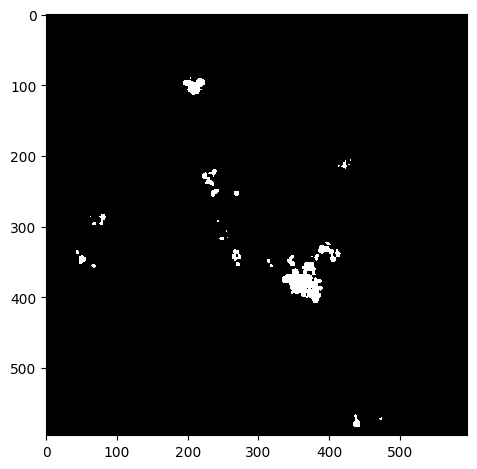

Green Channel


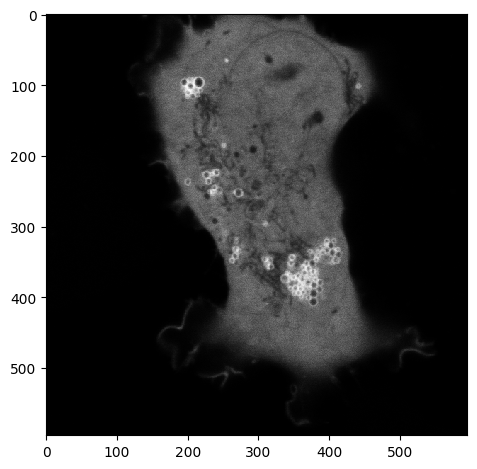

Segmented Cells


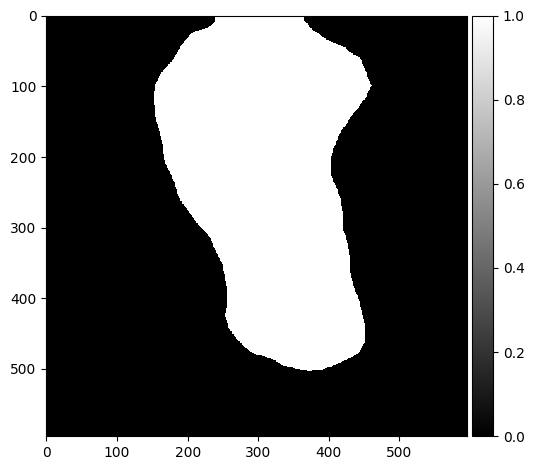

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_06.czi
Red Channel


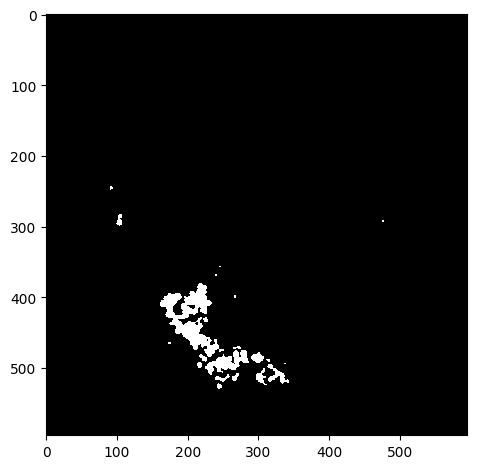

Green Channel


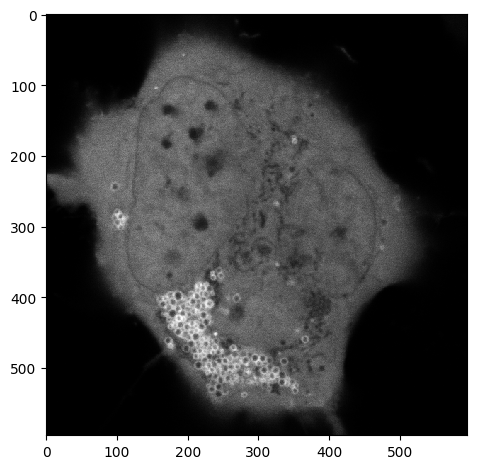

Segmented Cells


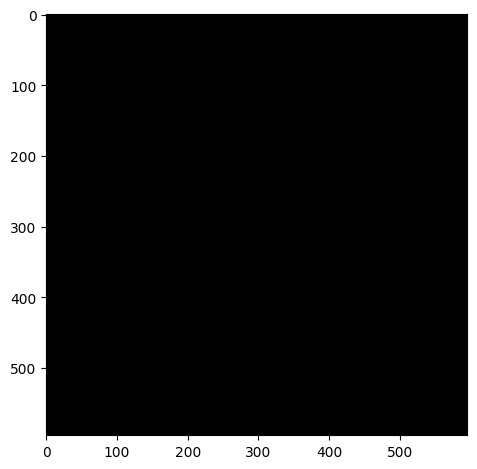

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_01.czi
Red Channel


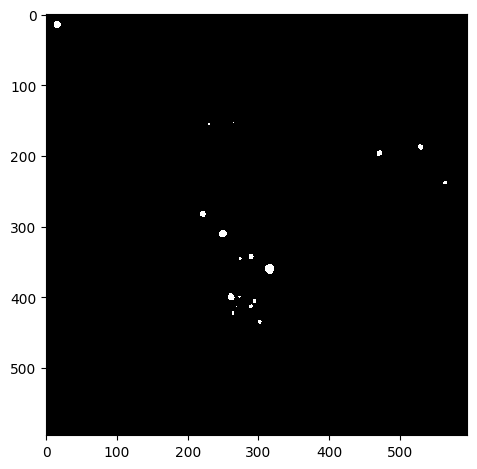

Green Channel


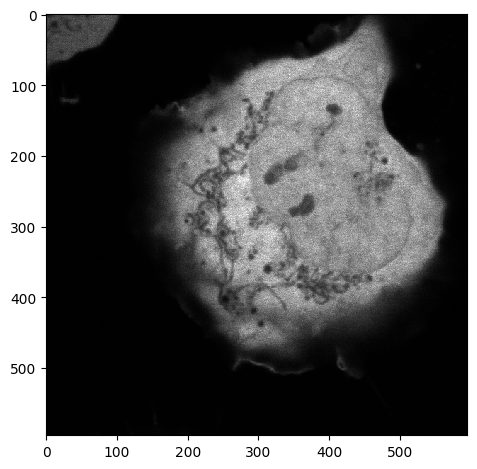

Segmented Cells


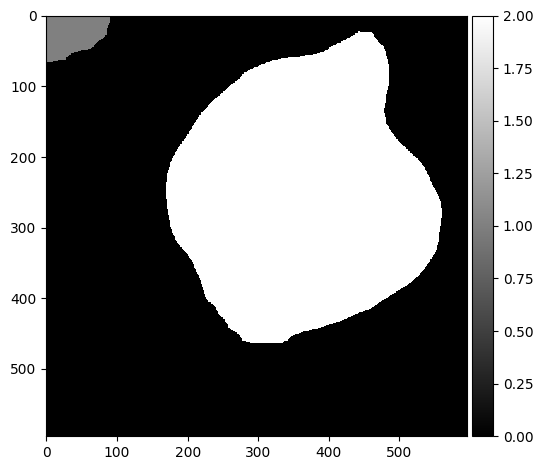

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_02.czi
Red Channel


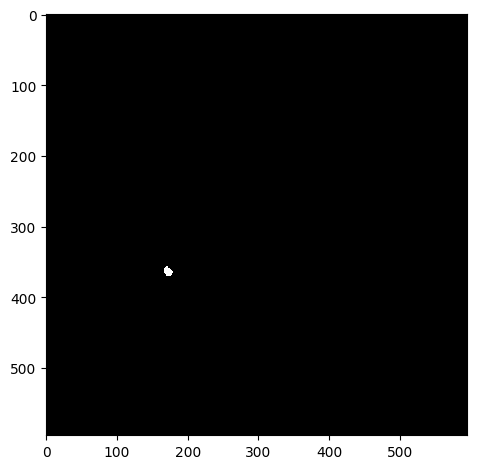

Green Channel


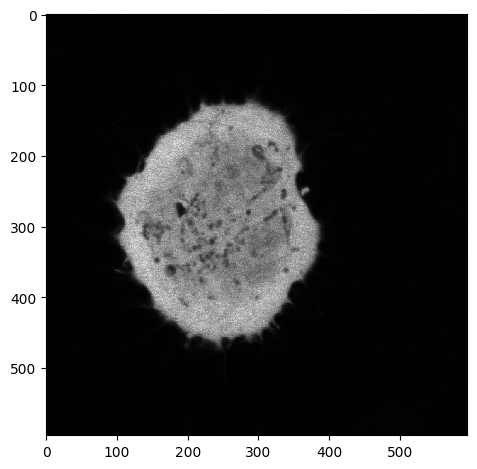

Segmented Cells


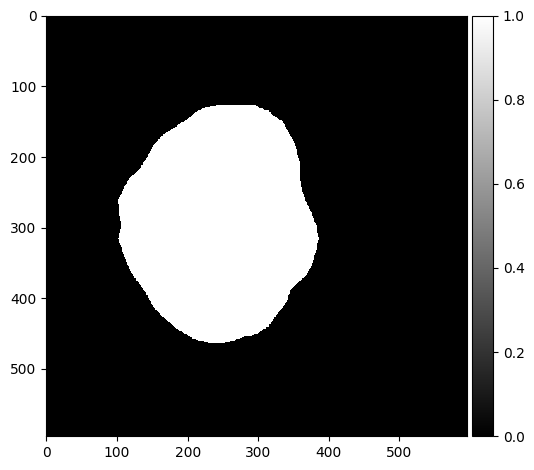

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_03.czi
Red Channel


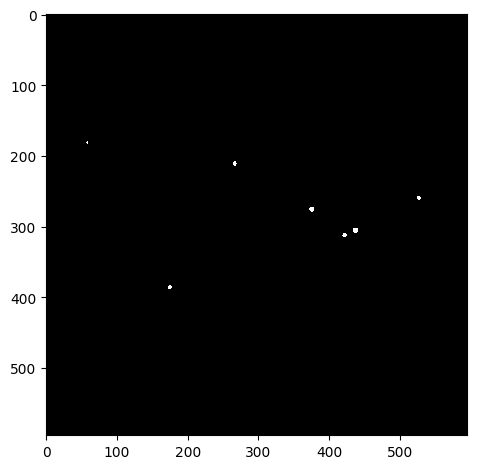

Green Channel


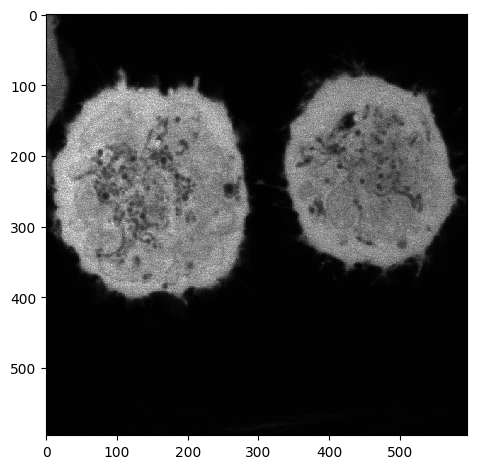

Segmented Cells


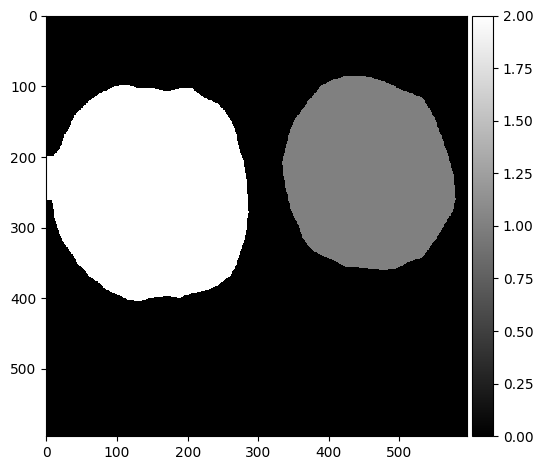

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_04.czi
Red Channel


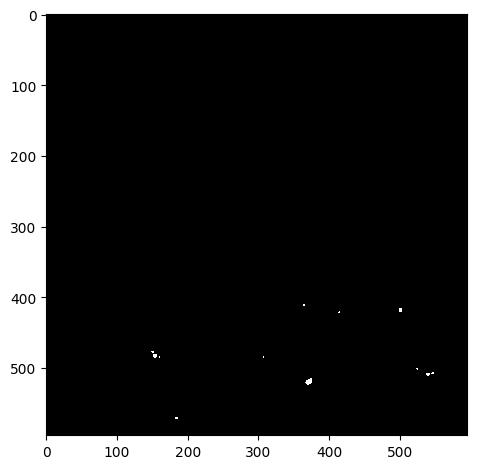

Green Channel


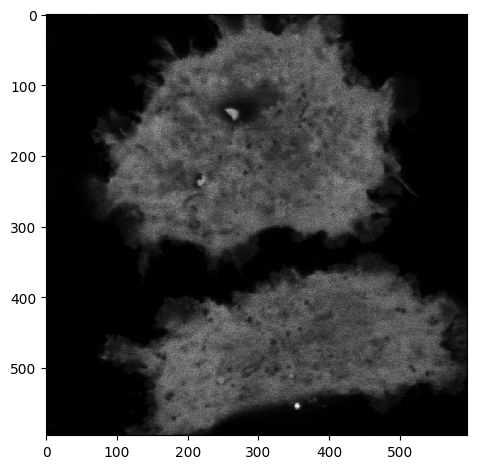

Segmented Cells


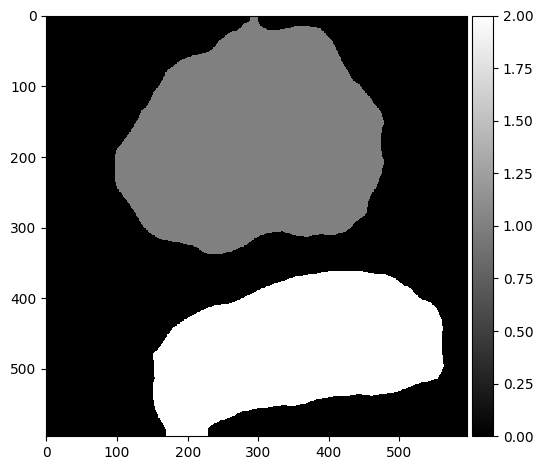

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_05.czi
Red Channel


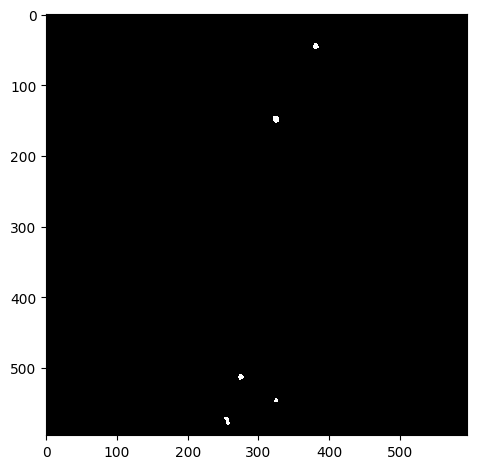

Green Channel


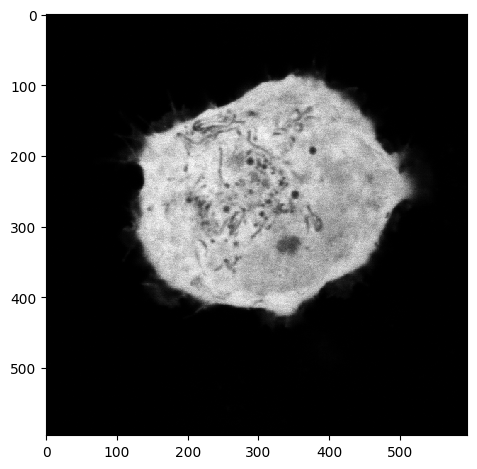

Segmented Cells


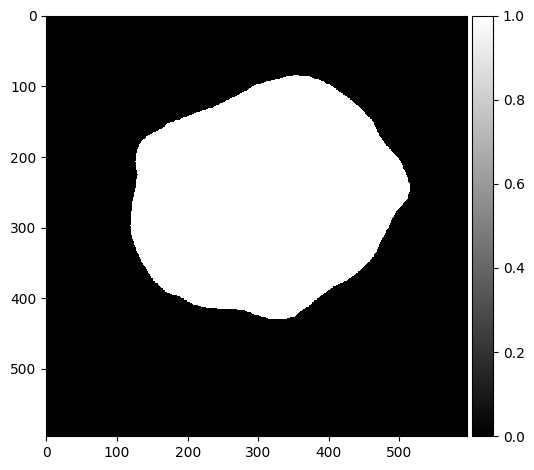

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_06.czi
Red Channel


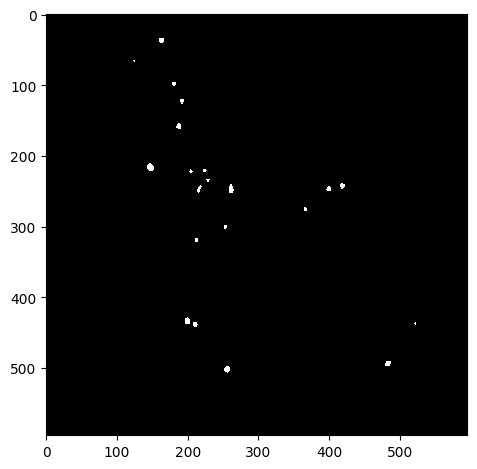

Green Channel


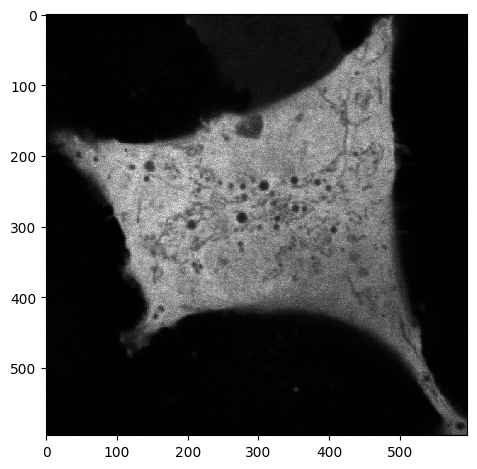

Segmented Cells


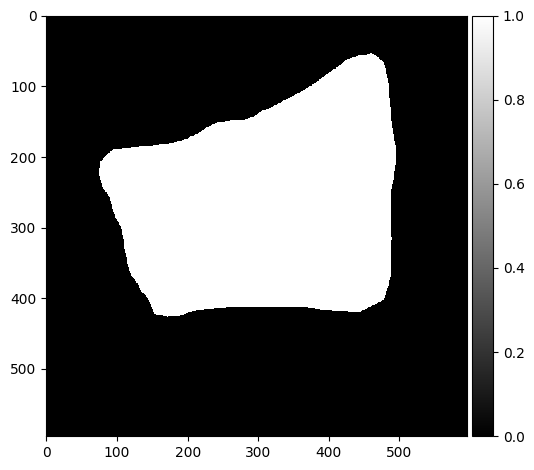

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_01.czi
Red Channel


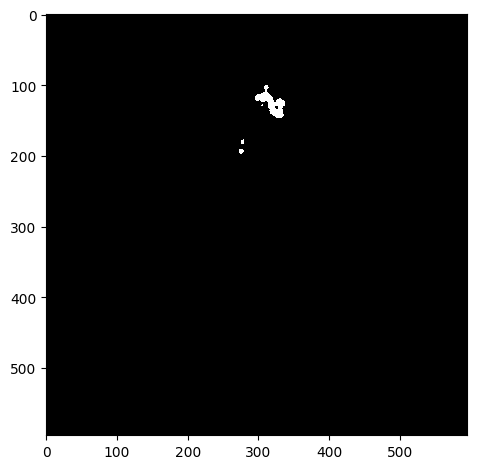

Green Channel


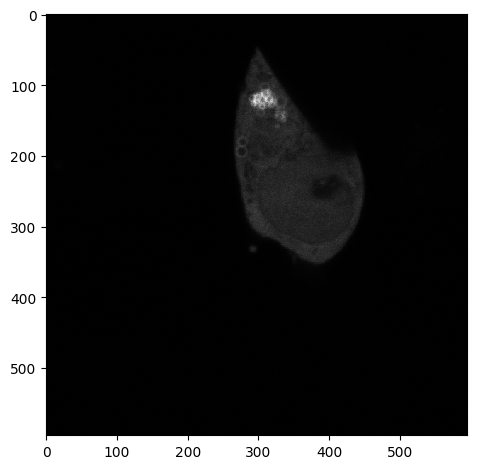

Segmented Cells


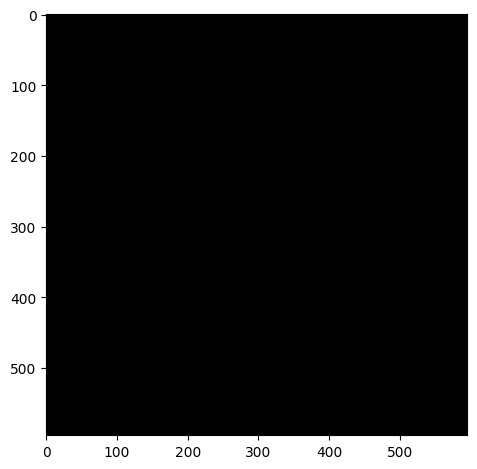

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_02.czi
Red Channel


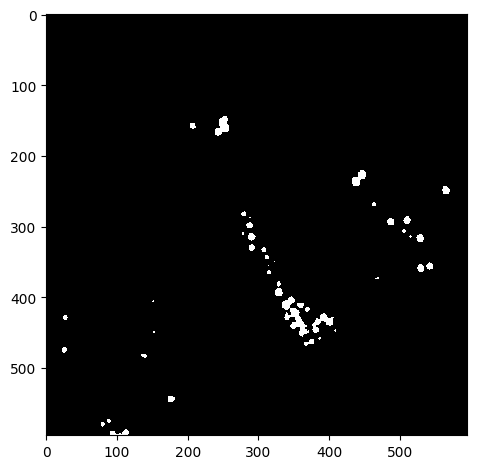

Green Channel


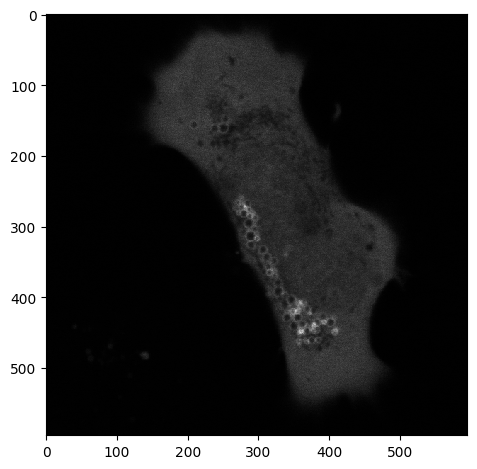

Segmented Cells


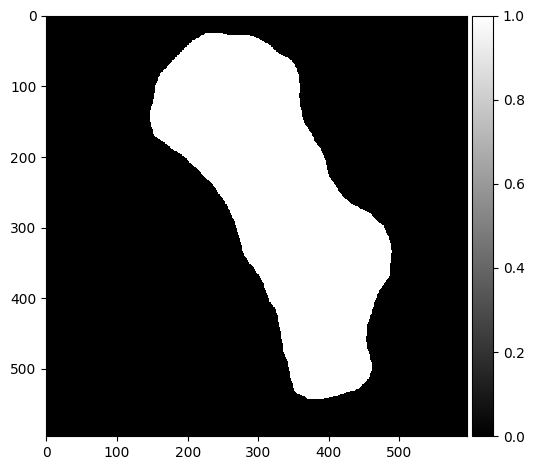

Threshold:  0.5
Bin count 186


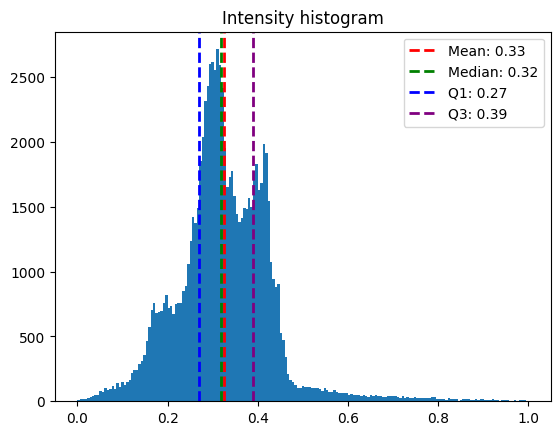

Inclusion Areas:  [25. 18. 46. 50. 45. 11.]


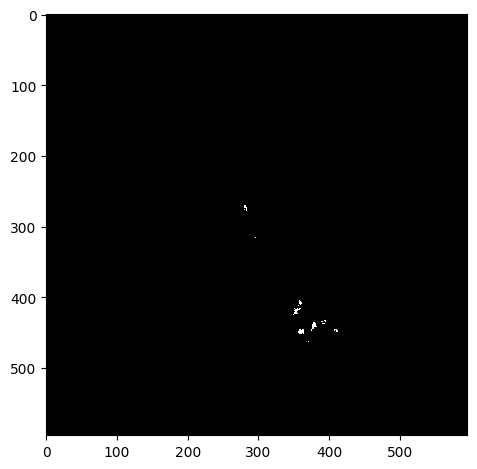

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_03.czi
Red Channel


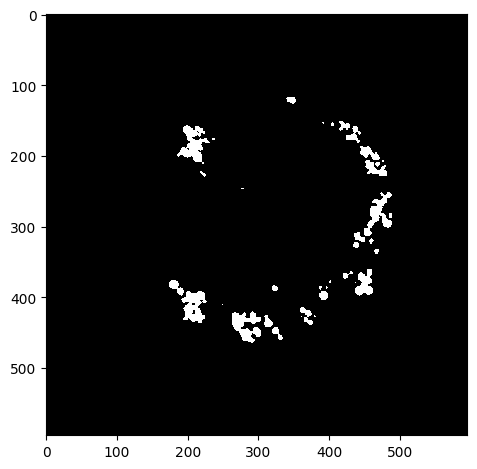

Green Channel


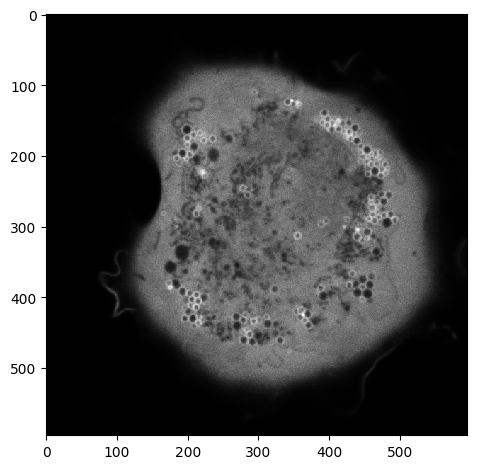

Segmented Cells


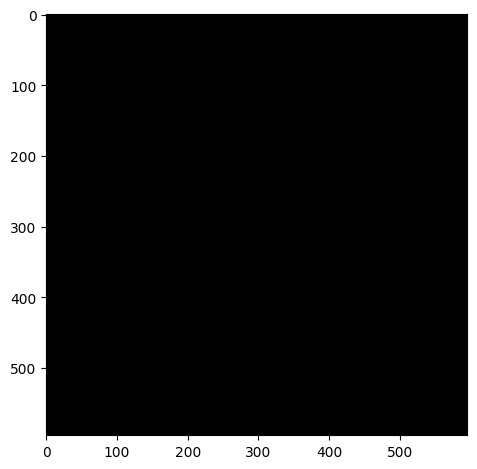

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_04.czi
Red Channel


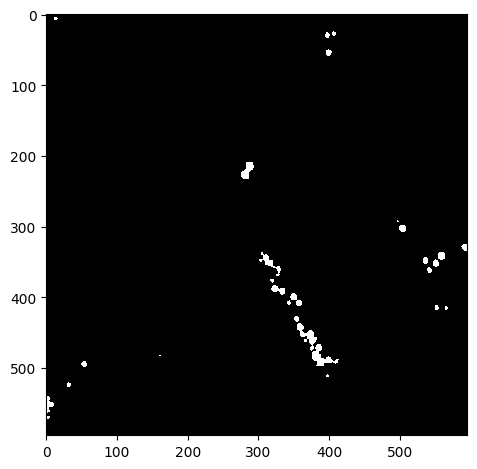

Green Channel


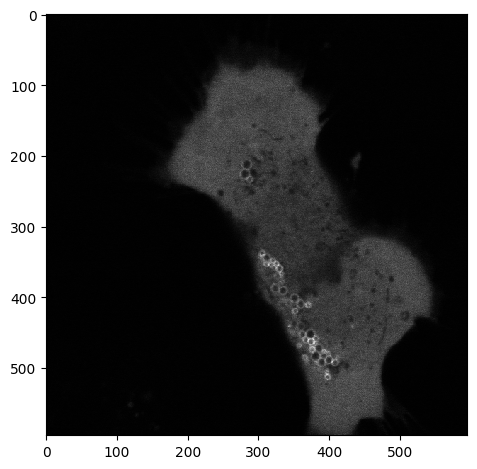

Segmented Cells


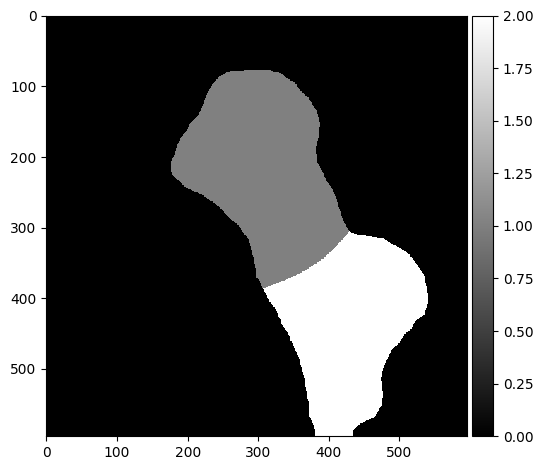

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_05.czi
Red Channel


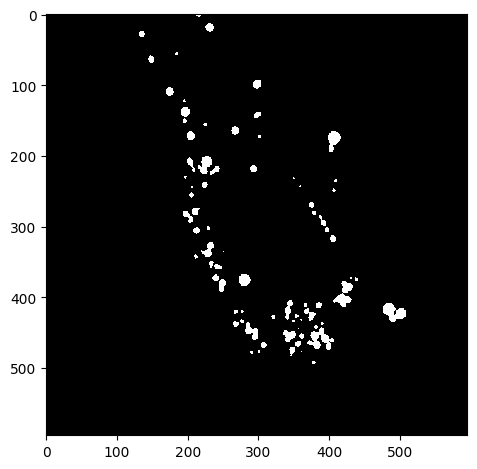

Green Channel


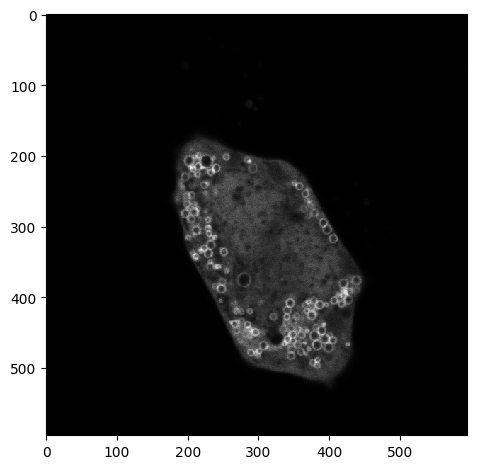

Segmented Cells


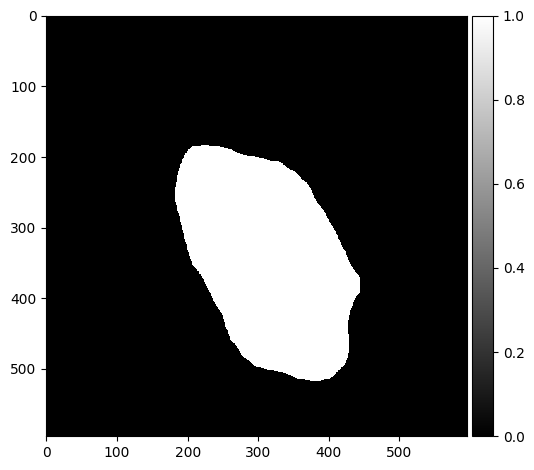

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_06.czi
Red Channel


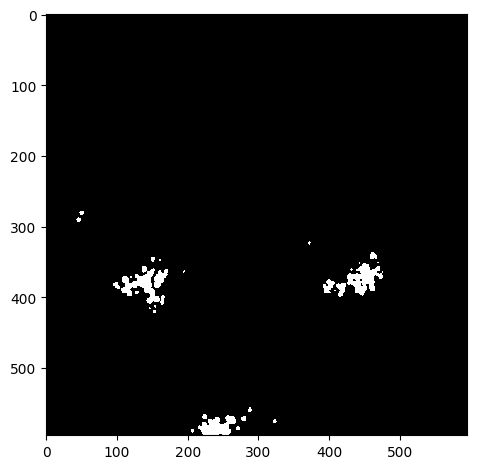

Green Channel


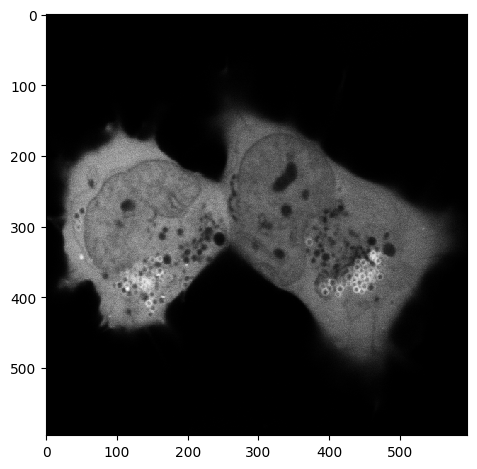

Segmented Cells


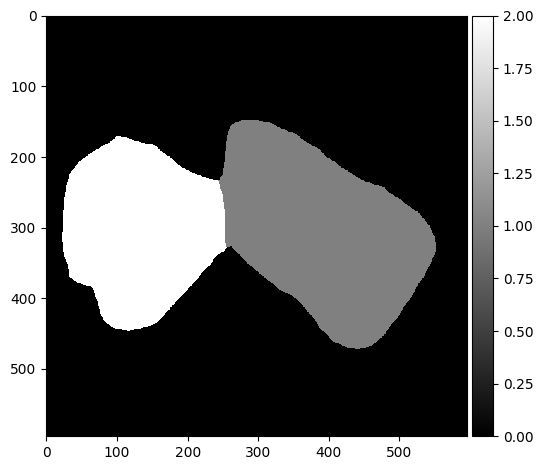

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [28]:

for folder in folders:
    analyze_all_images(folder)
